### **Consigna**
En este proyecto profundizarás lo desarrollado en el proyecto 01 (“Primer modelo de Machine Learning”). El objetivo es aplicar las técnicas incorporadas (Transformación de Datos, Optimización de Hiperparámetros, Modelos Avanzados, etc.) para generar un modelo que tenga un mejor desempeño que el modelo generado en el proyecto anterior. Luego, interpreta ese modelo para responder la siguiente pregunta: ¿qué podemos aprender de nuestro problema estudiando el modelo que generamos?

### **PARTE A - Transformación de Datos**

Elige cuáles de las siguientes tareas son apropiadas para su dataset. Implementa las transformaciones que elegiste. Es importante que justifiques por qué las haces:

1. Detección y eliminación de Outliers
2. Encoding
3. Imputación de valores faltantes
4. Escalado de datos
5. Generación de nuevas variables predictoras/reducción de dimensionalidad (SVD/PCA).

Vuelve a entrenar el modelo implementado en la Entrega 01 - en particular, el árbol de decisión - con este nuevo dataset transformado. Evalúa su desempeño a partir del dataset obtenido luego de transformar los datos. ¿Hay una mejora en su desempeño? Compara con el desempeño obtenido en el proyecto 01. Sea cual sea la respuesta, intenta explicar a qué se debe.

### **ANÁLISIS EXPLORATORIO DE DATOS**

In [1]:
import pandas as pd # Importo la a de pandas para poder importar los datos en formato DataFrame
import numpy as np # Importo numpy para operar sobre los datos
import matplotlib.pyplot as plt # Importo esta librería para graficar el comportamiento de los datos, como se relacionan entre ellos y cuales son los features más relevantes
import seaborn as sns #Importo esta librería para graficar el comportamiento de los datos, como se relacionan entre ellos y cuales son los features más relevantes

In [2]:
# Creo el Dataframe
df = pd.read_csv(r"C:\Users\Gabriel\OneDrive\Documentos\OneDrive\DATA SCIENCE\PROYECTOS\Proyecto 2\DS_Proyecto_01_Datos_Properati.csv") # A través de la función de pandas genero un DataFrame a partir del archivo "Valores separados por comas".
df.head()

,start_date,end_date,created_on,lat,lon,l1,l2,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,currency,title,description,property_type,operation_type
0,2019-10-17,2019-12-23,2019-10-17,-34.605880,-58.384949,Argentina,Capital Federal,San Cristobal,7.0,7.0,2.0,140.0,140.0,153000.0,USD,"***Venta semipiso centro, ideal hostel*****",DESCRIPCION DE LA PROPIEDAD: Departamento de 1...,Departamento,Venta
1,2019-10-17,2019-11-21,2019-10-17,-34.624056,-58.412110,Argentina,Capital Federal,Boedo,2.0,1.0,2.0,70.0,58.0,159000.0,USD,Espectacular PH reciclado en Boedo sin expensas.,PH reciclado en Boedo a una cuadra de la plaz...,PH,Venta
2,2019-10-17,2019-11-01,2019-10-17,-34.593569,-58.427474,Argentina,Capital Federal,Palermo,2.0,1.0,1.0,45.0,45.0,125000.0,USD,Depto.tipo casa de 2 ambientes en Venta en Pal...,"2 ambienets amplio , excelente estado , patio ...",PH,Venta
3,2019-10-17,2019-12-23,2019-10-17,-34.581294,-58.436754,Argentina,Capital Federal,Palermo,2.0,1.0,1.0,85.0,50.0,295000.0,USD,COSTA RICA 5800 / PALERMO HOLLYWOOD / VENTA PH...,HERMOSO PH EN PALERMO!!!2 AMBIENTES TOTALMENTE...,PH,Venta
4,2019-10-17,2020-03-11,2019-10-17,-34.914194,-57.938219,Argentina,Bs.As. G.B.A. Zona Sur,La Plata,2.0,1.0,1.0,50.0,35.0,40000.0,USD,58 entre 1 y 2 Venta de departamento en ph.1 ...,58 entre 1 y 2 Venta de departamento en PH. P...,PH,Venta


In [3]:
df.shape

(146660, 19)

Este DataFrame tiene muchas columnas que no aportan información para predecir el precio de una propiedad, que es el objetivo del proyecto. A continuación voy a justificar por qué voy a eliminar algunas columnas del dataframe:

1. Columnas con fechas: En Argentina las propiedades se venden en dolares y no hay mucha variación en los precios de venta. Sin embargo, a la hora de sacar el modelo a producción habría que aclarar que la predicción de los precios podría cambiar si hay variaciones en general en los precios del mercado inmobiliario y aclarar la fecha en que se realizó este modelo para luego determinar si es necesario actualizarlo o no.

2. Las columnas "title"	y "description" tienen información que se repite en otras variables, es información desordenada y muchas veces con errores (ej: no coincide el tipo de propiedad en título o descripción con la columna "property_type").

3. La variable "l1", "currency", y "operation_type" parecen poseer valores únicos que no aportandemasiada información para predecir el precio. Es sabido que el análisis se realiza para propiedades en Argntina, que la moneda de operación es Dolares americanos y que el tipo de operación es venta. De todas formas a continuación voy a verificar si estas columnas contienen información redundante en cada fila: 

In [4]:
print(df.l1.unique()) #Esta función de pandas me devuelve los valores únicos contenidos en la columna

['Argentina']


In [5]:
print(df.currency.unique()) #Esta función de pandas me devuelve los valores únicos contenidos en la columna

['USD']


In [6]:
print(df.operation_type.unique()) #Esta función de pandas me devuelve los valores únicos contenidos en la columna

['Venta']


Como podemos ver las variables "l1", "currency", y "operation_type" tienen valores únicos y repetidos que no aportan información para la predicción de precios de propeiadades. 

**Eliminación de columnas**

In [7]:
df1 = df.drop(['start_date','end_date','created_on', 'l1', 'title', 'description','currency','title', 'operation_type'], axis=1)

In [8]:
df1.head(2)

,lat,lon,l2,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,property_type
0,-34.605880,-58.384949,Capital Federal,San Cristobal,7.0,7.0,2.0,140.0,140.0,153000.0,Departamento
1,-34.624056,-58.412110,Capital Federal,Boedo,2.0,1.0,2.0,70.0,58.0,159000.0,PH


In [9]:
df2=df1.rename(columns={"lat": "Latitud", "lon": "Longitud", 'l2': 'ZonaBA_CABA', 'l3': 'Barrio_Ciudad', 'rooms': 'Habitaciones', 'bedrooms':'Dormitorios', 'bathrooms':'Baños', 'surface_total': 'Superficie_Total', 'surface_covered': 'Superficie_cubierta', 'price':'Precio', 'property_type':'Tipo_de_propiedad'})

In [10]:
df2.shape

(146660, 11)

In [11]:
df2.dtypes

Latitud                float64
Longitud               float64
ZonaBA_CABA             object
Barrio_Ciudad           object
Habitaciones           float64
Dormitorios            float64
Baños                  float64
Superficie_Total       float64
Superficie_cubierta    float64
Precio                 float64
Tipo_de_propiedad       object
dtype: object

**ANÁLISIS DE DATOS FALTANTES**

In [12]:
print(df2.isnull().sum()) # Esta función de pandas muestra el número de valores faltantes por columnas del DataFrame Prop. 

Latitud                 9925
Longitud                9959
ZonaBA_CABA                0
Barrio_Ciudad              0
Habitaciones               0
Dormitorios                0
Baños                   5957
Superficie_Total       20527
Superficie_cubierta    21614
Precio                     0
Tipo_de_propiedad          0
dtype: int64


In [13]:
df2.isna().sum()/df2.shape[0]*100 # Calcula el porcentaje de valores faltantes de cada columna

Latitud                 6.767353
Longitud                6.790536
ZonaBA_CABA             0.000000
Barrio_Ciudad           0.000000
Habitaciones            0.000000
Dormitorios             0.000000
Baños                   4.061776
Superficie_Total       13.996318
Superficie_cubierta    14.737488
Precio                  0.000000
Tipo_de_propiedad       0.000000
dtype: float64

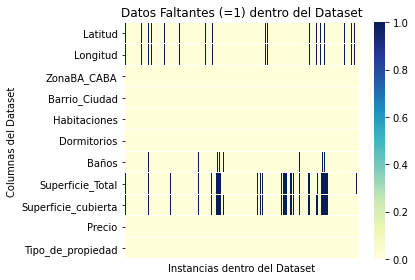

In [14]:
# Gráficamente podemos ver en color dónde están los datos faltantes dentro del dataset. 
# Este gráfico muestra los datos faltantes dentro de la estructura de datos.

null= df2.isnull()
heat=sns.heatmap(null.T, cmap='YlGnBu', xticklabels=False)
plt.title('Datos Faltantes (=1) dentro del Dataset')
plt.xlabel('Instancias dentro del Dataset')
plt.ylabel('Columnas del Dataset')
plt.tight_layout()

Conclusión de datos faltantes: Como podemos ver de los tres análisis realizados, la cantidad y posición de datos faltantes para Latitud y Longitud son prácticamente los mismos. Los datos faltantes para superficie cubierta y total son practicamente iguales salvo por un grupo de instancias ubicadas a la derecha de superficie total y un grupo de instancias ubicadas en el centro de superficie cubierta. En cuanto a la cantidad de datos flatantes, superficie cubierta posee 1087 (0,74%) más datos faltantes que superficie total. Para la variable baños la mayoría de los datos flatantes coinciden en posición con los datos faltantes de sup. cubierta y sup total. 

**ANÁLISIS DE DATOS ATIPICOS**

In [15]:
#Para ver los parametros estadísticos de mi Dataset aplico la función de Pandas "Describe"

df2.describe()

,Latitud,Longitud,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio
count,136735.000000,136701.000000,146660.000000,146660.000000,140703.000000,126133.000000,125046.000000,1.466600e+05
mean,-34.604896,-58.465304,3.079817,1.983240,1.599994,216.872888,112.818011,2.412211e+05
std,0.468428,0.486190,1.416352,1.151304,0.889324,2037.606649,916.857584,3.185195e+05
min,-35.318457,-180.000000,1.000000,0.000000,1.000000,10.000000,1.000000,5.500000e+03
25%,-34.627667,-58.504012,2.000000,1.000000,1.000000,52.000000,47.000000,1.110000e+05
50%,-34.600943,-58.443262,3.000000,2.000000,1.000000,78.000000,68.000000,1.660000e+05
75%,-34.574600,-58.407586,4.000000,3.000000,2.000000,140.000000,108.000000,2.650000e+05
max,85.051129,-57.805832,35.000000,15.000000,14.000000,193549.000000,126062.000000,3.243423e+07


Según los datos estadísticos obtenidos, las variables surface_total, surface_covered y price presentan una std muy grande (valores muy alejados de la media), además, presentan  valores min. y max. irracionales. En el caso de rooms, bedrooms y bathrooms presentan valores máximos muy alejados de la media.

Del análsis podemos ver si son errores o si son datos que me puedan aportar información. De cada variable surgen valores que resultan atípicos:

**Habitaciones:** El valor máximo de 26 es atípico, podría tratarse de un hotel, la media arroja un valor de 3. Sin embargo, el propósito del modelo es predecir el precio de propiedades tipo: Departamento, Casa o PH.  

**Dormitorios:** Aquí también destaca el valor máximo de 15 dormitorios que podría tratarse de un hotel.

**Baños:** Sucede lo mismo que con bedrooms

**Surperficie_Total y Superficie_cubierta:** Tienen valores máximos y mínimos atípicos. En el caso de surface_covered el valor mínimo de 1 mtr2 es un error en la carga de los datos,este valor no es lógico para ningún tipo de propiedad. 

**Precio:** En el caso del valor mínimo se trata de un error ya que no existe propiedad por más pequeña que sea con ese valor de venta. Es muy probable que haya sido un error de carga y se hayan confundido con el precio por metro cuadrado, ya que en la Ciudad de Buenos Aires, hay barrios como Puerto Madero donde los precios alcanzan ese valor por metro cuadrado. En el caso del valor máximo está dos ordenes por arriba del 75% de los datos, es un valor muy extremo el cual puede ser un error de carga de datos o un outlier real. 

Voy a explorar cuantas instancias hay de estos valores atípicos y ver si son errores o si son datos que me puedan aportar información. 

HABITACIONES

In [16]:
# Veamos cuantas instancias cumplen con el valor máximo de habitaciones.

habitaciones_atipicos=(df2[df2['Habitaciones']>=26])
habitaciones_atipicos.head(20) #La función head muestra hasta 5 instancias por default, por este motivo pido que me muestre hasta 20 instancias
#para ver realmente cuantas instancias poseen este valor.

,Latitud,Longitud,ZonaBA_CABA,Barrio_Ciudad,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio,Tipo_de_propiedad
19565,-34.909349,-57.971539,Bs.As. G.B.A. Zona Sur,La Plata,30.0,12.0,8.0,490.0,600.0,340000.0,Casa
28027,-34.537174,-58.712074,Bs.As. G.B.A. Zona Norte,San Miguel,32.0,1.0,1.0,32.0,32.0,52000.0,Departamento
31583,-34.637490,-58.362723,Capital Federal,Boca,26.0,15.0,7.0,845.0,835.0,750000.0,Casa
107256,-34.497715,-58.495460,Bs.As. G.B.A. Zona Norte,Vicente López,35.0,2.0,1.0,167.0,110.0,280000.0,PH
111651,-34.637490,-58.362723,Capital Federal,Boca,26.0,15.0,7.0,845.0,835.0,750000.0,Casa


Por lo que se puede ver las instancias 28027 y 107256 poseen errores en la carga de datos ya que los valores de las otras variables no son proporcionales. El resto de las propiedades no parecen tener errores ya que los valores de las variables son proporcionales. Estas propiedades podrían tratarse de un hospedaje tanto por sus características como por la zona donde está ubicada. Si embargo, consideraré estas propiedades como outlier ya que se alejan mucho de la media. Recordemos que el objetivo del modelo es predecir viviendas no alojamientos, por este motivo voy a eliminar estas instancias del dataset. 

DORMITORIOS

In [17]:
# Veamos cuantas instancias cumplen con el valor máximo de dormitorios.Retomo del dataframe que cree para eliminer outliers de rooms

dormitorios_atipicos=(df2[df2['Dormitorios']>=15])
dormitorios_atipicos.head(20) #La función head muestra hasta 5 instancias por default, por este motivo pido que me muestre hasta 20 instancias
#para ver realmente cuantas instancias poseen este valor.

,Latitud,Longitud,ZonaBA_CABA,Barrio_Ciudad,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio,Tipo_de_propiedad
8843,-34.630209,-58.364202,Capital Federal,Boca,2.0,15.0,1.0,47.0,44.0,100000.0,Departamento
31583,-34.637490,-58.362723,Capital Federal,Boca,26.0,15.0,7.0,845.0,835.0,750000.0,Casa
34580,-34.566175,-58.451666,Capital Federal,Belgrano,16.0,15.0,4.0,476.0,297.0,500000.0,PH
44167,-34.566175,-58.451666,Capital Federal,Belgrano,16.0,15.0,4.0,476.0,297.0,500000.0,PH
69101,-34.566175,-58.451666,Capital Federal,Belgrano,16.0,15.0,4.0,476.0,297.0,500000.0,PH
111651,-34.637490,-58.362723,Capital Federal,Boca,26.0,15.0,7.0,845.0,835.0,750000.0,Casa


De las 5 propiedades detectadas con 15 dormitorios 3 están repetidas. Por su superficie también podría tratarse de un alojamiento aunque está catalogado como PH y también la trataría como outlier por encontrarse muy alejada de la media. Recordemos que el objetivo del modelo es predecir viviendas no alojamientos.Lo mismo aplica para la instancia 31583.  
Por último, puedo afirmar que la instancia 8843 está mal cargada, una propiedad con 2 habitaciones y 15 dormitorios no puede tener un baño y una superficie total de 47 mtrs2. A continuación voy a eliminar estas instancias. 

BAÑOS

In [18]:
# Veamos cuantas instancias cumplen con el valor máximo de Baños

baños_atipicos=(df2[df2['Baños']>=14])
baños_atipicos.head(20) #La función head muestra hasta 5 instancias por default, por este motivo pido que me muestre hasta 20 instancias
#para ver realmente cuantas instancias poseen este valor.

,Latitud,Longitud,ZonaBA_CABA,Barrio_Ciudad,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio,Tipo_de_propiedad
35960,-34.576782,-58.423782,Capital Federal,Palermo,2.0,1.0,14.0,50.0,50.0,225000.0,Departamento
44877,NaN,NaN,Bs.As. G.B.A. Zona Norte,Tigre,3.0,2.0,14.0,75.0,75.0,185000.0,Departamento
97314,-34.915804,-57.960653,Bs.As. G.B.A. Zona Sur,La Plata,3.0,2.0,14.0,114.0,57.0,14000.0,Departamento
132709,NaN,NaN,Capital Federal,Recoleta,2.0,1.0,14.0,45.0,45.0,159000.0,Departamento
136930,NaN,NaN,Capital Federal,Recoleta,2.0,1.0,14.0,45.0,45.0,159000.0,Departamento
144020,NaN,NaN,Bs.As. G.B.A. Zona Norte,Tigre,3.0,2.0,14.0,75.0,75.0,185000.0,Departamento


En este caso podemos afirmar que se tratan de errores ya que es irracional tener 14 baños en 45, 50 o 75 mtrs2. Voy a eliminar estas instancias

SUPERFICIE TOTAL 

In [19]:
# Veamos cuantas instancias cumplen con el valor máximo de superficie total. 
superficie_total_atipicos=(df2[df2['Superficie_Total']>=193549])
superficie_total_atipicos.head()

,Latitud,Longitud,ZonaBA_CABA,Barrio_Ciudad,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio,Tipo_de_propiedad
37585,-35.016891,-58.381104,Bs.As. G.B.A. Zona Sur,San Vicente,5.0,4.0,3.0,193549.0,NaN,600000.0,Otro
61083,-35.016891,-58.381104,Bs.As. G.B.A. Zona Sur,San Vicente,5.0,4.0,3.0,193549.0,NaN,600000.0,Otro


En estecaso se trata de una propiedad que se encuentra repetida y está por fuera de los criterios de seleccion de propiedades para el modelo. 

In [20]:
 # Veamos cuantas instancias  cumplen con el valor mínimo de superficie total. 

superficie_total_atipicos=(df2[df2['Superficie_Total']<=10])
superficie_total_atipicos.head(20)#La función head muestra hasta 5 instancias por default, por este motivo pido que me muestre hasta 20 instancias
#para ver realmente cuantas instancias poseen este valor.

,Latitud,Longitud,ZonaBA_CABA,Barrio_Ciudad,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio,Tipo_de_propiedad
37663,-34.648557,-58.613117,Bs.As. G.B.A. Zona Oeste,Morón,2.0,1.0,1.0,10.0,42.0,69000.0,Departamento
40807,-34.403272,-58.654060,Bs.As. G.B.A. Zona Norte,Tigre,4.0,3.0,2.0,10.0,10.0,270000.0,Departamento
73182,-34.677521,-58.488056,Capital Federal,Villa Lugano,2.0,1.0,1.0,10.0,45.0,220000.0,PH
75104,-34.567004,-58.523846,Bs.As. G.B.A. Zona Norte,General San Martín,3.0,2.0,1.0,10.0,10.0,68000.0,PH
107033,-34.643881,-58.696121,Bs.As. G.B.A. Zona Oeste,Ituzaingó,2.0,1.0,NaN,10.0,47.0,55000.0,PH
132438,-34.568031,-58.453826,Capital Federal,Belgrano,3.0,2.0,1.0,10.0,78.0,160000.0,Departamento
143339,-34.403272,-58.654060,Bs.As. G.B.A. Zona Norte,Tigre,4.0,3.0,2.0,10.0,10.0,270000.0,Departamento


En este caso es claro que hubo un error en la carga de los valores de superficie total ya que no puede ser menor que la superficie cubierta. En el caso de la instancia 40807 una propiedad de 10 mtrs2 no puede tener 4 habitaciones!

SUPERFICIE CUBIERTA

In [21]:
# Veamos cuantas instancias cumplen con el valor máximo de superficie cubierta. 

superficie_cubierta_atipicos=(df2[df2['Superficie_cubierta']>=126062])
superficie_cubierta_atipicos.head()

,Latitud,Longitud,ZonaBA_CABA,Barrio_Ciudad,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio,Tipo_de_propiedad
13243,-34.606165,-58.455126,Capital Federal,Caballito,5.0,4.0,3.0,126062.0,126062.0,220000.0,PH
90235,-34.606165,-58.455126,Capital Federal,Caballito,5.0,4.0,3.0,126062.0,126062.0,215000.0,PH


En este caso podemos afirmar que es un error de carga de datos. 

In [22]:
# Veamos cuantas instancias cumplen con el valor mínimo de superficie cubierta. 
Superficie_cubierta_outlier=(df2[df2['Superficie_cubierta']==1])
Superficie_cubierta_outlier.tail(20)#La función head muestra hasta 5 instancias por default, por este motivo pido que me muestre hasta 20 instancias
#para ver realmente cuantas instancias poseen este valor.

,Latitud,Longitud,ZonaBA_CABA,Barrio_Ciudad,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio,Tipo_de_propiedad
117068,-34.879264,-58.073565,Bs.As. G.B.A. Zona Sur,La Plata,7.0,3.0,2.0,323.0,1.0,127000.0,Casa
117688,-34.575215,-58.483335,Capital Federal,Villa Urquiza,2.0,1.0,1.0,NaN,1.0,94900.0,Departamento
129218,-34.572157,-58.494807,Capital Federal,Villa Urquiza,3.0,2.0,1.0,NaN,1.0,285000.0,Departamento
131428,-34.637387,-58.460688,Capital Federal,Flores,4.0,3.0,1.0,229.0,1.0,210000.0,PH
132080,-34.652585,-58.826807,Bs.As. G.B.A. Zona Oeste,Moreno,6.0,3.0,1.0,NaN,1.0,115000.0,Casa
132152,-34.879264,-58.073565,Bs.As. G.B.A. Zona Sur,La Plata,7.0,3.0,2.0,323.0,1.0,105000.0,Casa
134165,-34.667069,-58.472989,Capital Federal,Villa Lugano,3.0,2.0,1.0,NaN,1.0,80000.0,Departamento
135154,-34.609056,-58.421322,Capital Federal,Almagro,2.0,1.0,1.0,NaN,1.0,132000.0,Departamento
135155,-34.609056,-58.421322,Capital Federal,Almagro,2.0,1.0,1.0,NaN,1.0,138600.0,Departamento
135156,-34.630782,-58.520844,Capital Federal,Versalles,3.0,2.0,1.0,NaN,1.0,115000.0,Departamento


Por lo que veo en el "head" hay más de 5 instancias con valor de superficie cubierta igua a 1. Vamos a ver cuantas instancias son:

In [23]:
Superficie_cubierta_outlier.count()

Latitud                79
Longitud               79
ZonaBA_CABA            81
Barrio_Ciudad          81
Habitaciones           81
Dormitorios            81
Baños                  79
Superficie_Total       16
Superficie_cubierta    81
Precio                 81
Tipo_de_propiedad      81
dtype: int64

Claramente este valor mínimo en superfiie cubierta es un error. Los datos entre las otras variables y la variable precios (a predecir por el modelo) son coherentes, sin embargo, la variable superficie total posee datos faltantes para este valor de la variable superficie curbierta. Al no tener los datos de superficie en ninguna de las dos variables es más dificil imputar estos datos faltantes por este motivo voy a eliminar estas instancias (representan el 0,06% del dataset).  

PRECIO

In [24]:
# Veamos cuantas instancias cumplen con el valor máximo de la variable precio.  
precio_outlier=(df2[df2['Precio']>=3.243423e+07])
precio_outlier.head()

,Latitud,Longitud,ZonaBA_CABA,Barrio_Ciudad,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio,Tipo_de_propiedad
76894,-34.593956,-58.415855,Capital Federal,Palermo,1.0,1.0,4.0,43.0,43.0,32434232.0,Departamento


Claramente esta propiedad está mal cargada. Los valores son irracionales. Voy a eliminar esta instancia

In [25]:
# Veamos cuantas instancias cumplen con el valor mínimo de la variable precio.  

precio_outlier=(df2[df2['Precio']<= 6.000000e+03])
precio_outlier.head()

,Latitud,Longitud,ZonaBA_CABA,Barrio_Ciudad,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio,Tipo_de_propiedad
62989,-34.581950,-58.401669,Capital Federal,Palermo,5.0,4.0,4.0,340.0,320.0,6000.0,Departamento
78075,-34.341616,-58.886250,Bs.As. G.B.A. Zona Norte,Escobar,1.0,1.0,NaN,920.0,NaN,5500.0,Lote
96337,NaN,NaN,Capital Federal,Puerto Madero,5.0,3.0,3.0,195.0,195.0,6000.0,Departamento
102589,-34.591283,-58.389310,Capital Federal,Recoleta,3.0,2.0,2.0,340.0,200.0,6000.0,Departamento
117012,-34.611075,-58.362588,Capital Federal,Puerto Madero,3.0,2.0,3.0,275.0,220.0,6000.0,Departamento


El precio está mal cargado para estas instancias. El precio que figura es el precio por metro cuadrado en promedio para estos barrios de la Ciudad de Buenos Aires. Voy a corregir este error multiplicando el valor del mtr2 por la superficie cubierta promedio. La instancia 78075 la voy a eliminar más adelante. 

In [26]:
df2['Precio'].replace(6000.0, (6000*229), inplace=True)  

Tomo dos instancias y chequeo que se hayan producido los cambios:

In [27]:
#Chequeo que se hayan producido los cambios
df2.loc[[96337]]

,Latitud,Longitud,ZonaBA_CABA,Barrio_Ciudad,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio,Tipo_de_propiedad
96337,NaN,NaN,Capital Federal,Puerto Madero,5.0,3.0,3.0,195.0,195.0,1374000.0,Departamento


In [28]:
#Chequeo que se hayan producido los cambios
df2.loc[[62989]]

,Latitud,Longitud,ZonaBA_CABA,Barrio_Ciudad,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio,Tipo_de_propiedad
62989,-34.58195,-58.401669,Capital Federal,Palermo,5.0,4.0,4.0,340.0,320.0,1374000.0,Departamento


**ANÁLISIS Y ELIMINACIÓN DE DATOS ATÍPICOS (VALORES EXTREMOS)**

Como comprobamos en el análisis exploratorio los valores máximos y mínimos (para alguna de las variables) se deben a errores de carga de los datos o son propiedades que quedan por fuera del objetivo del modelo predictivo que se quiere desarrollar (Departamentos, Casas y PHs).  

- Voy analizar solo valores extremos de las variables numéricas para evitar que distorsionen la distribución de los datos y su valor medio. 

- Luego de analizar los valores extremos voy ajustar los valores de las variables numéricas a los limites establecidos en el proyecto 1 para poder comprar la performance de los modelos. Estos valores son: 
    - Propiedades cuya superficie total y cubierta es menor a 1000 m2 y mayor a 14 m2.
    - Precio de propiedades entre 2 millones y 33 mil dólares.
    - Baños con valor máximo de 4 
    - Habitaciones con valor máximo de 7
    - Dormitorios con valor máximo de 6

**PRECIO**

In [29]:
df2.Precio.describe()

count    1.466600e+05
mean     2.412584e+05
std      3.185720e+05
min      5.500000e+03
25%      1.110000e+05
50%      1.660000e+05
75%      2.650000e+05
max      3.243423e+07
Name: Precio, dtype: float64

Podemos observar que hay valores máximos y mínimos 2 ordenes de magnitud superior o inferior a la media. Son valores desproporcionados respecto al de una propiedad promedio.

<AxesSubplot:ylabel='Precio'>

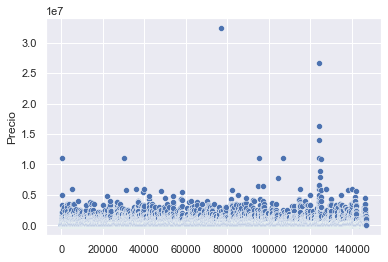

In [30]:
import pandas as pd 
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

sns.scatterplot(x=df2.index, y=df2.Precio, data=df2)

Lo que podemos observar es que la mayoría de los valores atípicos están arriba de US$ 5 millones, sin embargo, voy a tomar un valor máximo igual a 2 millones como en el proyecto 1

In [31]:
# Voy aplicar limite  inferior de precios tomando comoreferecia el precio para propiedades con una superficie de 15 mtrs2 que es de aprox. USD 33000. 
df3= df2[df2.Precio > 2000000]
df4=df2[df2.Precio < 33000]
df5= df2.drop(df3.index, axis=0)
df6= df5.drop(df4.index, axis=0)

<AxesSubplot:ylabel='Precio'>

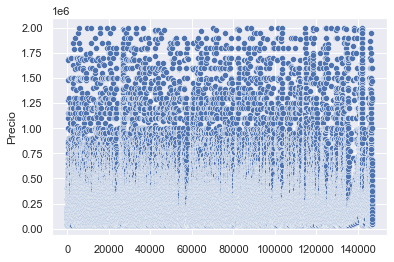

In [32]:
sns.scatterplot(x=df6.index, y=df6.Precio, data=df6)

Observo la distribución de los datos para esta variable antes y después de filtrar los datos:

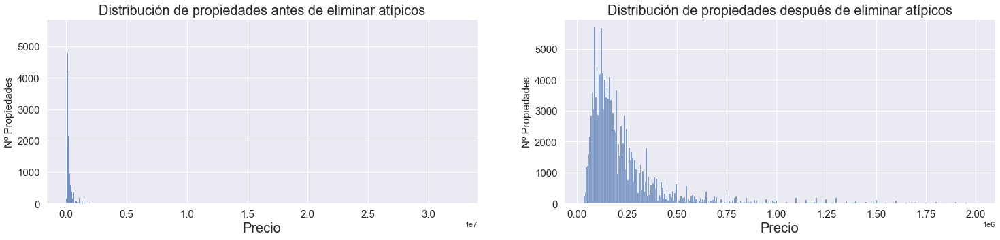

In [33]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(25,5))

sns.histplot(ax=ax1, x=df2.Precio)
sns.histplot(ax=ax2, x=df6.Precio)
ax1.set_title("Distribución de propiedades antes de eliminar atípicos",fontsize=20)
ax1.set_xlabel("Precio",fontsize=20)
ax1.set_ylabel("Nº Propiedades",fontsize=15)
ax1.tick_params(labelsize=15)
ax2.set_title("Distribución de propiedades después de eliminar atípicos",fontsize=20)
ax2.set_xlabel("Precio",fontsize=20)
ax2.set_ylabel("Nº Propiedades",fontsize=15)
ax2.tick_params(labelsize=15)
plt.show()

Al eliminar los valores máximos extremos podemos ver que la mayoría de las propiedades no supera el millon de dolares. 

In [34]:
# Creo un nuevo DataFrame para poder graficar los parámetros estadísticos antes de eliminar las instancias con datos atípicos 
Describe1=df2.Precio.describe() 
Describe1.reset_index()
Describe2= pd.DataFrame(Describe1)
Describe2=Describe2.drop(['count'], axis=0) 

In [35]:
# Creo un nuevo DataFrame para poder graficar los parámetros estadísticos después de eliminar las instancias con datos atípicos 
Describe3=df6.Precio.describe() 
Describe3.reset_index()
Describe3= pd.DataFrame(Describe3)
Describe3=Describe3.drop(['count'], axis=0)

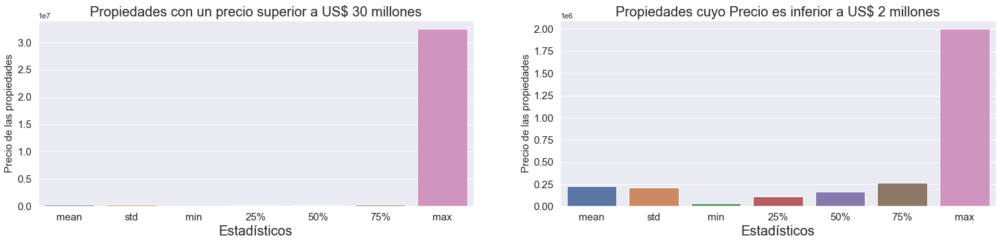

In [36]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(25,5))

sns.barplot(ax=ax1,y=Describe2.Precio, x=Describe2.index)
sns.barplot(ax=ax2,y=Describe3.Precio, x=Describe3.index)
ax1.set_title("Propiedades con un precio superior a US$ 30 millones",fontsize=20)
ax1.set_xlabel("Estadísticos",fontsize=20)
ax1.set_ylabel('Precio de las propiedades',fontsize=15)
ax1.tick_params(labelsize=15)
ax2.set_title("Propiedades cuyo Precio es inferior a US$ 2 millones",fontsize=20)
ax2.set_xlabel("Estadísticos",fontsize=20)
ax2.set_ylabel("Precio de las propiedades",fontsize=15)
ax2.tick_params(labelsize=15)
plt.show()

Como podemos ver en este gráfico, los valores máximos están muy alejados de la media, inclusive del percentil 75.

In [37]:
# Creo un nuevo DataFrame para poder comparar los parámetros estadísticos antes y después de eliminar las instancias con datos atípicos 
Describe4 = pd.merge(Describe1, Describe3, left_index=True, right_index=True)
Describe4=Describe4.rename(columns={"Precio_x": "Sin_Filtrar", "Precio_y": "Filtrado"})
Describe4.head(10)

,Sin_Filtrar,Filtrado
mean,2.412584e+05,2.292041e+05
std,3.185720e+05,2.124032e+05
min,5.500000e+03,3.300000e+04
25%,1.110000e+05,1.120000e+05
50%,1.660000e+05,1.660000e+05
75%,2.650000e+05,2.640000e+05
max,3.243423e+07,2.000000e+06


Por lo que podemos ver de la descripción estadística al eliminar los valores atípicos más extremos varía significativamente la media y la desviación estandar. 

In [38]:
df6.Precio.describe()

count    1.454260e+05
mean     2.292041e+05
std      2.124032e+05
min      3.300000e+04
25%      1.120000e+05
50%      1.660000e+05
75%      2.640000e+05
max      2.000000e+06
Name: Precio, dtype: float64

La cantidad de instancias eliminadas son: 1234 (0.84% del total de instancias) 

In [39]:
# Creo un DataFrame con los datos faltantes antes y después de filtrar los valores atípicos.
isnull_filtrado= pd.DataFrame(df6.isnull().sum())
isnull= pd.DataFrame(df2.isnull().sum())
isnull_merge = pd.merge(isnull, isnull_filtrado, left_index=True, right_index=True)
isnull_merge=isnull_merge.rename(columns={"0_x": "Sin_Filtrar", "0_y": "Filtrado"})
isnull_merge.head(10)

,Sin_Filtrar,Filtrado
Latitud,9925,9785
Longitud,9959,9818
ZonaBA_CABA,0,0
Barrio_Ciudad,0,0
Habitaciones,0,0
Dormitorios,0,0
Baños,5957,5474
Superficie_Total,20527,20139
Superficie_cubierta,21614,21098
Precio,0,0


Al filtrar los datos extremos en Precio no se me afecta los datos faltantes significativamente. 

**LATITUD**

In [40]:
df6.Latitud.describe()

count    135641.000000
mean        -34.604517
std           0.470120
min         -35.318457
25%         -34.627466
50%         -34.600930
75%         -34.574547
max          85.051129
Name: Latitud, dtype: float64

Podemos observar que hay una diferencia significativa entre el valor medio y el valor máximo, a cotinuación voy a visualizar los valores para esta variable. 

<AxesSubplot:ylabel='Latitud'>

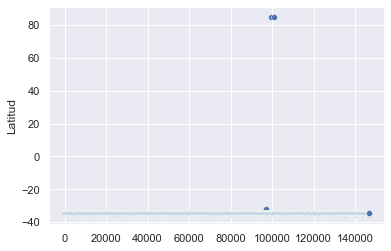

In [41]:
import pandas as pd 
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

sns.scatterplot(x=df6.index, y=df6.Latitud, data=df6)

Lo que podemos observar es que la mayoría de los valores atípicos están arriba de la latitud -20

In [42]:
# Voy a eliminar las instancias con valor de latitud superior a -20  
df7= df6[df6.Latitud > -20]
df8= df6.drop(df7.index, axis=0)

<AxesSubplot:ylabel='Latitud'>

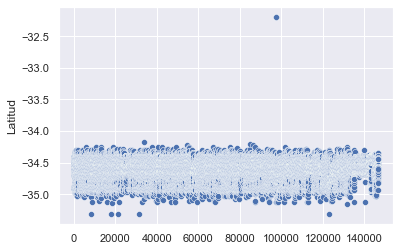

In [43]:
sns.scatterplot(x=df8.index, y=df8.Latitud, data=df8)

Queda un dato atípico muy alejado de la media, lo voy a eliminar

In [44]:
# Voy a eliminar las instancias con valor de latitud superior a -34  
df9= df8[df8.Latitud > -34]
df10= df8.drop(df9.index, axis=0)

<AxesSubplot:ylabel='Latitud'>

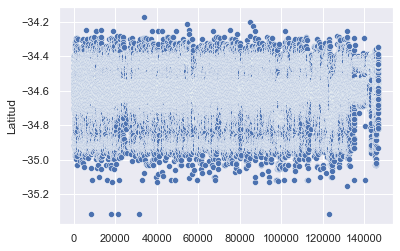

In [45]:
sns.scatterplot(x=df10.index, y=df10.Latitud, data=df10)

Obtengo una masa de datos más homogenea

Observo la distribución de los datos para esta variable antes y después de filtrar los datos:

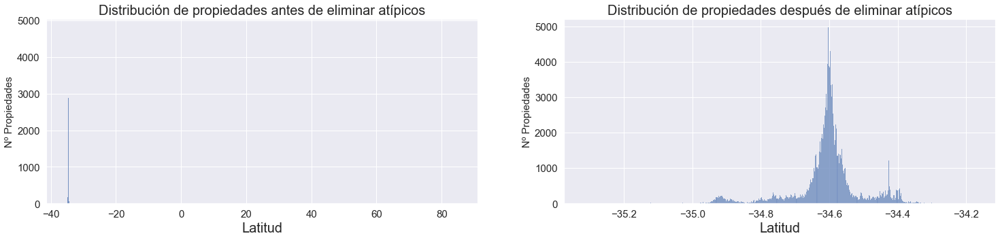

In [46]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(25,5))

sns.histplot(ax=ax1, x=df6.Latitud)
sns.histplot(ax=ax2, x=df10.Latitud)
ax1.set_title("Distribución de propiedades antes de eliminar atípicos",fontsize=20)
ax1.set_xlabel("Latitud",fontsize=20)
ax1.set_ylabel("Nº Propiedades",fontsize=15)
ax1.tick_params(labelsize=15)
ax2.set_title("Distribución de propiedades después de eliminar atípicos",fontsize=20)
ax2.set_xlabel("Latitud",fontsize=20)
ax2.set_ylabel("Nº Propiedades",fontsize=15)
ax2.tick_params(labelsize=15)
plt.show()

Como se puede observar en el gráfico, antes de los datos extremos, es imposible ver la distribución de los datos. En el gráfico de la derecha, una vez eliminados estos datos atípicos, podemos observar la districión de los datos que interesantemente se centran -34.6, la coordeanda de Latitud de la Ciudad de Buenos Aires o CABA. 

In [47]:
# Creo un nuevo DataFrame para poder graficar los parámetros estadísticos antes de eliminar las instancias con datos atípicos 
Describe1=df6.Latitud.describe() 
Describe1.reset_index()
Describe2= pd.DataFrame(Describe1)
Describe2=Describe2.drop(['count'], axis=0)

In [48]:
# Creo un nuevo DataFrame para poder graficar los parámetros estadísticos antes de eliminar las instancias con datos atípicos 
Describe3=df10.Latitud.describe() 
Describe3.reset_index()
Describe3= pd.DataFrame(Describe3)
Describe3=Describe3.drop(['count'], axis=0)

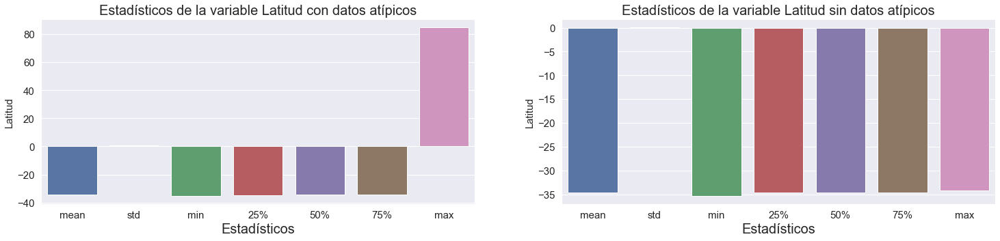

In [49]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(25,5))

sns.barplot(ax=ax1,y=Describe2.Latitud, x=Describe2.index)
sns.barplot(ax=ax2,y=Describe3.Latitud, x=Describe3.index)
ax1.set_title("Estadísticos de la variable Latitud con datos atípicos",fontsize=20)
ax1.set_xlabel("Estadísticos",fontsize=20)
ax1.set_ylabel("Latitud",fontsize=15)
ax1.tick_params(labelsize=15)
ax2.set_title("Estadísticos de la variable Latitud sin datos atípicos",fontsize=20)
ax2.set_xlabel("Estadísticos",fontsize=20)
ax2.set_ylabel("Latitud",fontsize=15)
ax2.tick_params(labelsize=15)
plt.show()

Como podemos ver en este gráfico de barras que representa los valores para la variable Latitud, estos valores presentan una variabilidad muy reducida y al eliminar los datos atípicos se puede apreciar esta baja variabilidad en los datos (gráfico de la derecha).

In [50]:
# Creo un nuevo DataFrame para poder comparar los parámetros estadísticos antes y después de eliminar las instancias con datos atípicos 
Describe4 = pd.merge(Describe1, Describe3, left_index=True, right_index=True)
Describe4=Describe4.rename(columns={"Latitud_x": "Sin_Filtrar", 'Latitud_y':"Filtrado"})
Describe4.head(10)

,Sin_Filtrar,Filtrado
mean,-34.604517,-34.606317
std,0.470120,0.099064
min,-35.318457,-35.318457
25%,-34.627466,-34.627470
50%,-34.600930,-34.600931
75%,-34.574547,-34.574547
max,85.051129,-34.171414


La descripción estadística confirma lo observado en el gráfico de más arriba. Al eliminar los valores atípicos se reduce la variabilidad en casi un orden de magnitud. 

In [51]:
df10.Latitud.describe()

count    135637.000000
mean        -34.606317
std           0.099064
min         -35.318457
25%         -34.627470
50%         -34.600931
75%         -34.574547
max         -34.171414
Name: Latitud, dtype: float64

La cantidad de instancias eliminadas son: 4 (0.0027% del total de instancias) 

In [52]:
# Creo un DataFrame con los datos faltantes antes y después de filtrar los valores atípicos.
isnull_filtrado= pd.DataFrame(df10.isnull().sum())
isnull= pd.DataFrame(df6.isnull().sum())
isnull_merge = pd.merge(isnull, isnull_filtrado, left_index=True, right_index=True)
isnull_merge=isnull_merge.rename(columns={"0_x": "Sin_Filtrar", "0_y": "Filtrado"})
isnull_merge.head(10)

,Sin_Filtrar,Filtrado
Latitud,9785,9785
Longitud,9818,9818
ZonaBA_CABA,0,0
Barrio_Ciudad,0,0
Habitaciones,0,0
Dormitorios,0,0
Baños,5474,5473
Superficie_Total,20139,20135
Superficie_cubierta,21098,21094
Precio,0,0


Al filtrar los datos extremos en Latitud no se me afecta los datos faltantes significativamente. 

**LONGITUD**

In [53]:
df10.Longitud.describe()

count    135604.000000
mean        -58.463539
std           0.140592
min         -59.104646
25%         -58.504143
50%         -58.443328
75%         -58.407992
max         -57.805832
Name: Longitud, dtype: float64

Podemos observar que no hay una diferencia significativa entre el valor medio y el valor máximo, a cotinuación voy a visualizar los valores para esta variable. 

<AxesSubplot:ylabel='Longitud'>

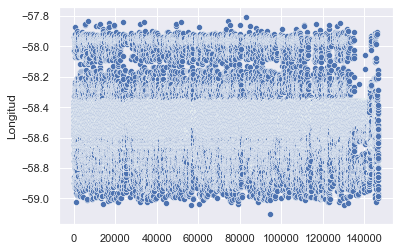

In [54]:
import pandas as pd 
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

sns.scatterplot(x=df10.index, y=df10.Longitud, data=df10)

Lo que podemos observar es que no hay datos atípicos extremos. Observemos la distribución de los datos:

Observo la distribución de los datos para esta variable antes y después de filtrar los datos:

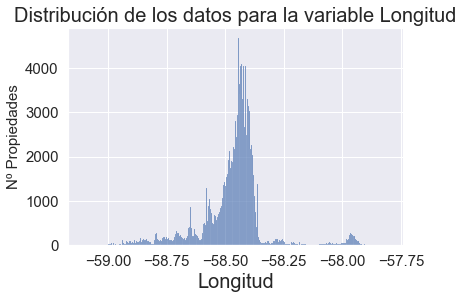

In [55]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

ax1=sns.histplot(x=df10.Longitud)
ax1.set_title('Distribución de los datos para la variable Longitud',fontsize=20)
ax1.set_xlabel("Longitud",fontsize=20)
ax1.set_ylabel("Nº Propiedades",fontsize=15)
ax1.tick_params(labelsize=15)

plt.show()

Como se puede observar en el gráfico la districión de los datos se centran entre -58.50 y -58.38. La coordeanda de Longiitud de la Ciudad de Buenos Aires o CABA es -58.38, así que lo que podemos ver es que la mayoría las propiedades se concentran en la ciudad de Buenos Aires y hacia el oeste (Izquierda).  

**SUPERFICIE TOTAL**

In [56]:
df10.Superficie_Total.describe()

count    125287.000000
mean        214.533495
std        2040.013013
min          10.000000
25%          52.000000
50%          78.000000
75%         140.000000
max      193549.000000
Name: Superficie_Total, dtype: float64

Podemos observar que hay una diferencia casi 1000 ordenes de magnitud entre el valor medio y el valor máximo, a cotinuación voy a visualizar los valores para esta variable. 

<AxesSubplot:ylabel='Superficie_Total'>

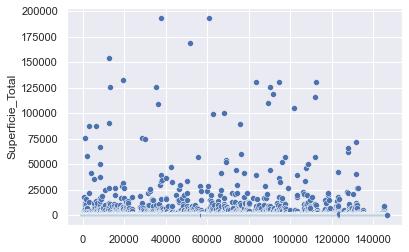

In [57]:
import pandas as pd 
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

sns.scatterplot(x=df10.index, y=df10.Superficie_Total, data=df10)

Lo que podemos observar es que la mayoría de los valores atípicos están por arriba de 25000 mtrs2. 

In [58]:
# Voy a eliminar las instancias con valor de Superficie Total superior a 25.000 mtrs2
df11= df10[df10.Superficie_Total  > 25000]
df12= df10.drop(df11.index, axis=0)

<AxesSubplot:ylabel='Superficie_Total'>

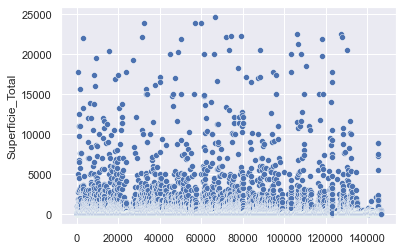

In [59]:
sns.scatterplot(x=df12.index, y=df12.Superficie_Total, data=df12)

En este gráfico podemos observar que la mayoría de los datos están por debajo de 5000 mtrs2. 

In [60]:
# Voy a eliminar las instancias con valor de Superficie Total superior a 1.000 mtrs2 y limite  inferior 15 mtrs2, para ir en concordancia con los rangos de valores del proyecto 1.  
dfinf= df12[df12.Superficie_Total < 14]
dfinf_1= df12.drop(dfinf.index, axis=0)
df13= dfinf_1[dfinf_1.Superficie_Total > 1000]
df14= dfinf_1.drop(df13.index, axis=0)

<AxesSubplot:ylabel='Superficie_Total'>

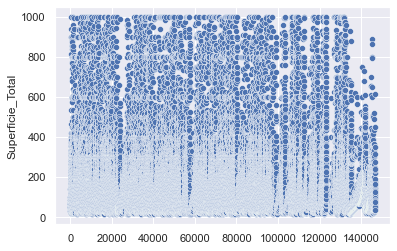

In [61]:
sns.scatterplot(x=df14.index, y=df14.Superficie_Total, data=df14)

Obtengo una masa de datos más homogenea.

Observo la distribución de los datos para esta variable antes y después de filtrar los datos:

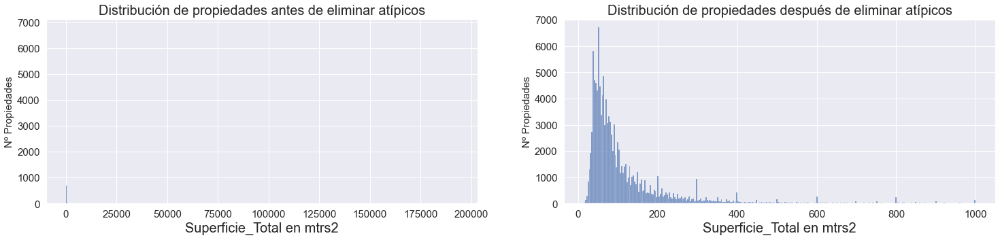

In [62]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(25,5))

sns.histplot(ax=ax1, x=df10.Superficie_Total)
sns.histplot(ax=ax2, x=df14.Superficie_Total)
ax1.set_title("Distribución de propiedades antes de eliminar atípicos",fontsize=20)
ax1.set_xlabel("Superficie_Total en mtrs2",fontsize=20)
ax1.set_ylabel("Nº Propiedades",fontsize=15)
ax1.tick_params(labelsize=15)
ax2.set_title("Distribución de propiedades después de eliminar atípicos",fontsize=20)
ax2.set_xlabel("Superficie_Total en mtrs2",fontsize=20)
ax2.set_ylabel("Nº Propiedades",fontsize=15)
ax2.tick_params(labelsize=15)
plt.show()

Como se puede observar en el gráfico, antes de los datos extremos, es imposible ver la distribución de los datos. En el gráfico de la derecha, una vez eliminados estos datos atípicos, podemos observar que la mayoría de las propiedades están por debajo de los 1000 mtrs2. 

In [63]:
# Creo un nuevo DataFrame para poder graficar los parámetros estadísticos antes de eliminar las instancias con datos atípicos 
Describe1=df10.Superficie_Total.describe() 
Describe1.reset_index()
Describe2= pd.DataFrame(Describe1)
Describe2=Describe2.drop(['count'], axis=0)

In [64]:
# Creo un nuevo DataFrame para poder graficar los parámetros estadísticos después de eliminar las instancias con datos atípicos 
Describe3=df14.Superficie_Total.describe() 
Describe3.reset_index()
Describe3= pd.DataFrame(Describe3)
Describe3=Describe3.drop(['count'], axis=0)

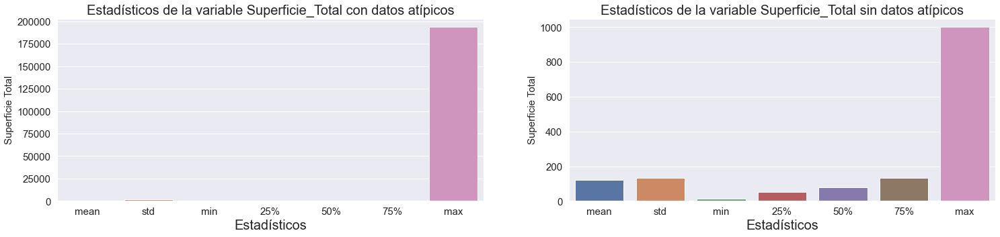

In [65]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(25,5))

sns.barplot(ax=ax1,y=Describe2.Superficie_Total, x=Describe2.index)
sns.barplot(ax=ax2,y=Describe3.Superficie_Total, x=Describe3.index)
ax1.set_title("Estadísticos de la variable Superficie_Total con datos atípicos",fontsize=20)
ax1.set_xlabel("Estadísticos",fontsize=20)
ax1.set_ylabel("Superficie Total",fontsize=15)
ax1.tick_params(labelsize=15)
ax2.set_title("Estadísticos de la variable Superficie_Total sin datos atípicos",fontsize=20)
ax2.set_xlabel("Estadísticos",fontsize=20)
ax2.set_ylabel("Superficie Total",fontsize=15)
ax2.tick_params(labelsize=15)
plt.show()

Como podemos ver en este gráfico de barras, que representa los valores estadísticos, al eliminar valores atípicos extremos podemos ver como es la distribución de las propiedades en base a esta variable. Auque eliminamos muchos valores atípicos se sigue observando una gran diferencias de varios ordenes de magnitud entre la media y los valores máximos. Esto se refleja en la desviación estandar superiora la media(gráfico de la derecha).

In [66]:
# Creo un nuevo DataFrame para poder comparar los parámetros estadísticos antes y después de eliminar las instancias con datos atípicos 
Describe4 = pd.merge(Describe1, Describe3, left_index=True, right_index=True)
Describe4=Describe4.rename(columns={"Superficie_Total_x": "Sin_Filtrar", 'Superficie_Total_y':"Filtrado"})
Describe4.head(10)

,Sin_Filtrar,Filtrado
mean,214.533495,122.279913
std,2040.013013,133.044823
min,10.000000,14.000000
25%,52.000000,52.000000
50%,78.000000,77.000000
75%,140.000000,133.000000
max,193549.000000,1000.000000


La descripción estadística confirma lo observado en el gráfico de más arriba. Al eliminar los valores atípicos se reduce la variabilidad en casi 20 veces, también se mofica la media, la cual se acerca más al percentil 75.

In [67]:
df14.Superficie_Total.describe()

count    123106.000000
mean        122.279913
std         133.044823
min          14.000000
25%          52.000000
50%          77.000000
75%         133.000000
max        1000.000000
Name: Superficie_Total, dtype: float64

La cantidad de instancias eliminadas son: 2181 (1.74% del total de instancias) 

In [68]:
# Creo un DataFrame con los datos faltantes antes y después de filtrar los valores atípicos.
isnull_filtrado= pd.DataFrame(df14.isnull().sum())
isnull= pd.DataFrame(df10.isnull().sum())
isnull_merge = pd.merge(isnull, isnull_filtrado, left_index=True, right_index=True)
isnull_merge=isnull_merge.rename(columns={"0_x": "Sin_Filtrar", "0_y": "Filtrado"})
isnull_merge.head(10)

,Sin_Filtrar,Filtrado
Latitud,9785,9636
Longitud,9818,9669
ZonaBA_CABA,0,0
Barrio_Ciudad,0,0
Habitaciones,0,0
Dormitorios,0,0
Baños,5473,5401
Superficie_Total,20135,20135
Superficie_cubierta,21094,20891
Precio,0,0


Al eliminar los datos extremos no se me afecta los datos faltantes significativamente. 

**SUPERFICIE CUBIERTA**

In [69]:
df14.Superficie_cubierta.describe()

count    122350.000000
mean         95.162754
std         452.153574
min           1.000000
25%          46.000000
50%          67.000000
75%         104.000000
max       90183.000000
Name: Superficie_cubierta, dtype: float64

Al ver los datos estadísticos de esta variable podemos detectar una incoherencia en los datos respecto al trabajo que venimos haciendo. Para esta variable figura un valor máximo de 90183 mtrs2, cuando para Superficie Total habíamos establecido un valor máximo de 1000 mtrs2. La desviación estandar es muy grande lo cual indica que es muy posible que encontremos valores atípicos extremos o muy alejados de la media.   

<AxesSubplot:ylabel='Superficie_cubierta'>

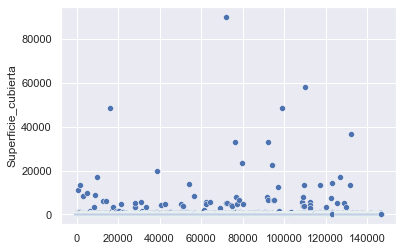

In [70]:
import pandas as pd 
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

sns.scatterplot(x=df14.index, y=df14.Superficie_cubierta, data=df14)

Al igual que para Superficie Total, lo que podemos observar es que la mayoría de los valores atípicos están por arriba de 20000 mtrs2. Sin embargo, voy aplicar un filtro para propiedades mayores a 1000 mtrs2 y menores a 14 mtrs2 como hice con Superfice Total.

In [71]:
# Primero voy a filtrar hasta 5000 mtrs2 para ver la distribución de los datos
dfinf= df14[df14.Superficie_cubierta < 14]
dfinf_1= df14.drop(dfinf.index, axis=0)
df15= dfinf_1[dfinf_1.Superficie_cubierta > 5000]
df16= dfinf_1.drop(df15.index, axis=0)

<AxesSubplot:ylabel='Superficie_cubierta'>

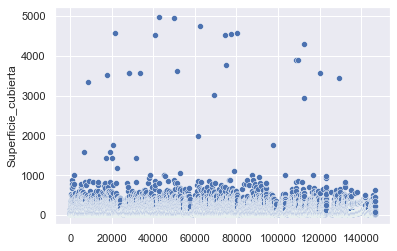

In [72]:
sns.scatterplot(x=df16.index, y=df16.Superficie_cubierta, data=df16)

En este gráfico podemos observar que la mayoría de los datos están por debajo de 1000 mtrs2. 

In [73]:
df17= df16[df16.Superficie_cubierta > 1000]
df18= df16.drop(df17.index, axis=0)

<AxesSubplot:ylabel='Superficie_cubierta'>

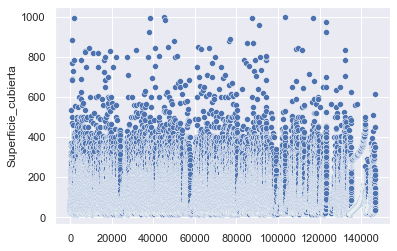

In [74]:
sns.scatterplot(x=df18.index, y=df18.Superficie_cubierta, data=df18)

Obtengo una masa de datos más homogenea.

Observo la distribución de los datos para esta variable antes y después de filtrar los datos:

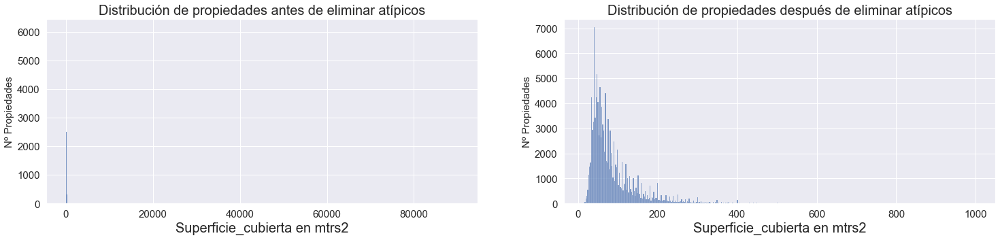

In [75]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(25,5))

sns.histplot(ax=ax1, x=df14.Superficie_cubierta)
sns.histplot(ax=ax2, x=df18.Superficie_cubierta)
ax1.set_title("Distribución de propiedades antes de eliminar atípicos",fontsize=20)
ax1.set_xlabel("Superficie_cubierta en mtrs2",fontsize=20)
ax1.set_ylabel("Nº Propiedades",fontsize=15)
ax1.tick_params(labelsize=15)
ax2.set_title("Distribución de propiedades después de eliminar atípicos",fontsize=20)
ax2.set_xlabel("Superficie_cubierta en mtrs2",fontsize=20)
ax2.set_ylabel("Nº Propiedades",fontsize=15)
ax2.tick_params(labelsize=15)
plt.show()

Como se puede observar en el gráfico, antes de los datos extremos, es imposible ver la distribución de los datos. En el gráfico de la derecha, una vez eliminados estos datos atípicos, podemos observar que la mayoría de las propiedades están por debajo de los 400 mtrs2. 

In [76]:
df17= df16[df16.Superficie_cubierta > 450]
df18= df16.drop(df17.index, axis=0)

<AxesSubplot:ylabel='Superficie_cubierta'>

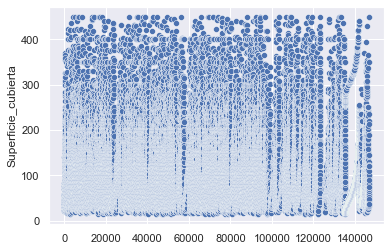

In [77]:
sns.scatterplot(x=df18.index, y=df18.Superficie_cubierta, data=df18)

In [78]:
# Creo un nuevo DataFrame para poder graficar los parámetros estadísticos antes de eliminar las instancias con datos atípicos 
Describe1=df14.Superficie_cubierta.describe() 
Describe1.reset_index()
Describe2= pd.DataFrame(Describe1)
Describe2=Describe2.drop(['count'], axis=0)

In [79]:
# Creo un nuevo DataFrame para poder graficar los parámetros estadísticos después de eliminar las instancias con datos atípicos 
Describe3=df18.Superficie_cubierta.describe() 
Describe3.reset_index()
Describe3= pd.DataFrame(Describe3)
Describe3=Describe3.drop(['count'], axis=0)

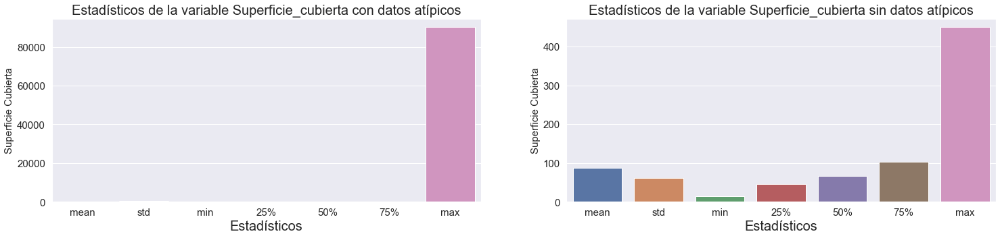

In [80]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(25,5))

sns.barplot(ax=ax1,y=Describe2.Superficie_cubierta, x=Describe2.index)
sns.barplot(ax=ax2,y=Describe3.Superficie_cubierta, x=Describe3.index)
ax1.set_title("Estadísticos de la variable Superficie_cubierta con datos atípicos",fontsize=20)
ax1.set_xlabel("Estadísticos",fontsize=20)
ax1.set_ylabel("Superficie Cubierta",fontsize=15)
ax1.tick_params(labelsize=15)
ax2.set_title("Estadísticos de la variable Superficie_cubierta sin datos atípicos",fontsize=20)
ax2.set_xlabel("Estadísticos",fontsize=20)
ax2.set_ylabel("Superficie Cubierta",fontsize=15)
ax2.tick_params(labelsize=15)
plt.show()

Como podemos ver en este gráfico de barras, que representa los valores estadísticos, al eliminar valores atípicos podemos ver como es la distribución de las propiedades sobre cada parametro estadístico. Auque eliminamos muchos valores atípicos se sigue observando una gran diferencias la media y los valores máximos. 

In [81]:
# Creo un nuevo DataFrame para poder comparar los parámetros estadísticos antes y después de eliminar las instancias con datos atípicos 
Describe4 = pd.merge(Describe1, Describe3, left_index=True, right_index=True)
Describe4=Describe4.rename(columns={"Superficie_cubierta_x": "Sin_Filtrar", 'Superficie_cubierta_y':"Filtrado"})
Describe4.head(10)

,Sin_Filtrar,Filtrado
mean,95.162754,86.984542
std,452.153574,61.941515
min,1.000000,14.000000
25%,46.000000,46.000000
50%,67.000000,67.000000
75%,104.000000,103.000000
max,90183.000000,450.000000


La descripción estadística confirma lo observado en el gráfico de más arriba. Al eliminar los valores atípicos se reduce la variabilidad en casi un orden de magnitud, también baja el valor de la media.

In [82]:
df18.Superficie_cubierta.describe()

count    121752.000000
mean         86.984542
std          61.941515
min          14.000000
25%          46.000000
50%          67.000000
75%         103.000000
max         450.000000
Name: Superficie_cubierta, dtype: float64

La cantidad de instancias eliminadas son: 598 (0.49% del total de instancias) 

In [83]:
# Creo un DataFrame con los datos faltantes antes y después de filtrar los valores atípicos.
isnull_filtrado= pd.DataFrame(df18.isnull().sum())
isnull= pd.DataFrame(df14.isnull().sum())
isnull_merge = pd.merge(isnull, isnull_filtrado, left_index=True, right_index=True)
isnull_merge=isnull_merge.rename(columns={"0_x": "Sin_Filtrar", "0_y": "Filtrado"})
isnull_merge.head(10)

,Sin_Filtrar,Filtrado
Latitud,9636,9608
Longitud,9669,9641
ZonaBA_CABA,0,0
Barrio_Ciudad,0,0
Habitaciones,0,0
Dormitorios,0,0
Baños,5401,5375
Superficie_Total,20135,20061
Superficie_cubierta,20891,20891
Precio,0,0


Al eliminar los datos extremos no se me afecta los datos faltantes significativamente. 

**BAÑOS**

In [84]:
df18.Baños.describe()

count    137268.000000
mean          1.570388
std           0.839659
min           1.000000
25%           1.000000
50%           1.000000
75%           2.000000
max          14.000000
Name: Baños, dtype: float64

Al ver los datos estadísticos de esta variable podemos detectar que el valor máximo se aleja mucho de la media.   

<AxesSubplot:ylabel='Baños'>

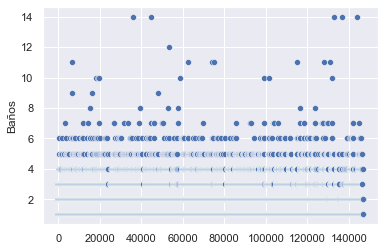

In [85]:
import pandas as pd 
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

sns.scatterplot(x=df18.index, y=df18.Baños, data=df18)

Podemos ver datos atípicos dispersos en el scatterplot. La mayoría de los datos está por debajo de 7 baños, sin embargo, voy a tomar un valor máximo de 4 para ir en concordancia con el valor selecionado en el proyecto 1.

In [86]:
df19= df18[df18.Baños > 4]
df20= df18.drop(df19.index, axis=0)

<AxesSubplot:ylabel='Baños'>

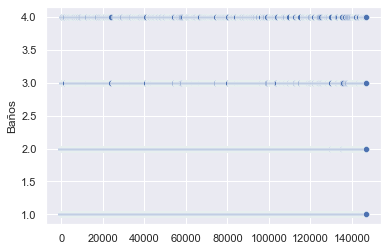

In [87]:
sns.scatterplot(x=df20.index, y=df20.Baños, data=df20)

Observo la distribución de los datos para esta variable antes y después de filtrar los datos:

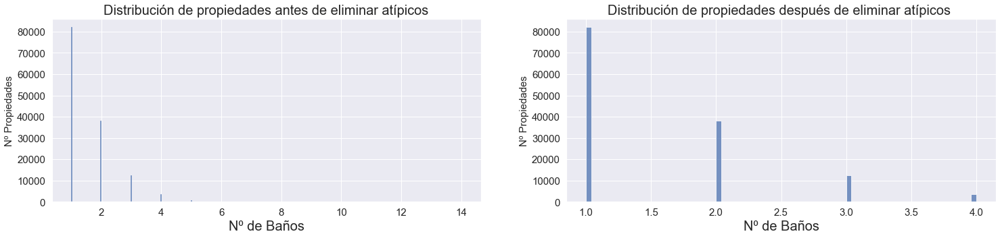

In [88]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(25,5))

sns.histplot(ax=ax1, x=df18.Baños)
sns.histplot(ax=ax2, x=df20.Baños)
ax1.set_title("Distribución de propiedades antes de eliminar atípicos",fontsize=20)
ax1.set_xlabel("Nº de Baños",fontsize=20)
ax1.set_ylabel("Nº Propiedades",fontsize=15)
ax1.tick_params(labelsize=15)
ax2.set_title("Distribución de propiedades después de eliminar atípicos ",fontsize=20)
ax2.set_xlabel("Nº de Baños",fontsize=20)
ax2.set_ylabel("Nº Propiedades",fontsize=15)
ax2.tick_params(labelsize=15)
plt.show()

Como se puede observar en el gráfico la mayoría de las propiedades tiene hasta 4 baños. Además, vamos que para esta variable aparecen valores con decimales lo cual no es correcto (deberían ser todos enteros). Por este motivo voy aplicar la función round(). 

In [89]:
# Creo un nuevo DataFrame para poder graficar los parámetros estadísticos antes de eliminar las instancias con datos atípicos 
Describe1=df18.Baños.describe() 
Describe1.reset_index()
Describe2= pd.DataFrame(Describe1)
Describe2=Describe2.drop(['count'], axis=0)

In [90]:
# Creo un nuevo DataFrame para poder graficar los parámetros estadísticos después de eliminar las instancias con datos atípicos 
Describe3=df20.Baños.describe() 
Describe3.reset_index()
Describe3= pd.DataFrame(Describe3)
Describe3=Describe3.drop(['count'], axis=0)

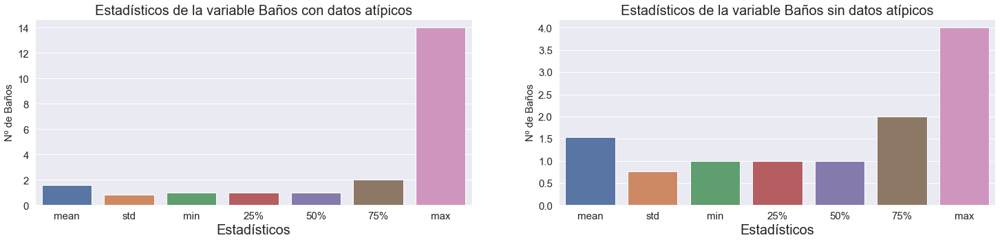

In [91]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(25,5))

sns.barplot(ax=ax1,y=Describe2.Baños, x=Describe2.index)
sns.barplot(ax=ax2,y=Describe3.Baños, x=Describe3.index)
ax1.set_title("Estadísticos de la variable Baños con datos atípicos",fontsize=20)
ax1.set_xlabel("Estadísticos",fontsize=20)
ax1.set_ylabel("Nº de Baños",fontsize=15)
ax1.tick_params(labelsize=15)
ax2.set_title("Estadísticos de la variable Baños sin datos atípicos",fontsize=20)
ax2.set_xlabel("Estadísticos",fontsize=20)
ax2.set_ylabel("Nº de Baños",fontsize=15)
ax2.tick_params(labelsize=15)
plt.show()

A diferencia de otras variables analizadas la diferencia entre la media y los valores máximos para la variable Baños no es tan grande. Sin embargo, al eliminar los datos atípicos la mayoría de los valores se acercan al percentil 75. 

In [92]:
# Creo un nuevo DataFrame para poder comparar los parámetros estadísticos antes y después de eliminar las instancias con datos atípicos 
Describe4 = pd.merge(Describe1, Describe3, left_index=True, right_index=True)
Describe4=Describe4.rename(columns={"Baños_x": "Sin_Filtrar", 'Baños_y':"Filtrado"})
Describe4.head(10)

,Sin_Filtrar,Filtrado
mean,1.570388,1.539323
std,0.839659,0.763593
min,1.000000,1.000000
25%,1.000000,1.000000
50%,1.000000,1.000000
75%,2.000000,2.000000
max,14.000000,4.000000


La descripción estadística confirma lo observado en el gráfico de más arriba. Al eliminar los valores atípicos se reduce la variabilidad, sin embargo, la media no se ve afectada significativamente.

In [93]:
df20.Baños.describe()

count    136156.000000
mean          1.539323
std           0.763593
min           1.000000
25%           1.000000
50%           1.000000
75%           2.000000
max           4.000000
Name: Baños, dtype: float64

La cantidad de instancias eliminadas son: 1112 (0.81% del total de instancias) 

In [94]:
# Creo un DataFrame con los datos faltantes antes y después de filtrar los valores atípicos.
isnull_filtrado= pd.DataFrame(df20.isnull().sum())
isnull= pd.DataFrame(df18.isnull().sum())
isnull_merge = pd.merge(isnull, isnull_filtrado, left_index=True, right_index=True)
isnull_merge=isnull_merge.rename(columns={"0_x": "Sin_Filtrar", "0_y": "Filtrado"})
isnull_merge.head(10)

,Sin_Filtrar,Filtrado
Latitud,9608,9445
Longitud,9641,9478
ZonaBA_CABA,0,0
Barrio_Ciudad,0,0
Habitaciones,0,0
Dormitorios,0,0
Baños,5375,5375
Superficie_Total,20061,19821
Superficie_cubierta,20891,20641
Precio,0,0


Luego de eliminar las instancias con datos atípicos, no se reducen los datos faltantes en la variable Baños. 

**HABITACIONES**

In [95]:
df20.Habitaciones.describe()

count    141531.000000
mean          3.018632
std           1.314991
min           1.000000
25%           2.000000
50%           3.000000
75%           4.000000
max          35.000000
Name: Habitaciones, dtype: float64

Al ver los datos estadísticos de esta variable podemos detectar que el valor máximo se aleja mucho de la media y del percentil 75.   

<AxesSubplot:ylabel='Habitaciones'>

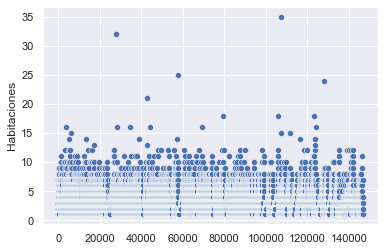

In [96]:
import pandas as pd 
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

sns.scatterplot(x=df20.index, y=df20.Habitaciones, data=df20)

Podemos ver datos atípicos dispersos en el scatterplot. La mayoría de los datos está por debajo de 15 habitaciones.

In [97]:
df21= df20[df20.Habitaciones > 15]
df22= df20.drop(df21.index, axis=0)

<AxesSubplot:ylabel='Habitaciones'>

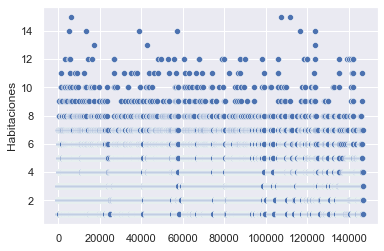

In [98]:
sns.scatterplot(x=df22.index, y=df22.Habitaciones, data=df22)

Podemos ver que todavía hay datos atípicos dispersos en el scatterplot. La mayoría de los datos está por debajo de 12 habitaciones, sin embargo, voy a establecar un valor máximo de 7 al igual que el proyecto 7 (de acuerdo a los boxplots).

In [99]:
df23= df22[df22.Habitaciones > 7]
df24= df22.drop(df23.index, axis=0)

<AxesSubplot:ylabel='Habitaciones'>

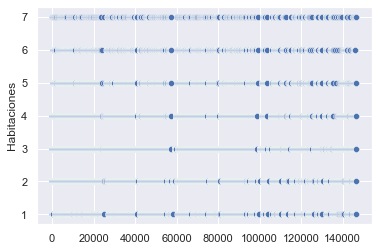

In [100]:
sns.scatterplot(x=df24.index, y=df24.Habitaciones, data=df24)

Obtengo una masa de datos más homogenea. 

Observo la distribución de los datos para esta variable antes y después de filtrar los datos:

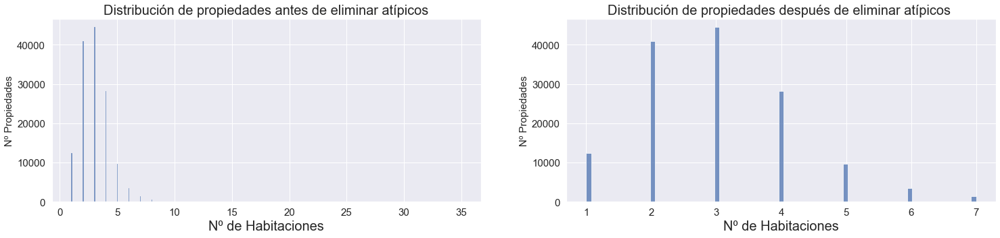

In [101]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(25,5))

sns.histplot(ax=ax1, x=df20.Habitaciones)
sns.histplot(ax=ax2, x=df24.Habitaciones)
ax1.set_title("Distribución de propiedades antes de eliminar atípicos",fontsize=20)
ax1.set_xlabel("Nº de Habitaciones",fontsize=20)
ax1.set_ylabel("Nº Propiedades",fontsize=15)
ax1.tick_params(labelsize=15)
ax2.set_title("Distribución de propiedades después de eliminar atípicos ",fontsize=20)
ax2.set_xlabel("Nº de Habitaciones",fontsize=20)
ax2.set_ylabel("Nº Propiedades",fontsize=15)
ax2.tick_params(labelsize=15)
plt.show()

Como se puede observar en el gráfico la mayoría de las propiedades tiene entre 2 y 4 habitaciones.  

In [102]:
# Creo un nuevo DataFrame para poder graficar los parámetros estadísticos antes de eliminar las instancias con datos atípicos 
Describe1=df20.Habitaciones.describe() 
Describe1.reset_index()
Describe2= pd.DataFrame(Describe1)
Describe2=Describe2.drop(['count'], axis=0)

In [103]:
# Creo un nuevo DataFrame para poder graficar los parámetros estadísticos después de eliminar las instancias con datos atípicos 
Describe3=df24.Habitaciones.describe() 
Describe3.reset_index()
Describe3= pd.DataFrame(Describe3)
Describe3=Describe3.drop(['count'], axis=0)

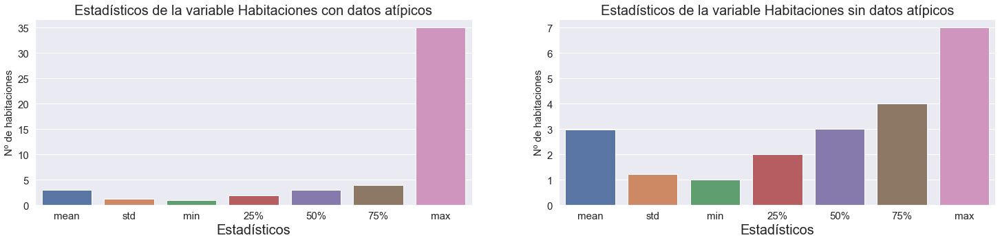

In [104]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(25,5))

sns.barplot(ax=ax1,y=Describe2.Habitaciones, x=Describe2.index)
sns.barplot(ax=ax2,y=Describe3.Habitaciones, x=Describe3.index)
ax1.set_title("Estadísticos de la variable Habitaciones con datos atípicos",fontsize=20)
ax1.set_xlabel("Estadísticos",fontsize=20)
ax1.set_ylabel("Nº de habitaciones",fontsize=15)
ax1.tick_params(labelsize=15)
ax2.set_title("Estadísticos de la variable Habitaciones sin datos atípicos",fontsize=20)
ax2.set_xlabel("Estadísticos",fontsize=20)
ax2.set_ylabel("Nº de habitaciones",fontsize=15)
ax2.tick_params(labelsize=15)
plt.show()

En este gráfico se puede observar que la variabilidad se reduce al eliminar los datos atípicos extremos.  

In [105]:
# Creo un nuevo DataFrame para poder comparar los parámetros estadísticos antes y después de eliminar las instancias con datos atípicos 
Describe4 = pd.merge(Describe1, Describe3, left_index=True, right_index=True)
Describe4=Describe4.rename(columns={"Habitaciones_x": "Sin_Filtrar", 'Habitaciones_y':"Filtrado"})
Describe4.head(10)

,Sin_Filtrar,Filtrado
mean,3.018632,2.983647
std,1.314991,1.225991
min,1.000000,1.000000
25%,2.000000,2.000000
50%,3.000000,3.000000
75%,4.000000,4.000000
max,35.000000,7.000000


La descripción estadística confirma lo observado en el gráfico de más arriba. Sin embargo, la media y las desviación estandar no se reducen significativamente.

In [106]:
df24.Habitaciones.describe()

count    140706.000000
mean          2.983647
std           1.225991
min           1.000000
25%           2.000000
50%           3.000000
75%           4.000000
max           7.000000
Name: Habitaciones, dtype: float64

La cantidad de instancias eliminadas son: 825 (0.58% del total de instancias) 

In [107]:
# Creo un DataFrame con los datos faltantes antes y después de filtrar los valores atípicos.
isnull_filtrado= pd.DataFrame(df24.isnull().sum())
isnull= pd.DataFrame(df20.isnull().sum())
isnull_merge = pd.merge(isnull, isnull_filtrado, left_index=True, right_index=True)
isnull_merge=isnull_merge.rename(columns={"0_x": "Sin_Filtrar", "0_y": "Filtrado"})
isnull_merge.head(10)

,Sin_Filtrar,Filtrado
Latitud,9445,9404
Longitud,9478,9437
ZonaBA_CABA,0,0
Barrio_Ciudad,0,0
Habitaciones,0,0
Dormitorios,0,0
Baños,5375,5341
Superficie_Total,19821,19740
Superficie_cubierta,20641,20544
Precio,0,0


**DORMITORIOS**

In [108]:
df24.Dormitorios.describe()

count    140706.000000
mean          1.920863
std           1.052294
min           0.000000
25%           1.000000
50%           2.000000
75%           3.000000
max          15.000000
Name: Dormitorios, dtype: float64

Al ver los datos estadísticos de esta variable podemos detectar que el valor máximo se aleja mucho de la media y del percentil 75.   

<AxesSubplot:ylabel='Dormitorios'>

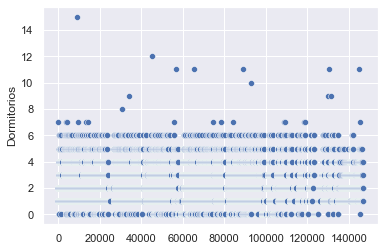

In [109]:
import pandas as pd 
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

sns.scatterplot(x=df24.index, y=df24.Dormitorios, data=df24)

Podemos ver datos atípicos dispersos en el scatterplot. La mayoría de los datos está por debajo de 6 dormitorios.

In [110]:
df25= df24[df24.Dormitorios > 6]
df26= df24.drop(df25.index, axis=0)

<AxesSubplot:ylabel='Dormitorios'>

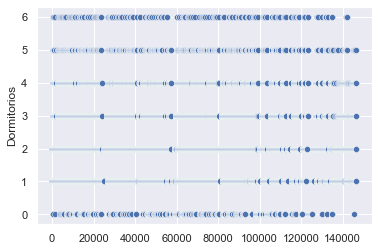

In [111]:
sns.scatterplot(x=df26.index, y=df26.Dormitorios, data=df26)

Podemos ver que ahora tenemos una masa de datos más homogenea.

Observo la distribución de los datos para esta variable antes y después de filtrar los datos:

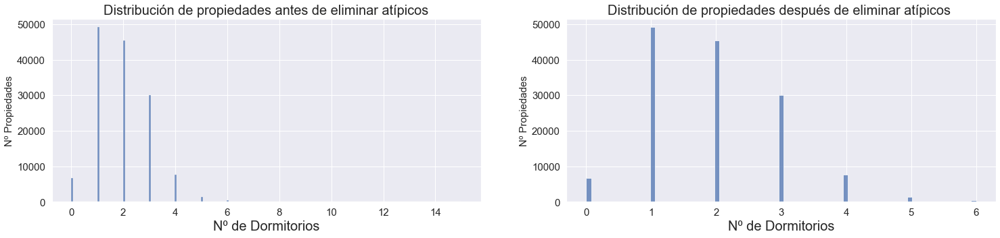

In [112]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(25,5))

sns.histplot(ax=ax1, x=df24.Dormitorios)
sns.histplot(ax=ax2, x=df26.Dormitorios)
ax1.set_title("Distribución de propiedades antes de eliminar atípicos",fontsize=20)
ax1.set_xlabel("Nº de Dormitorios",fontsize=20)
ax1.set_ylabel("Nº Propiedades",fontsize=15)
ax1.tick_params(labelsize=15)
ax2.set_title("Distribución de propiedades después de eliminar atípicos ",fontsize=20)
ax2.set_xlabel("Nº de Dormitorios",fontsize=20)
ax2.set_ylabel("Nº Propiedades",fontsize=15)
ax2.tick_params(labelsize=15)
plt.show()

Como se puede observar en el gráfico la mayoría de las propiedades tiene entre 1 y 3 dormitorios.  

In [113]:
# Creo un nuevo DataFrame para poder graficar los parámetros estadísticos antes de eliminar las instancias con datos atípicos 
Describe1=df24.Dormitorios.describe() 
Describe1.reset_index()
Describe2= pd.DataFrame(Describe1)
Describe2=Describe2.drop(['count'], axis=0)

In [114]:
# Creo un nuevo DataFrame para poder graficar los parámetros estadísticos después de eliminar las instancias con datos atípicos  
Describe3=df26.Dormitorios.describe() 
Describe3.reset_index()
Describe3= pd.DataFrame(Describe3)
Describe3=Describe3.drop(['count'], axis=0)

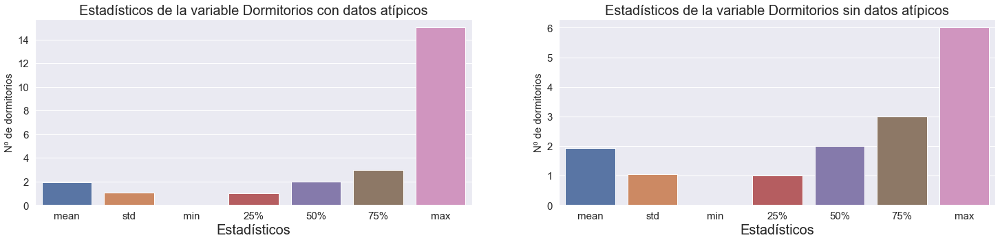

In [115]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
sns.set()

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(25,5))

sns.barplot(ax=ax1,y=Describe2.Dormitorios, x=Describe2.index)
sns.barplot(ax=ax2,y=Describe3.Dormitorios, x=Describe3.index)
ax1.set_title("Estadísticos de la variable Dormitorios con datos atípicos",fontsize=20)
ax1.set_xlabel("Estadísticos",fontsize=20)
ax1.set_ylabel("Nº de dormitorios",fontsize=15)
ax1.tick_params(labelsize=15)
ax2.set_title("Estadísticos de la variable Dormitorios sin datos atípicos",fontsize=20)
ax2.set_xlabel("Estadísticos",fontsize=20)
ax2.set_ylabel("Nº de dormitorios",fontsize=15)
ax2.tick_params(labelsize=15)
plt.show()

En este gráfico se puede observar que no hay un cambio significativo en los parámetros estadísticos al elimiar las instancias con valores atípicos para esta variable.  

In [116]:
# Creo un nuevo DataFrame para poder comparar los parámetros estadísticos antes y después de eliminar las instancias con datos atípicos  
Describe4 = pd.merge(Describe1, Describe3, left_index=True, right_index=True)
Describe4=Describe4.rename(columns={"Dormitorios_x": "Sin_Filtrar", 'Dormitorios_y':"Filtrado"})
Describe4.head(10) 

,Sin_Filtrar,Filtrado
mean,1.920863,1.919583
std,1.052294,1.047912
min,0.000000,0.000000
25%,1.000000,1.000000
50%,2.000000,2.000000
75%,3.000000,3.000000
max,15.000000,6.000000


La descripción estadística confirma lo observado en el gráfico de más arriba.

In [117]:
df26.Dormitorios.describe()

count    140679.000000
mean          1.919583
std           1.047912
min           0.000000
25%           1.000000
50%           2.000000
75%           3.000000
max           6.000000
Name: Dormitorios, dtype: float64

La cantidad de instancias eliminadas son: 27 (0.019% del total de instancias) 

In [118]:
# Creo un DataFrame con los datos faltantes antes y después de filtrar los valores atípicos.
isnull_filtrado= pd.DataFrame(df26.isnull().sum())
isnull= pd.DataFrame(df24.isnull().sum())
isnull_merge = pd.merge(isnull, isnull_filtrado, left_index=True, right_index=True)
isnull_merge=isnull_merge.rename(columns={"0_x": "Sin_Filtrar", "0_y": "Filtrado"})
isnull_merge.head(10)

,Sin_Filtrar,Filtrado
Latitud,9404,9403
Longitud,9437,9436
ZonaBA_CABA,0,0
Barrio_Ciudad,0,0
Habitaciones,0,0
Dormitorios,0,0
Baños,5341,5340
Superficie_Total,19740,19740
Superficie_cubierta,20544,20542
Precio,0,0


Luego de eliminar las instancias con datos atípicos, no se reducen significativamente los datos faltantes.  

**Ahora voy a contar cuantos datos faltantes se perdieron con la eliminación de instancias con valores atípicos para cada variable** 

In [119]:
# Creo un DataFrame con los porcentajes de datos faltantes antes y después de filtrar los valores atípicos. 
isnull_filtrado= pd.DataFrame(df26.isna().sum()/df2.shape[0]*100)
isnull= pd.DataFrame(df2.isna().sum()/df2.shape[0]*100)
isnull_merge = pd.merge(isnull, isnull_filtrado, left_index=True, right_index=True)
isnull_merge=isnull_merge.rename(columns={"0_x": "Sin_Filtrar", "0_y": "Filtrado"})
isnull_merge.head(10)

,Sin_Filtrar,Filtrado
Latitud,6.767353,6.411428
Longitud,6.790536,6.433929
ZonaBA_CABA,0.000000,0.000000
Barrio_Ciudad,0.000000,0.000000
Habitaciones,0.000000,0.000000
Dormitorios,0.000000,0.000000
Baños,4.061776,3.641075
Superficie_Total,13.996318,13.459703
Superficie_cubierta,14.737488,14.006546
Precio,0.000000,0.000000


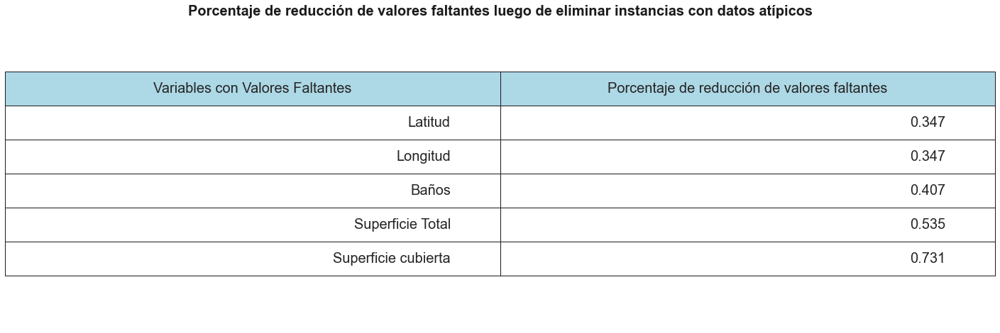

In [120]:
import pandas as pd
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(25,8))

data=[['Latitud', 0.347], ['Longitud', 0.347], ['Baños', 0.407]
     ,['Superficie Total', 0.535], ['Superficie cubierta', 0.731]
     ]
column_labels=['Variables con Valores Faltantes', 'Porcentaje de reducción de valores faltantes']
df=pd.DataFrame(data,columns=column_labels)
ax.axis('tight')
ax.axis('off')
table = ax.table(cellText=df.values,
        colLabels=df.columns,       
        colColours =["lightblue"] * 3,
        loc="center")

table.scale(1, 4)
table.set_fontsize(20)
ax.axis('off')
title = "Porcentaje de reducción de valores faltantes luego de eliminar instancias con datos atípicos"
ax.set_title(f'{title}', weight='bold', size=20, color='k')

plt.savefig("demo_table.png", dpi=200, bbox_inches='tight')
plt.show()

Como podemos ver en el cuadro comparativo, la reducción de datos faltantes, luego de eliminar las instancias con valores atípicos de todas las variables numéricas, no es significativo. 

In [121]:
df26.describe()

,Latitud,Longitud,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio
count,131276.000000,131243.000000,140679.000000,140679.000000,135339.000000,120939.000000,120137.000000,1.406790e+05
mean,-34.606084,-58.461005,2.983238,1.919583,1.532123,117.549566,84.742619,2.191308e+05
std,0.096112,0.135910,1.225341,1.047912,0.756638,125.623373,58.271383,1.919122e+05
min,-35.150806,-59.042416,1.000000,0.000000,1.000000,14.000000,14.000000,3.300000e+04
25%,-34.626924,-58.501518,2.000000,1.000000,1.000000,51.000000,46.000000,1.100000e+05
50%,-34.600953,-58.443019,3.000000,2.000000,1.000000,76.000000,66.000000,1.650000e+05
75%,-34.575393,-58.408174,4.000000,3.000000,2.000000,130.000000,100.000000,2.576200e+05
max,-34.202767,-57.805832,7.000000,6.000000,4.000000,1000.000000,450.000000,2.000000e+06


Si tenemos en cuenta el número de instancias para las variables que no tienen datos faltantes como Habitaciones	y Dormitorios el dataset se redujo en 5750 instancias, o en un 3,9%, menos del 5%, que es el valor por encima del cual no se recomienda reducir un dataset.

**Distribución de los datos en las variables con datos atípicos y después de eliminarlos.**

In [122]:
# Guardo las variables por tipo de datos: Unidades (Habitaciones, Domitorios y Baños), mtrs2 (Superficie Total y Cubierta), ubicación (Latitud y Longitud) y Dolares (Precio)
# Gracias Gastón Nievas por la idea!!!
Unidades1=df2[['Habitaciones', 'Dormitorios', 'Baños']]
mtrs2_1= df2[['Superficie_Total', 'Superficie_cubierta']]
ubicacion1= df2[['Latitud', 'Longitud']]
dolares1= df2[['Precio']]

Unidades2=df26[['Habitaciones', 'Dormitorios', 'Baños']]
mtrs2_2= df26[['Superficie_Total', 'Superficie_cubierta']]
ubicacion2= df26[['Latitud', 'Longitud']]
dolares2= df26[['Precio']]

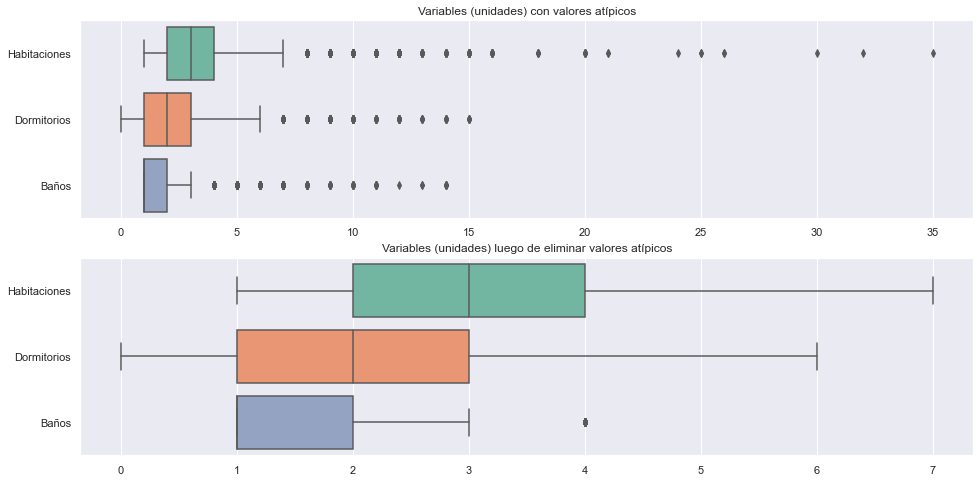

In [123]:
fig, axarr= plt.subplots(2, figsize=(16,8)) 
sns.boxplot(data=Unidades1, ax=axarr[0], orient='h', palette='Set2')
sns.boxplot(data=Unidades2, ax=axarr[1], orient='h', palette='Set2')
axarr[0].title.set_text('Variables (unidades) con valores atípicos')
axarr[1].title.set_text('Variables (unidades) luego de eliminar valores atípicos')
plt.show()

Si bien en el gráfico de boxplot muestra que 4 baños es un outlier, es un valor razonable para propiedades que pueden tenes hasta 1000 mtrs2 de superficie cubierta y un precio de 2 millones de dolares. 

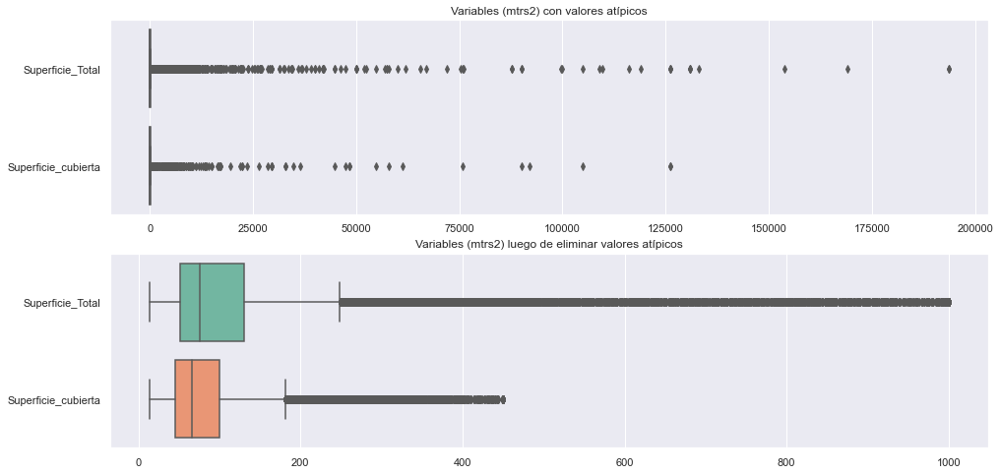

In [124]:
fig, axarr= plt.subplots(2, figsize=(16,8)) 
sns.boxplot(data=mtrs2_1, ax=axarr[0], orient='h', palette='Set2')
sns.boxplot(data=mtrs2_2, ax=axarr[1], orient='h', palette='Set2')
axarr[0].title.set_text('Variables (mtrs2) con valores atípicos')
axarr[1].title.set_text('Variables (mtrs2) luego de eliminar valores atípicos')
plt.show()

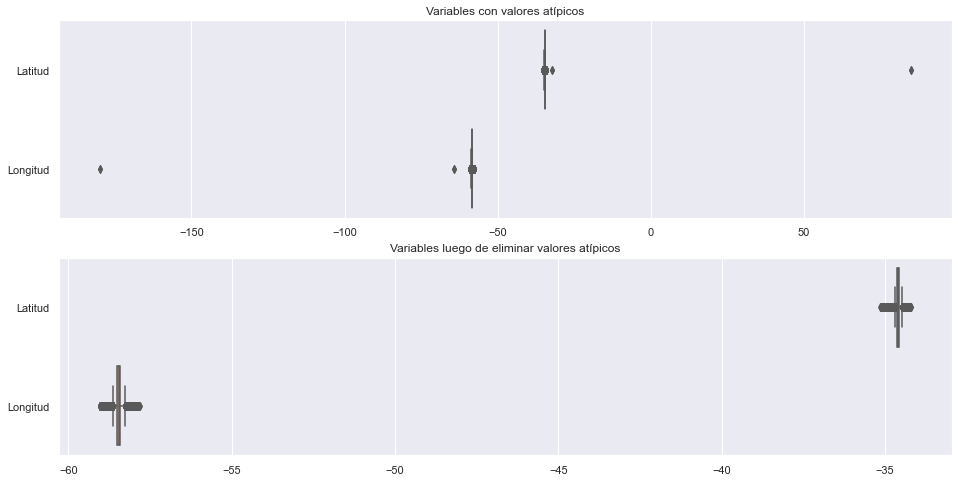

In [125]:
fig, axarr= plt.subplots(2, figsize=(16,8)) 
sns.boxplot(data=ubicacion1, ax=axarr[0], orient='h', palette='Set2')
sns.boxplot(data=ubicacion2, ax=axarr[1], orient='h', palette='Set2')
axarr[0].title.set_text('Variables con valores atípicos')
axarr[1].title.set_text('Variables luego de eliminar valores atípicos')
plt.show()

Como podemos ver los gráficos de Latitud y Longitud conviene realizarlos por separado ya que las escalas no permiten visualizarlos. 

C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Latitud'>

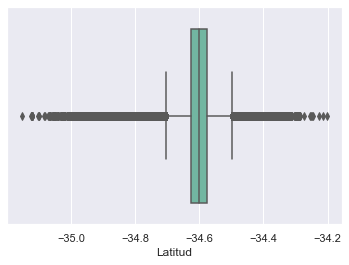

In [126]:
sns.boxplot(df26.Latitud, orient='h', palette='Set2')

C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Longitud'>

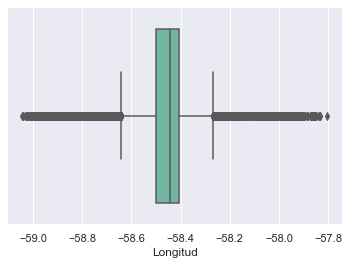

In [127]:
sns.boxplot(df26.Longitud, orient='h', palette='Set2')

Las coordenadas decimales de la Ciudad de Buenos Aires son Latitud: -34.61 y Longitud: -58.38. Como vemos en estos boxplots la mayoría de las propiedades se ubican en la Ciudad de Buenos Aires (CABA). Más adelante, al filtrar solo las propiedades que se ubican en CABA los outliers o datos atípicos no deberían figurar en el gráfico. 

**INSTANCIAS DUPLICADAS**

**Veo cuantas instancias duplicadas hay y las elimino**

In [128]:
Instancias_duplicadas = df26[df26.duplicated()]
print('Nº de instancias duplicadas:', Instancias_duplicadas.shape)

Nº de instancias duplicadas: (42617, 11)


In [129]:
df26.shape

(140679, 11)

In [130]:
df26.describe() # Veo los datos estadisticos antes de eliminar las instancias repetidas. 

,Latitud,Longitud,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio
count,131276.000000,131243.000000,140679.000000,140679.000000,135339.000000,120939.000000,120137.000000,1.406790e+05
mean,-34.606084,-58.461005,2.983238,1.919583,1.532123,117.549566,84.742619,2.191308e+05
std,0.096112,0.135910,1.225341,1.047912,0.756638,125.623373,58.271383,1.919122e+05
min,-35.150806,-59.042416,1.000000,0.000000,1.000000,14.000000,14.000000,3.300000e+04
25%,-34.626924,-58.501518,2.000000,1.000000,1.000000,51.000000,46.000000,1.100000e+05
50%,-34.600953,-58.443019,3.000000,2.000000,1.000000,76.000000,66.000000,1.650000e+05
75%,-34.575393,-58.408174,4.000000,3.000000,2.000000,130.000000,100.000000,2.576200e+05
max,-34.202767,-57.805832,7.000000,6.000000,4.000000,1000.000000,450.000000,2.000000e+06


In [131]:
df27= df26.drop_duplicates() # Elimino las instancias duplicadas

In [132]:
Instancias_duplicadas = df27[df27.duplicated()]
print('Nº de instancias duplicadas:', Instancias_duplicadas.shape) # Chequeo que ya no tengo instancias duplidadas 

Nº de instancias duplicadas: (0, 11)


In [133]:
df27.shape

(98062, 11)

In [134]:
df27.describe()# Veo los datos estadisticos luego de eliminar las instancias repetidas. 

,Latitud,Longitud,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio
count,91452.000000,91422.000000,98062.000000,98062.000000,93323.000000,81352.000000,80731.000000,9.806200e+04
mean,-34.612315,-58.461928,2.995248,1.909435,1.534831,124.542101,86.744794,2.159164e+05
std,0.104022,0.147613,1.257173,1.071451,0.760752,135.202459,60.662351,1.910721e+05
min,-35.150806,-59.042416,1.000000,0.000000,1.000000,14.000000,14.000000,3.300000e+04
25%,-34.636924,-58.511789,2.000000,1.000000,1.000000,52.000000,46.000000,1.090000e+05
50%,-34.602960,-58.449188,3.000000,2.000000,1.000000,78.000000,67.000000,1.596610e+05
75%,-34.572316,-58.404741,4.000000,3.000000,2.000000,138.000000,105.000000,2.500000e+05
max,-34.202767,-57.805832,7.000000,6.000000,4.000000,1000.000000,450.000000,2.000000e+06


Como era de esperar al eliminar las instancias duplicadas aumenta la variabilidad (desvio estandar). Sin embargo, media no se ve afectada paraalgunas variables y para otras no varía significativamente. 

**Del análisis de los datos podemos ver que hay propiedades con superficie cubierta mayor a la superficie total lo cual es un error, veamos cuantas instancias son.**

In [135]:
df27['Sup_correg'] =df27['Superficie_Total'] -df27['Superficie_cubierta']

<ipython-input-135-6aedda773da0>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df27['Sup_correg'] =df27['Superficie_Total'] -df27['Superficie_cubierta']


In [136]:
error_sup=df27[df27['Sup_correg']<0] # Este filtrado me permite contar cuantas instancias cumplen con el error mencionado. 
error_sup.shape

(1038, 12)

Como podemos ver existen 1113 instancias con "Superficie_cubierta" mayor a "Superficie_Total", representan un 0.76% del total de instancias por lo cual vamos a eliminarlas.   

In [137]:
# Genero un nuevo dataframe que excluya las propiedades con superficie cubierta superior a la superficie total.
df28 =df27.drop(error_sup.index, axis=0)
df28.shape

(97024, 12)

In [138]:
df28.drop(['Sup_correg'], axis=1, inplace=True) # Elimino la columna que utilicé para filtrar las instancias con superficie total inferior a superficie cubierta

In [139]:
df28.head() # Veo como quedó la estructura del dataframe

,Latitud,Longitud,ZonaBA_CABA,Barrio_Ciudad,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio,Tipo_de_propiedad
1,-34.624056,-58.412110,Capital Federal,Boedo,2.0,1.0,2.0,70.0,58.0,159000.0,PH
2,-34.593569,-58.427474,Capital Federal,Palermo,2.0,1.0,1.0,45.0,45.0,125000.0,PH
3,-34.581294,-58.436754,Capital Federal,Palermo,2.0,1.0,1.0,85.0,50.0,295000.0,PH
4,-34.914194,-57.938219,Bs.As. G.B.A. Zona Sur,La Plata,2.0,1.0,1.0,50.0,35.0,40000.0,PH
5,-34.593779,-58.441239,Capital Federal,Villa Crespo,2.0,1.0,1.0,56.0,56.0,150000.0,PH


**VARIABLES CATEGORICAS**

TIPO DE PROPIEDADES 

In [140]:
(df28['Tipo_de_propiedad'].value_counts(normalize=True)*100) # Esta función me devuelve el porcentaje de cada tipo de propiedad que hay en el dataset. 

Departamento       71.775025
Casa               16.240312
PH                  9.717183
Lote                0.882256
Oficina             0.541103
Local comercial     0.297864
Otro                0.230871
Depósito            0.213349
Casa de campo       0.088638
Cochera             0.013399
Name: Tipo_de_propiedad, dtype: float64

<AxesSubplot:>

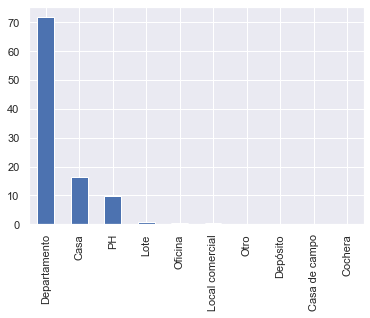

In [141]:
(df28['Tipo_de_propiedad'].value_counts(normalize=True)*100).plot.bar() 

Como podemos ver el 96% de las propiedades corresponden a Departamentos, Casas y PHs, así que vamos a seleccionar estas propiedades del dataframe. 

**ZonaBA_CABA**

In [142]:
(df28['ZonaBA_CABA'].value_counts(normalize=True)*100) # Esta función me devuelve el porcentaje de cada tipo de propiedad que hay en el dataset. 

Capital Federal             58.909136
Bs.As. G.B.A. Zona Norte    16.852531
Bs.As. G.B.A. Zona Sur      14.036733
Bs.As. G.B.A. Zona Oeste    10.201600
Name: ZonaBA_CABA, dtype: float64

Como podemos ver más del 58% de las propiedades corresponden a la Ciudad de Buenos Aires, por otro lado para poder comparar los modelos del proyecto 1 con este proyecto es conveniente tomar el mismo grupo de propiedades en cuanto a su ubicación, así que vamos a seleccionar estas propiedades del dataframe. 

In [143]:
#Voy a realizar el filtrado utilizando una mascara para las propiedades ubicadas en Capital Federal. 
mask = df28['ZonaBA_CABA'].values == 'Capital Federal'

# Voy a crear un nuevo dataset seleccionando las filas codificadas en booleanos, que cree anteriormente, con el método loc() 
df_new = df28.loc[mask] 

# Creo una lista con las categóticas que me interesa seleccionar
li=['Departamento','Casa','PH'] 

#Ahora voy aplicar el método ISIN: Este método toma un iterable o una serie u otro dataframe como parámetro 
# y comprueba si existen elementos del dataframe en él. Las filas que se evalúen como verdaderas se consideran para el resultado.  

df29= df_new[df_new.Tipo_de_propiedad.isin(li)]
df29.shape

(56422, 11)

**Luego del filtrado de acuerdo a la ubicación (Ciudad de Buenos Aires o CABA) de las propiedades chequeo que si dentro de esta variable hay valores atípicos**

Es importante aclarar los siguientes datos de CABA:

- Latitud Norte: -34.53
- Latitud Sur: -34.70
- Longitud Oeste: -58.53
- Longitud Este: -58.36

C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Latitud'>

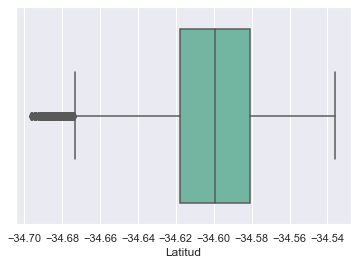

In [144]:
sns.boxplot(df29.Latitud, orient='h', palette='Set2')

C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Longitud'>

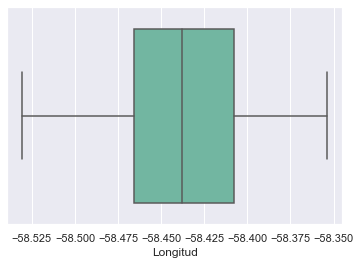

In [145]:
sns.boxplot(df29.Longitud, orient='h', palette='Set2')

Como podemos ver la distribución de datos de estas variables coinciden perfectamente con las coordenadas decimales de la Ciudad de Buenos Aires

In [146]:
df30=df29.rename(columns={"ZonaBA_CABA": "CABA","Barrio_Ciudad": "Barrio"}) #Dado que filtré las instancias de esta variable voy a cambiar el nombre para mejorar la interpretabilidad

In [147]:
df30.head()

,Latitud,Longitud,CABA,Barrio,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio,Tipo_de_propiedad
1,-34.624056,-58.412110,Capital Federal,Boedo,2.0,1.0,2.0,70.0,58.0,159000.0,PH
2,-34.593569,-58.427474,Capital Federal,Palermo,2.0,1.0,1.0,45.0,45.0,125000.0,PH
3,-34.581294,-58.436754,Capital Federal,Palermo,2.0,1.0,1.0,85.0,50.0,295000.0,PH
5,-34.593779,-58.441239,Capital Federal,Villa Crespo,2.0,1.0,1.0,56.0,56.0,150000.0,PH
6,-34.600988,-58.433061,Capital Federal,Villa Crespo,2.0,1.0,1.0,70.0,70.0,159500.0,PH


In [148]:
#Dado que la variable CABA no aporta información relevante para el modelo la voy a eliminar. 
df30.drop(['CABA'], axis=1, inplace=True)
df30.head()

,Latitud,Longitud,Barrio,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio,Tipo_de_propiedad
1,-34.624056,-58.412110,Boedo,2.0,1.0,2.0,70.0,58.0,159000.0,PH
2,-34.593569,-58.427474,Palermo,2.0,1.0,1.0,45.0,45.0,125000.0,PH
3,-34.581294,-58.436754,Palermo,2.0,1.0,1.0,85.0,50.0,295000.0,PH
5,-34.593779,-58.441239,Villa Crespo,2.0,1.0,1.0,56.0,56.0,150000.0,PH
6,-34.600988,-58.433061,Villa Crespo,2.0,1.0,1.0,70.0,70.0,159500.0,PH


**Análisis de la información que aportan las variables Latitud y Longitud**

Lo primero que sospecho es que estas variables tienen una relación con la variable categórica Barrios, a continuación voy a tratar de mostrarlo visualmente: 

Text(0.5, 1.0, 'Ubicación de las propiedades por Barrio')

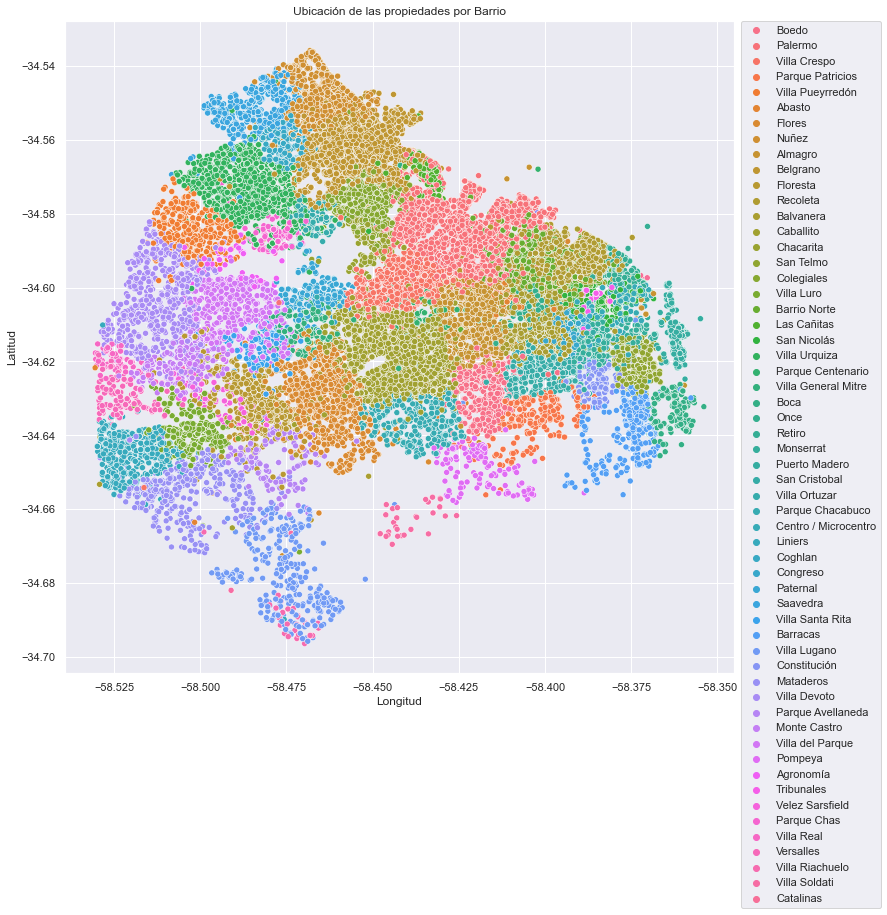

In [149]:
# Gracias Gastón Nievas por la idea!!!
plt.figure(figsize=(12,12))
sns.scatterplot(x=df30.Longitud, y=df30.Latitud, hue=df30.Barrio)
plt.legend(bbox_to_anchor=(1.01, 1),
           borderaxespad=0)
plt.title('Ubicación de las propiedades por Barrio')

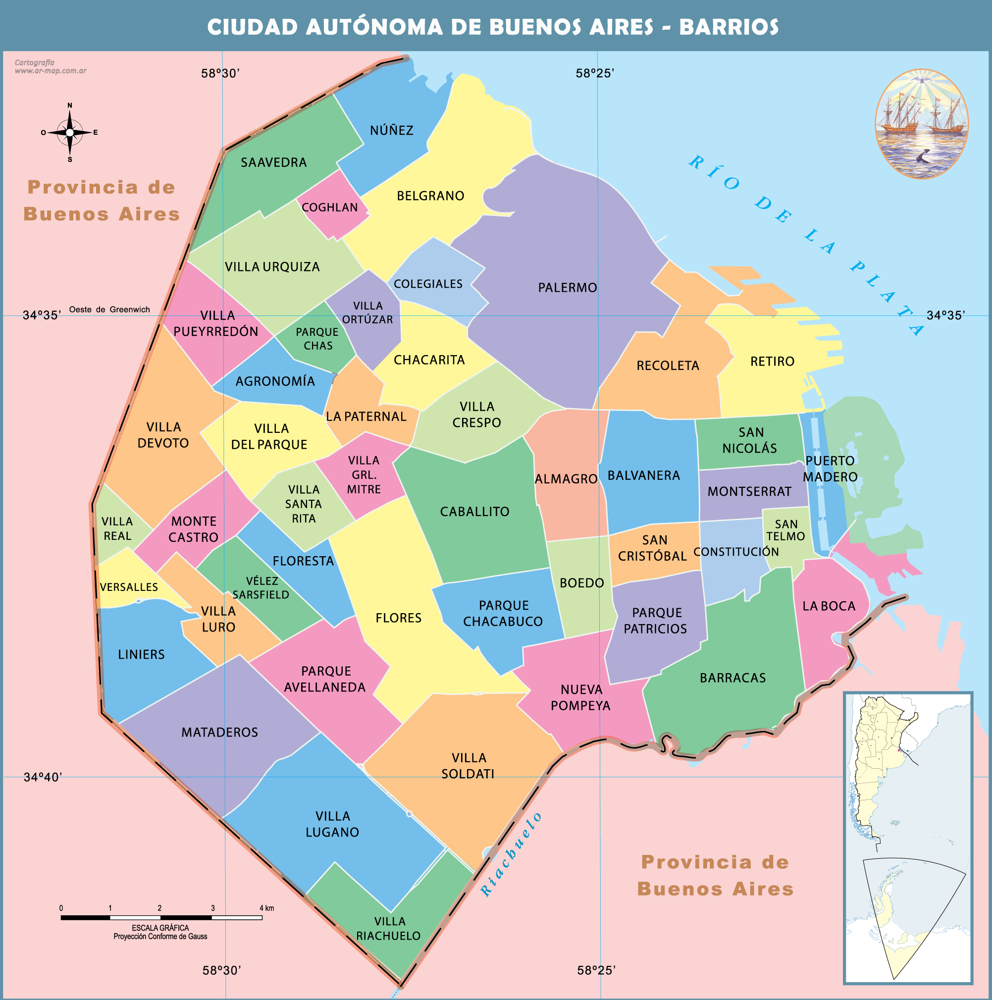

In [150]:
from IPython import display 
display.size = (20, 20)
display.Image('http://mapoteca.educ.ar/.files/wp-content/mapas/ciudad-autonoma-de-buenos-aires/barrios/impresion/ciudad-autonoma-de-buenos-aires_barrios.jpg')

Como podemos ver al realizar el scatterplot de Latitud vs Longitud (ubicaciones de las propiedades) y colorear las propiedades según el Barrio, practicamente se dibuja el mapa de la Ciudad de Buenos Aires. También podemos observar que muchos puntos (propiedades) parecieran estar mal clasificados en cuanto al barrio al que pertenecen y otros directamente parecieran ser errores de carga (algunos puntos que se escapan del mapa y pareciaran estar en el río).

Text(0.5, 1.0, 'Latitud (Sur-Norte) Vs Precio')

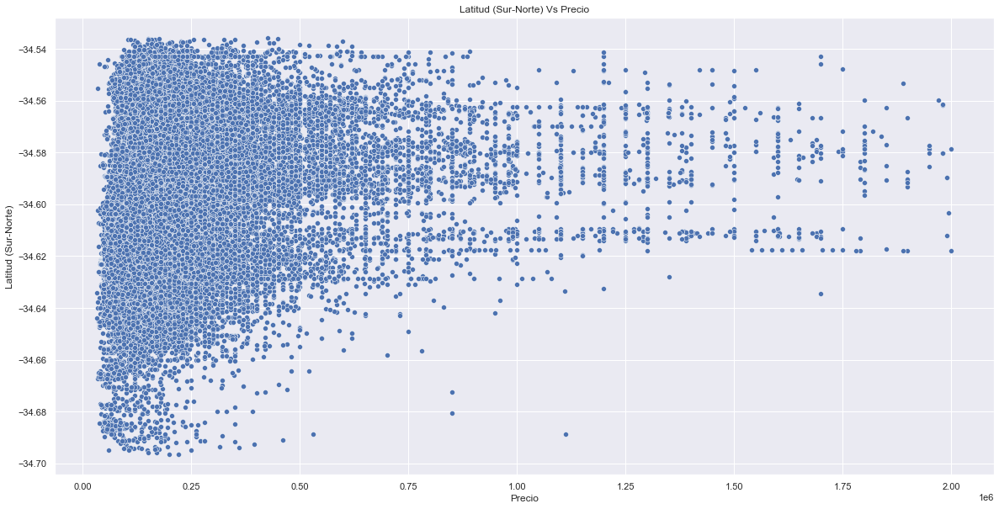

In [151]:
sns.set()
plt.figure(figsize=(20,10)) # Voy a estudiar la distribución de los precios respecto a la Latitud. 
ax=sns.scatterplot(x=df30.Precio, y=df30.Latitud)
ax.set_ylabel("Latitud (Sur-Norte)")
plt.title('Latitud (Sur-Norte) Vs Precio')

En este gráfico se ve claramente como las propiedades con los precios más altos se encuentran en la zona norte de la Ciudad. 

Text(0.5, 1.0, 'Longitud (Oeste-Este) Vs Precio')

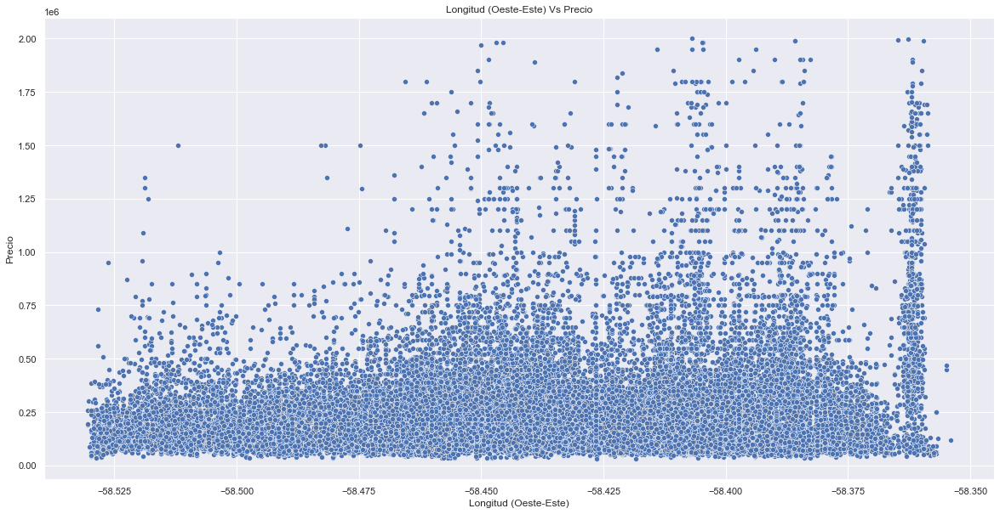

In [152]:
plt.figure(figsize=(20,10)) # Voy a estudiar la distribución de los precios respecto a la Latitud. 
ax=sns.scatterplot(x=df30.Longitud, y=df30.Precio)
ax.set_xlabel("Longitud (Oeste-Este)")
plt.title('Longitud (Oeste-Este) Vs Precio')

En este gráfico se ve claramente como las propiedades con los precios más altos se encuentran en la zona Este de la Ciudad, sobre todo en Puerto Madero (la urbanización más cara de la ciudad). 

**VUELVO A ANALIZAR LOS DATOS FALTANTES LUEGO DE REALIZAR LOS FILTROS**

In [153]:
print(df30.isnull().sum()) # Esta función de pandas muestra el número de valores faltantes por columnas del DataFrame Prop. 

Latitud                2866
Longitud               2879
Barrio                    0
Habitaciones              0
Dormitorios               0
Baños                  1825
Superficie_Total       6988
Superficie_cubierta    7285
Precio                    0
Tipo_de_propiedad         0
dtype: int64


In [154]:
df30.isna().sum()/df30.shape[0]*100 # Calcula el porcentaje de valores faltantes de cada columna

Latitud                 5.079579
Longitud                5.102620
Barrio                  0.000000
Habitaciones            0.000000
Dormitorios             0.000000
Baños                   3.234554
Superficie_Total       12.385240
Superficie_cubierta    12.911630
Precio                  0.000000
Tipo_de_propiedad       0.000000
dtype: float64

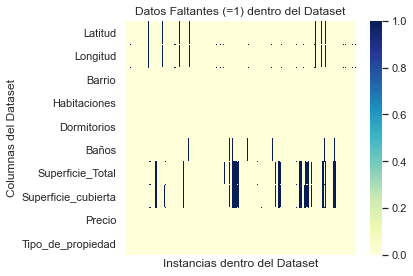

In [155]:
# Gráficamente podemos ver en color dónde están los datos faltantes dentro del dataset. 
# Este gráfico muestra los datos faltantes dentro de la estructura de datos.

null= df30.isnull()
heat=sns.heatmap(null.T, cmap='YlGnBu', xticklabels=False)
plt.title('Datos Faltantes (=1) dentro del Dataset')
plt.xlabel('Instancias dentro del Dataset')
plt.ylabel('Columnas del Dataset')
plt.tight_layout()

Como podemos observar quedan entre 5 y 13 % de datos faltantes. 

In [156]:
# Antes de continuar voy a eliminar la variable Barrios ya que, como vimos más arrriba,  esta insformación está contenida en Latitud y Longitud.
df30.drop(['Barrio'], axis=1, inplace=True)
df30.head()

,Latitud,Longitud,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio,Tipo_de_propiedad
1,-34.624056,-58.412110,2.0,1.0,2.0,70.0,58.0,159000.0,PH
2,-34.593569,-58.427474,2.0,1.0,1.0,45.0,45.0,125000.0,PH
3,-34.581294,-58.436754,2.0,1.0,1.0,85.0,50.0,295000.0,PH
5,-34.593779,-58.441239,2.0,1.0,1.0,56.0,56.0,150000.0,PH
6,-34.600988,-58.433061,2.0,1.0,1.0,70.0,70.0,159500.0,PH


In [157]:
df30.shape

(56422, 9)

**Voy evaluar si la variable "Tipo de propiedad" me aporta información relevante que le permita al modelo predecir el precio de una propiedad**

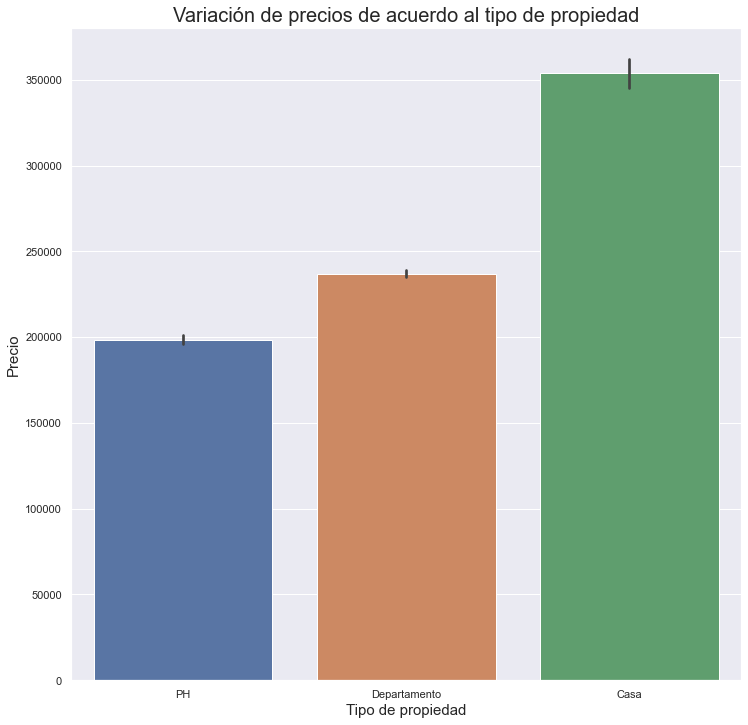

In [158]:
plt.figure(figsize=(12,12))
sns.set()
b=sns.barplot(x=df30.Tipo_de_propiedad, y=df30.Precio)
b.set_xlabel("Tipo de propiedad",fontsize=15)
b.set_ylabel("Precio",fontsize=15)
b.axes.set_title("Variación de precios de acuerdo al tipo de propiedad",fontsize=20)
plt.show()

**Como podemos ver en el gráfico hay diferencias significativas en el precio de acuerdo al tipo de propiedad. Es una variable que aporta información al modelo**

### **TRAIN, TEST, SPLIT**

Antes de realizar el preprocesamiento voy a separar los datos en grupo de entrenamiento y grupo de testeo (que son datos que el modelo no ha visto o no ha sido entrenado con ellos). Nos referimos a preprocesamiento cuando tomamos un grupo de datos que entrenamos (fit) con un algoritmos (modelos) de preprocesamiento y luego transformamos (transform o predict) los datos en el grupo de testeo. En otras palabras, no se debe usar los datos de testeo para aprender los parámetros del modelo y, por la misma razón, no se deben usar para aprender los parámetros del transformador. Entonces, solo debe usar las muestras de entrenamiento para ajustar los parámetros del transformador, esto evita llevar información al modelo final que genere un sobreajuste a los datos. 

In [159]:
X = df30.drop('Precio', axis=1)
y = df30['Precio']
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

**PREPROCESAMIENTO**

**Justificación**

Dentro del pipeline voy a realizar (y no voy a realizar) los siguientes transformaciones:


**Imputación de datos faltantes con KNNImputer**

Uno de los primeros pasos en la limpieza de datos es verificar si faltan valores. Esto se debe a que los datos faltantes en el conjunto de datos de entrenamiento pueden reducir la potencia de un modelo o pueden generar un modelo sesgado. Después de todo, si hay valores faltantes, no se puede analizar correctamente la relación entre variables. En Python, los valores perdidos se indican como "NaN".

El método de imputación KNN, es un modelo que utiliza una función de distancia para determinar la similitud. Algunas de las ventajas de utilizar la imputación KNN es que (i) puede predecir tanto variables continuas como categóricas (ii) se tiene en cuenta la estructura de correlación de los datos (iii) las variables con múltiples valores faltantes pueden tratarse fácilmente.

**Escalado de variables numéricas**

La estandarización es una transformación que centra los datos restando el valor medio de la variable y luego se escala dividiendo las variable por su desviación estándar. Después de estandarizar los datos, la media será cero y la desviación estándar uno.

Antes de aplicar cualquier escalado de datos, es muy importante dividir sus datos en un conjunto de entrenamiento y un conjunto de prueba. De lo contrario, mis datos de entrenamiento (y prueba) podrían terminar escalados alrededor de un valor medio que no es en realidad la media del conjunto de entrenamiento ni la media los datos de prueba, y esto dejaría son efecto el verdadero valor de escalar los datos.

La estandarización puede mejorar drásticamente el rendimiento de los modelos. Si una variable tiene una varianza que es órdenes de magnitud mayor que otras, podría dominar esta variable sobre otras y hacer que el estimador no pueda aprender de otras variables correctamente como se esperaba. Otra ventaja de escalar los datos es que el imputador funcione más rápido, los valores de menor magnitud converjeran más rápido a igual que las transformaciones inversas para tener los datos en su forma original.

Utilizo la clase de Sklearn preprocessing.StandardScaler para escalar los datos. Lo que hace el Escalador estándar es estandarizar las los valores restando la media y luego escalando a la varianza de la unidad. La varianza unitaria significa dividir todos los valores por la desviación estándar. 

**Encoding de varaibles catagóricas**

Por lo general, cualquier conjunto de datos estructurados incluye varias columnas, una combinación de variables numéricas y categóricas. Una máquina solo puede entender los números. No puede entender el texto. Ese es esencialmente el caso de los algoritmos de aprendizaje automático. Esa es principalmente la razón por la que necesitamos convertir columnas categóricas en columnas numéricas para que un algoritmo de aprendizaje automático las entienda. Este proceso se llama codificación categórica o Encoding. De esta forma, agregamos información al modelo.

Existen dos tipos de Encoding:

Label Encoding

La codificación de etiquetas es una técnica de codificación popular para manejar variables categóricas. En esta técnica, a cada etiqueta se le asigna un número entero único según el orden alfabético. 
Cuando trabajamos con variables que no son ordinales (A, B y C) , osea que no tienen un orden ni rango, y se realiza la codificación de etiquetas, los nombres de las variables categóricas se clasifican según orden alfabético. Debido a esto, existe una probabilidad muy alta de que el modelo capture una relación ordinal (jerarquica) A < B < C
¡Esto es algo que no queremos! Entonces, ¿cómo podemos superar este obstáculo? Aquí viene el concepto de codificación One-Hot.

One-hot Encoding

One-Hot Encoding crea variables adicionales basadas en el número de valores únicos en la variable categórica. Cada valor único en la categoría se agregará como una variable nueva(variable Dummy). En esta técnica de codificación, cada categoría se representa como un vector one-hot. En esta técnica, resolvimos el problema de la relación ordinal entre los nuevos valores para las variables catagóricas ya que cada categoría está representada por un vector binario.
¿Puede tener algún inconveniente este enfoque? One-Hot Encoding da como resultado una trampa de variable ficticia, ya que el resultado de una variable se puede predecir fácilmente con la ayuda de las variables restantes.
La trampa de la variable ficticia conduce al problema conocido como multicolinealidad. La multicolinealidad ocurre cuando existe una dependencia entre las variables independientes. La multicolinealidad es un problema grave en los modelos de aprendizaje automático como la regresión lineal y la regresión logística.
Entonces, para superar el problema de la multicolinealidad, una de las variables ficticias se debe eliminar, para eso la librería Sklearn posee la clase sklearn.preprocessing.OneHotEncoder que posse el parámetro drop='first' que elimna la primer columna para evitar este problema. 

*Para no generar una relación ordinal entre variables encodeadas voy a utilizar OneHotEncoder.


**Reducción de la dimensionalidad por Análisis de Componentes Principales (PCA)**
En Machine Learning, el número de dimensiones se puede equiparar al número de variables o características (features) que estemos utilizando. 
A medida que aumenta el número de dimensiones, la distancias se vuelven menos discriminativas. A este efecto se le conoce con el nombre de la Maldición de la Dimensión (Curse of Dimensionality) y tiene un gran impacto en técnicas de aprendizaje automático basadas en distancias tales como K-Means y KNN (los k vecinos más cercanos).
Como en este proyecto no voy a utlizar algoritmos de predicción como los menconados anteriormente, no voy a aplicar este tipo de preprocesamiento a los datos. 

Referecias:
https://towardsdatascience.com/preprocessing-with-sklearn-a-complete-and-comprehensive-guide-670cb98fcfb9

### **PIPELINE**

Voy a realizar el preprocesamiento de los datos utilizando la clase de Sklearn: sklearn.pipeline.Pipeline

Esta sencilla herramienta es útil para:

- La creación de un flujo de trabajo coherente y fácil de entender

- Aplicación de la implementación del flujo de trabajo (transformaciones) en el orden deseado.

- Reproducibilidad

Para la implementación de la clase sklearn.pipeline.Pipeline, en el preprocesamiento de datos, utilicé como guía los siguientes artículos:

https://towardsdatascience.com/step-by-step-tutorial-of-sci-kit-learn-pipeline-62402d5629b6

https://medium.com/vickdata/a-simple-guide-to-scikit-learn-pipelines-4ac0d974bdcf

https://towardsdatascience.com/data-science-plumbing-peeking-into-scikit-learn-pipelines-f9233ad638e

https://johaupt.github.io/scikit-learn/tutorial/python/data%20processing/ml%20pipeline/model%20interpretation/columnTransformer_feature_names.html


**EL siguiente bloque código es para extraer el nombre de las variables del pipeline en ColumnTransformer**

In [160]:
import warnings
import sklearn
import pandas as pd

def get_feature_names(column_transformer):
    """Get feature names from all transformers.
    Returns
    -------
    feature_names : list of strings
        Names of the features produced by transform.
    """
    # Remove the internal helper function
    #check_is_fitted(column_transformer)
    
    # Turn loopkup into function for better handling with pipeline later
    def get_names(trans):
        # >> Original get_feature_names() method
        if trans == 'drop' or (
                hasattr(column, '__len__') and not len(column)):
            return []
        if trans == 'passthrough':
            if hasattr(column_transformer, '_df_columns'):
                if ((not isinstance(column, slice))
                        and all(isinstance(col, str) for col in column)):
                    return column
                else:
                    return column_transformer._df_columns[column]
            else:
                indices = np.arange(column_transformer._n_features)
                return ['x%d' % i for i in indices[column]]
        if not hasattr(trans, 'get_feature_names'):
        # >>> Change: Return input column names if no method avaiable
            # Turn error into a warning
            warnings.warn("Transformer %s (type %s) does not "
                                 "provide get_feature_names. "
                                 "Will return input column names if available"
                                 % (str(name), type(trans).__name__))
            # For transformers without a get_features_names method, use the input
            # names to the column transformer
            if column is None:
                return []
            else:
                return [name + "__" + f for f in column]

        return [name + "__" + f for f in trans.get_feature_names()]
    
    ### Start of processing
    feature_names = []
    
    # Allow transformers to be pipelines. Pipeline steps are named differently, so preprocessing is needed
    if type(column_transformer) == sklearn.pipeline.Pipeline:
        l_transformers = [(name, trans, None, None) for step, name, trans in column_transformer._iter()]
    else:
        # For column transformers, follow the original method
        l_transformers = list(column_transformer._iter(fitted=True))
    
    
    for name, trans, column, _ in l_transformers: 
        if type(trans) == sklearn.pipeline.Pipeline:
            # Recursive call on pipeline
            _names = get_feature_names(trans)
            # if pipeline has no transformer that returns names
            if len(_names)==0:
                _names = [name + "__" + f for f in column]
            feature_names.extend(_names)
        else:
            feature_names.extend(get_names(trans))
    
    return feature_names

Antes de hacer el preprocesamiento en el Pipeline chequeo que los tipos de datos sean los adecuados. 

In [161]:
df30.dtypes

Latitud                float64
Longitud               float64
Habitaciones           float64
Dormitorios            float64
Baños                  float64
Superficie_Total       float64
Superficie_cubierta    float64
Precio                 float64
Tipo_de_propiedad       object
dtype: object

Transformo el tipo de datos "object" a "category" antes de realizar el encodeado.

In [162]:
df30["Tipo_de_propiedad"] = df30["Tipo_de_propiedad"].astype("category")

In [163]:
df30.dtypes

Latitud                 float64
Longitud                float64
Habitaciones            float64
Dormitorios             float64
Baños                   float64
Superficie_Total        float64
Superficie_cubierta     float64
Precio                  float64
Tipo_de_propiedad      category
dtype: object

In [164]:
from sklearn.pipeline import Pipeline
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder

numeric_transformer = Pipeline(steps=[('scaler', StandardScaler()),
    ('imputer', KNNImputer(n_neighbors=2,weights='uniform', metric='nan_euclidean'))
   ])
categorical_transformer = Pipeline(steps=[ 
    ('one_hot_encoder', OneHotEncoder(sparse=False, handle_unknown='ignore'))])

In [165]:
from sklearn.compose import make_column_selector as selector

numeric_features = ['Latitud','Longitud','Habitaciones','Dormitorios','Baños','Superficie_Total','Superficie_cubierta']
categorical_features = ['Tipo_de_propiedad']
from sklearn.compose import ColumnTransformer

preprocessor= ColumnTransformer(
   transformers=[
    ('numeric', numeric_transformer, numeric_features)
   ,('categorical', categorical_transformer, categorical_features)]) 

### **Visualizo la transformación de los datos**

**Escalado y Encoding**

In [166]:
encoder1= preprocessor.fit_transform(X_train)

In [167]:
encoder=pd.DataFrame(preprocessor.fit_transform(X_train))
encoder.head()

,0,1,2,3,4,5,6,7,8,9
0,-1.537678,1.794536,-1.557194,-0.896612,-0.677482,-0.060167,0.022325,0.0,1.0,0.0
1,1.208018,-0.272547,0.113086,0.118217,0.651115,0.388375,0.463496,0.0,1.0,0.0
2,-0.970421,0.359664,0.113086,0.118217,0.651115,-0.030265,0.137413,0.0,1.0,0.0
3,0.281685,1.062772,-0.722054,-0.896612,-0.677482,-0.882494,-0.879200,0.0,1.0,0.0
4,0.143933,-0.068043,0.948226,1.133047,0.651115,0.612646,0.118231,0.0,1.0,0.0


In [168]:
features= get_feature_names(preprocessor)
features

<ipython-input-160-6e516af9da48>:34: UserWarning: Transformer scaler (type StandardScaler) does not provide get_feature_names. Will return input column names if available
  warnings.warn("Transformer %s (type %s) does not "
<ipython-input-160-6e516af9da48>:34: UserWarning: Transformer imputer (type KNNImputer) does not provide get_feature_names. Will return input column names if available
  warnings.warn("Transformer %s (type %s) does not "


['numeric__Latitud',
 'numeric__Longitud',
 'numeric__Habitaciones',
 'numeric__Dormitorios',
 'numeric__Baños',
 'numeric__Superficie_Total',
 'numeric__Superficie_cubierta',
 'one_hot_encoder__x0_Casa',
 'one_hot_encoder__x0_Departamento',
 'one_hot_encoder__x0_PH']

**Análisis del encoding de variables categóricas**: Como podemos ver en el DataFrame "encoder", la clase OneHotEncoder de Sklearn genera tres nuevos features donde le asigna un 1 a la propiedad que corresponde a Casa, Departamento o PH.  

In [169]:
encoder.describe()

,0,1,2,3,4,5,6,7,8,9
count,45137.000000,45137.000000,4.513700e+04,4.513700e+04,45137.000000,45137.000000,45137.000000,45137.000000,45137.000000,45137.000000
mean,-0.007448,-0.024117,1.098786e-16,8.925665e-17,0.001019,0.012396,0.007137,0.032634,0.865055,0.102311
std,0.993891,0.997276,1.000011e+00,1.000011e+00,1.001139,1.024509,1.029040,0.177679,0.341668,0.303060
min,-3.704838,-2.390788,-1.557194e+00,-1.911441e+00,-0.677482,-1.151619,-1.224464,0.000000,0.000000,0.000000
25%,-0.712682,-0.737117,-7.220537e-01,-8.966121e-01,-0.677482,-0.658223,-0.687386,0.000000,1.000000,0.000000
50%,-0.020480,-0.013948,1.130863e-01,1.182173e-01,-0.677482,-0.314341,-0.322940,0.000000,1.000000,0.000000
75%,0.699455,0.763419,9.482262e-01,1.133047e+00,0.651115,0.283715,0.290864,0.000000,1.000000,0.000000
max,2.428980,2.194466,3.453646e+00,4.177535e+00,3.308310,13.590459,7.138613,1.000000,1.000000,1.000000


**Análisis del escalado de datos**: Como podemos observar en la descripción de los estadisticos del DataFrame "encoder" (no consideran las variables 7,8, 9, ya que son producto del encoder y toman valores 0 y 1) la media de las variables está muy próxima al valor cero y el desvío estandar 1 como era de esperar según el método seleccionado para normalizar los datos, explicado con anterioridad en este notebook. 

**Imputación de datos faltantes**

In [170]:
numeric_features = X_train[['Latitud','Longitud','Habitaciones','Dormitorios','Baños','Superficie_Total','Superficie_cubierta']]
imputer= KNNImputer(n_neighbors=2,weights='uniform', metric='nan_euclidean')

imputer_1= imputer.fit_transform(numeric_features)

In [171]:
imputer_2=pd.DataFrame(imputer_1)
imputer_2.head(10)

,0,1,2,3,4,5,6
0,-34.639677,-58.369328,1.0,1.0,1.0,87.0,79.0
1,-34.567787,-58.448913,3.0,2.0,2.0,117.0,102.0
2,-34.624824,-58.424572,3.0,2.0,2.0,82.5,73.5
3,-34.592041,-58.397502,2.0,1.0,1.0,32.0,32.0
4,-34.595647,-58.441040,4.0,3.0,2.0,132.0,84.0
5,-34.595726,-58.440738,2.0,1.0,1.0,35.0,30.0
6,-34.602353,-58.413578,2.0,1.0,1.0,53.0,45.0
7,-34.544553,-58.472940,3.0,2.0,1.0,65.0,65.0
8,-34.609528,-58.437127,4.0,3.0,2.0,160.0,135.0
9,-34.567569,-58.486610,3.0,2.0,1.0,80.5,77.5


In [172]:
X_train.head(10)

,Latitud,Longitud,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Tipo_de_propiedad
91862,-34.639677,-58.369328,1.0,1.0,1.0,87.0,79.0,Departamento
11083,-34.567787,-58.448913,3.0,2.0,2.0,117.0,102.0,Departamento
96809,-34.624824,-58.424572,3.0,2.0,2.0,NaN,NaN,Departamento
21053,-34.592041,-58.397502,2.0,1.0,1.0,32.0,32.0,Departamento
10235,-34.595647,-58.441040,4.0,3.0,2.0,132.0,84.0,Departamento
1358,-34.595726,-58.440738,2.0,1.0,1.0,35.0,30.0,Departamento
112868,-34.602353,-58.413578,2.0,1.0,1.0,53.0,45.0,Departamento
37341,-34.544553,-58.472940,3.0,2.0,1.0,65.0,65.0,Departamento
109652,-34.609528,-58.437127,4.0,3.0,2.0,160.0,135.0,Casa
15255,-34.567569,-58.486610,3.0,2.0,1.0,NaN,NaN,Departamento


In [173]:
# Para poder evaluar el desempeño del KNNImputer selecciono las propiedades con caracteristicas similares (Habitaciones, Dormitorios y Baños) y comparo con los valores estadíticos de referencia. 
caso_1 = X_train[(X_train['Habitaciones'] == 3.0) & (X_train['Dormitorios'] == 2.0) & (X_train['Baños'] == 2.0)]  
caso_1.describe()

,Latitud,Longitud,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta
count,4211.000000,4210.000000,4446.0,4446.0,4446.0,3866.000000,3852.000000
mean,-34.594402,-58.440307,3.0,2.0,2.0,93.531040,79.973261
std,0.025633,0.036577,0.0,0.0,0.0,34.062369,23.390847
min,-34.694250,-58.528638,3.0,2.0,2.0,33.000000,20.000000
25%,-34.612601,-58.465896,3.0,2.0,2.0,73.000000,65.000000
50%,-34.593056,-58.439997,3.0,2.0,2.0,84.000000,74.000000
75%,-34.575984,-58.413164,3.0,2.0,2.0,103.000000,87.000000
max,-34.536286,-58.359457,3.0,2.0,2.0,670.000000,272.000000


In [174]:
# Para poder evaluar el desempeño del KNNImputer selecciono las propiedades con caracteristicas similares (Habitaciones, Dormitorios y Baños) y comparo con los valores estadíticos de referencia. 
caso_2 = X_train[(X_train['Habitaciones'] == 3.0) & (X_train['Dormitorios'] == 2.0) & (X_train['Baños'] == 1.0)]  
caso_2.describe()

,Latitud,Longitud,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta
count,7910.000000,7908.000000,8187.0,8187.0,8187.0,7604.000000,7548.000000
mean,-34.603693,-58.441021,3.0,2.0,1.0,74.563651,63.939984
std,0.026776,0.038158,0.0,0.0,0.0,29.737074,16.954431
min,-34.696419,-58.530467,3.0,2.0,1.0,20.000000,19.000000
25%,-34.620806,-58.468960,3.0,2.0,1.0,58.000000,53.000000
50%,-34.603855,-58.439899,3.0,2.0,1.0,67.000000,60.000000
75%,-34.587058,-58.411158,3.0,2.0,1.0,81.000000,70.000000
max,-34.536279,-58.353930,3.0,2.0,1.0,694.000000,293.000000


**Análisis de la imputación de datos faltantes**: Como podemos ver, los DataFrames "imputer_2" y "X_train" coinciden en el orden de las filas. Basta con observar y comparar los valores de las variables Latitud y Longitud de"imputer_2" con las correspondientes posiciones en las columnas 0 y 1 de "X_train". Dicho esto, vamos a evaluar la performance de KNNImputer sobre los datos faltantes. Como podemos ver en las instancias 96809 y 15255 de X_train tenemos datos faltantes, estas instancias se corresponden con las instancias 2 y 9 de "imputer_2" respectivamente. 
Para poder evaluar el desempeño del KNNImputer selecciono las propiedades con caracteristicas similares (Habitaciones, Dormitorios y Baños) y comparo con los valores estadíticos de referencia. 
En el caso de la instancia 96809 vemos que el valor asinado por KNNImputer a los valores faltantes Superficie_Total(82.5) y	Superficie_cubierta(73.5) se acerca mucho al percentil 50 y está muy próximo al valor medio para este tipo de propiedades. En el caso de la instancia 15255 el valor asignado por el imputador Superficie_Total(80.5) y	Superficie_cubierta(77.5) se aproxima al percentil 75 sobre todo en el caso de Superficie_Total.

### **Métricas**

**Coeficiente de determinación o R2**

Se utiliza para evaluar el rendimiento de un modelo de regresión. Es la cantidad de variación en el atributo dependiente que es predecible a partir de la variable o variables independientes. Se utiliza para verificar qué tan bien se reproducen los resultados observados por el modelo, dependiendo de la relación de desviación total de los resultados descrita por el modelo. R² es una métrica relativa, por lo que puede ser usada para comparar con otros modelos entrenados con los mismos datos. También, puede usarse para tener una idea aproximada del rendimiento de un modelo, en general.

La definición más general de R2 es la siguiente:

R2= 1 - SSres/SStot

Donde SSres es la suma del cuadrado de los errores y SStot es la suma de todas las diferencias al cuadrado entre las observaciones y su media general.
En el mejor de los casos, los valores modelados coinciden exactamente con los valores observados, lo que da como resultado SSres= 0 y R2 = 1. Un modelo de referencia, que siempre predice el mismo valor para valores entrada diferentes, tendrá un R2 = 0 . Los modelos que tienen peores predicciones que esta línea de base tendrán un R2 negativo. 

**Raiz cuadrada del error cuadrático medio. Root Mean Squared Error (RMSE)**

Si bien R Cuadrado es una medida relativa de qué tan bien se ajusta el modelo a las variables dependientes, el Error cuadrático medio es una medida absoluta de cuan bien,nuestro modelo, se ajusta a las datos.
El MSE se calcula mediante la suma del cuadrado del error de predicción que es el valor de salida real menos el valor de salida previsto y luego se divide por el número de instancias. Da un número absoluto de cuánto se desvían los resultados previstos del número real. No se pueden generar muchas conclusiones a partir de un solo resultado, pero brinda un número real para comparar con los resultados de otros modelos y ayudar a seleccionar el mejor modelo de regresión.
La raíz cuadrática del error cuadrático medio (RMSE) se usa con más frecuencia que MSE porque, en primer lugar, a veces el valor de MSE puede ser demasiado grande para compararlo fácilmente. En segundo lugar, el MSE se calcula por el cuadrado del error y, por lo tanto, la raíz cuadrada lo devuelve al mismo nivel de error de predicción y facilita la interpretación.

En resumen trabajar con RMSE permite:

- penalizar grandes errores
- hacer que el resultado esté en las mismas unidades que la variable dependiente.
- utilizar una función de pérdida para la validación que se pueda calcular rápidamente


**DecisionTreeRegressor** (modelo con mejor performance seleccinado del proyecto 1)

In [175]:
# Cargo las librerias e importo los modelos. 
import numpy as np
# Manipulación del dataframe
import pandas as pd
from sklearn import linear_model
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.impute import KNNImputer
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures 
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_validate
import xgboost as xgb
from xgboost import XGBRegressor
import scipy as sp
from sklearn.model_selection import RandomizedSearchCV

In [176]:
from sklearn.tree import DecisionTreeRegressor
pipeline_1 = Pipeline(steps = [
               ('preprocessor_dt1', preprocessor)
              ,('regressor_dt', DecisionTreeRegressor(max_depth=12))
           ])

In [177]:
dt_model = pipeline_1.fit(X_train, y_train)
print (dt_model)

Pipeline(steps=[('preprocessor_dt1',
                 ColumnTransformer(transformers=[('numeric',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler()),
                                                                  ('imputer',
                                                                   KNNImputer(n_neighbors=2))]),
                                                  ['Latitud', 'Longitud',
                                                   'Habitaciones',
                                                   'Dormitorios', 'Baños',
                                                   'Superficie_Total',
                                                   'Superficie_cubierta']),
                                                 ('categorical',
                                                  Pipeline(steps=[('one_hot_encoder',
                                                  

In [178]:
from sklearn.metrics import r2_score
predictions_rf1_test = dt_model.predict(X_test)
print (r2_score(predictions_rf1_test, y_test))

0.7306050408713973


In [179]:
from sklearn.metrics import r2_score
predictions_rf1_train = dt_model.predict(X_train)
print (r2_score(predictions_rf1_train, y_train))

0.8837816839758222


In [180]:
# CALCULAMOS EL ERROR
rmse_train_p2 = np.sqrt(mean_squared_error(y_train, predictions_rf1_train))
rmse_test_p2 = np.sqrt(mean_squared_error(y_test, predictions_rf1_test))

print(f'Raíz del error cuadrático medio en Train: {rmse_train_p2}')
print(f'Raíz del error cuadrático medio en Test: {rmse_test_p2}')

Raíz del error cuadrático medio en Train: 68263.09209678002
Raíz del error cuadrático medio en Test: 104986.29561139512


### **Proyecto 1**

Para poder ver el efecto del preprocesamiento de este proyecto sobre el modelo seleccionado en el proyecto 1 y compararlo con los datos que utilicé para entrenar el modelo del proyecto 1, convertí estos datos (Dataframe) en un archivo CSV para poder traerlo a este notebook.

A continuación un resumen de como fueron procesados los datos para el proyecto 1:

- Selecciona aquellas propiedades en Capital Federal y cuyo tipo de propiedad es Departamento, PH o Casa.
- Selecciona aquellas propiedades cuya superficie total es menor a 1000 m2 y mayor a 15 m2.
- Selecciona aquellas propiedades cuya precio entre 2000000 y 33000 dólares .
- Selecciona las columnas rooms, bedrooms, bathrooms, surface_total, surface_covered y price.
- Descarta aquellas instacias con valores faltantes.
- Eliminación de instancias con Superficie cubierta superior a Superficie Total. 
- Los datos atípicos o outliers se trataron de igual manera que en el proyecto 2(este notebook).
- **No se elimina las instancias duplicadas. Si se hubiesen eliminado quedarian 38.114 instancias, a diferencia de las 56.422 instancias que quedan luego del preprocesamiento en el proyecto 2. Osea, en el proyecto 2 le entregamos más información al modelo. Esta información extra viene de las instancias que recuperamos al imputar los datos de las instacias con datos flatantes, que en el proyecto 1 son eliminadas.**

In [181]:
proyecto1=pd.read_csv(r'C:\Users\Gabriel\OneDrive\Documentos\OneDrive\DATA SCIENCE\PROYECTOS\PROYECTO 1\proyecto1_dataframe.csv') # Importo el dataset que utilicé 
#para evaluar los modeos en el proyecto 1.  
proyecto1.head()

,rooms,bedrooms,bathrooms,surface_total,surface_covered,price
0,2.0,1.0,2.0,70.0,58.0,159000.0
1,2.0,1.0,1.0,45.0,45.0,125000.0
2,2.0,1.0,1.0,85.0,50.0,295000.0
3,2.0,1.0,1.0,56.0,56.0,150000.0
4,2.0,1.0,1.0,70.0,70.0,159500.0


In [182]:
proyecto1.shape

(73988, 6)

In [183]:
X1= proyecto1.drop('price', axis=1)
y1 = proyecto1['price']
from sklearn.model_selection import train_test_split
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=0.2, random_state=0) # Vuelvo hacer el split de datos con el dataset procesado en el proyecto 1.

In [184]:
from sklearn.tree import DecisionTreeRegressor

regressor=DecisionTreeRegressor(max_depth=12,  random_state=42)

In [185]:
dt_model1 = regressor.fit(X_train1, y_train1)
print (dt_model1)

DecisionTreeRegressor(max_depth=12, random_state=42)


In [186]:
from sklearn.metrics import r2_score
predictions1_test = dt_model1.predict(X_test1)
print (r2_score(predictions1_test, y_test1))

0.6691333988520873


In [187]:
from sklearn.metrics import r2_score
predictions1_train = dt_model1.predict(X_train1)
print (r2_score(predictions1_train, y_train1))

0.8084041915288932


In [188]:
# CALCULAMOS EL ERROR
rmse_train_p1 = np.sqrt(mean_squared_error(y_train1, predictions1_train))
rmse_test_p1 = np.sqrt(mean_squared_error(y_test1, predictions1_test))

print(f'Raíz del error cuadrático medio en Train: {rmse_train_p1}')
print(f'Raíz del error cuadrático medio en Test: {rmse_test_p1}')

Raíz del error cuadrático medio en Train: 88425.00261437122
Raíz del error cuadrático medio en Test: 117082.65740041125


Cabe aclarar que el proyecto 1 utilicé como métrica al R2 ajustado. Para el proyecto 2 he decidido utilizar solo R2 ya que el R2 ajustado se utiliza cuando tengo un dataset con muchas varaibles (más de 20 por lo general) y no es el caso de este proyecto. 

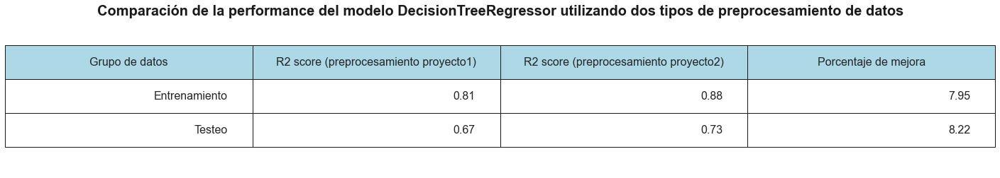

In [189]:
# Resumen de resultados PARTE A
# TABLA
import pandas as pd
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(25,4))

data=[['Entrenamiento', 0.81, 0.88, 7.95], ['Testeo', 0.67, 0.73, 8.22]
     ]
column_labels=['Grupo de datos','R2 score (preprocesamiento proyecto1)', 'R2 score (preprocesamiento proyecto2)', 'Porcentaje de mejora']
df=pd.DataFrame(data,columns=column_labels)
ax.axis('tight')
ax.axis('off')
table = ax.table(cellText=df.values,
        colLabels=df.columns,       
        colColours =["lightblue"] * 4,
        loc="center")

table.scale(1, 4)
table.set_fontsize(20)
ax.axis('off')
title = "Comparación de la performance del modelo DecisionTreeRegressor utilizando dos tipos de preprocesamiento de datos"
ax.set_title(f'{title}', weight='bold', size=20, color='k')

plt.savefig("demo_table.png", dpi=200, bbox_inches='tight')
plt.show()

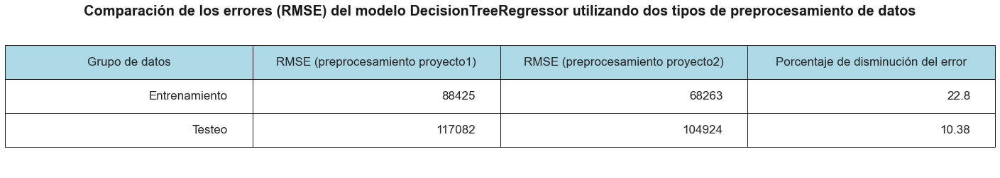

In [190]:
# Resumen de resultados PARTE A
# TABLA
import pandas as pd
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(25,4))

data=[['Entrenamiento', 88425,  68263, 22.8], ['Testeo', 117082, 104924, 10.38]
     ]
column_labels=['Grupo de datos','RMSE (preprocesamiento proyecto1)', 'RMSE (preprocesamiento proyecto2)', 'Porcentaje de disminución del error']
df=pd.DataFrame(data,columns=column_labels)
ax.axis('tight')
ax.axis('off')
table = ax.table(cellText=df.values,
        colLabels=df.columns,       
        colColours =["lightblue"] * 4,
        loc="center")

table.scale(1, 4)
table.set_fontsize(20)
ax.axis('off')
title = "Comparación de los errores (RMSE) del modelo DecisionTreeRegressor utilizando dos tipos de preprocesamiento de datos"
ax.set_title(f'{title}', weight='bold', size=20, color='k')

plt.savefig("demo_table.png", dpi=200, bbox_inches='tight')
plt.show()

### **Conclusiones Parte A**

Como podemos ver en la tabla, con el preprocesamiento realizado en el proyecto 2 se obtiene un mejor desempeño del modelo DecisionTreeRegressor, sobre todo mejora significativamente el desempeño en el grupo de testeo. Esta mejora está dada por un incremento en la información que estoy aportando al modelo, lo cual le permite hacer predicciones más acertadas basándose en información con la cual no ha sido entrenado. Esta información adicional proviene de las nuevas instancias incorporadas en el entrenamiento del modelo al recuperar las instancias con datos faltantes a través de la imputación de estos. Por otro lado, se suma otra variable, Tipo de Propiedad, la cual es categórica pero es transformada a través del encoding para que el modelo o algoritmo la pueda insterpretar.  

**RMSE**: Como habíamos visto más arriba, esta métrica da un número absoluto de cuánto se desvían los resultados previstos del número real. Como podemos ver el preprocesamiento aplicado en el proyecto 2 mejora los valores predichos por el modelo (o disminuye el error) para los grupos de entrenamiento y testeo en un 28% y 17% respectivamente. 

## **PARTE B - Modelos Avanzados**

1. Elige dos de los modelos avanzados vistos Compara con el desempeño obtenido en el proyecto 01 (en el caso de regresión, considera una regresión lineal con atributos polinómicos y regularización). Entrénalos y evalúalos con sus argumentos por defecto. No te olvides de hacer un train/test split y usar Validación Cruzada.

2. Optimiza sus hiperparámetros mediante Validación Cruzada y Grid Search o Random Search.

3. Compara el desempeño de los nuevos modelos entre sí y con el modelo de la Parte A. ¿Cuál elegirías? Justifica.

In [191]:
X = df30.drop('Precio', axis=1)
y = df30['Precio']
from sklearn import metrics
from sklearn.model_selection import train_test_split, cross_val_score
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

## **1- Comparación de modelos**

### **LinearRegression**

In [192]:
# Importamos la clase de Regresión Lineal de scikit-learn
from sklearn.linear_model import LinearRegression 
from sklearn.model_selection import cross_val_score

pipeline_lr = Pipeline(steps = [
               ('preprocessor_rl', preprocessor)
              ,('linreg',LinearRegression())
           ])

In [193]:
lr_model = pipeline_lr.fit(X_train, y_train)
print (lr_model) # Lo imprimo unavez para que se vea la secuencia del pipeline

Pipeline(steps=[('preprocessor_rl',
                 ColumnTransformer(transformers=[('numeric',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler()),
                                                                  ('imputer',
                                                                   KNNImputer(n_neighbors=2))]),
                                                  ['Latitud', 'Longitud',
                                                   'Habitaciones',
                                                   'Dormitorios', 'Baños',
                                                   'Superficie_Total',
                                                   'Superficie_cubierta']),
                                                 ('categorical',
                                                  Pipeline(steps=[('one_hot_encoder',
                                                   

In [194]:
score= cross_val_score(lr_model, X_train, y_train)
print('Mean cross-validation score: %.2f'% score.mean())

Mean cross-validation score: 0.64


In [195]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
predictions_lr_test = lr_model.predict(X_test)
print (r2_score(predictions_lr_test, y_test))

0.4392191236417574


In [196]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
predictions_lr_train = lr_model.predict(X_train)
print (r2_score(predictions_lr_train, y_train))

0.4293771476857221


In [197]:
# CALCULAMOS EL ERROR
rmse_train_rl = np.sqrt(mean_squared_error(y_train, predictions_lr_train))
rmse_test_rl = np.sqrt(mean_squared_error(y_test, predictions_lr_test))

print(f'Raíz del error cuadrático medio en Train: {rmse_train_rl}')
print(f'Raíz del error cuadrático medio en Test: {rmse_test_rl}')

Raíz del error cuadrático medio en Train: 127515.17279946816
Raíz del error cuadrático medio en Test: 129313.75382896505


### **Regresión lineal con regularización LASSO**

In [198]:
# Importamos la clase de Regresión Lineal de scikit-learn
from sklearn import linear_model
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.model_selection import cross_val_score

pipeline_lasso = Pipeline(steps = [
               ('preprocessor_pf', preprocessor)
              ,('Lasso',linear_model.Lasso())
           ])

In [199]:
lasso_model = pipeline_lasso.fit(X_train, y_train)

C:\Users\Gabriel\miniconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 66080357084876.06, tolerance: 202012931024.5593
  model = cd_fast.enet_coordinate_descent(


In [200]:
score= cross_val_score(lasso_model, X_train, y_train)
print('Mean cross-validation score: %.2f'% score.mean())

C:\Users\Gabriel\miniconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 52719096810596.75, tolerance: 160529069978.8993
  model = cd_fast.enet_coordinate_descent(
C:\Users\Gabriel\miniconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 53932048640447.125, tolerance: 162831775972.80362
  model = cd_fast.enet_coordinate_descent(
C:\Users\Gabriel\miniconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 51555870110520.5, tolerance: 158663021423.35666
  model = cd_fast.enet_coordinate_descent(
C:\Users\Gabriel\miniconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: Con

Mean cross-validation score: 0.64


In [201]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_lasso_test = lasso_model.predict(X_test)
print (r2_score(pred_lasso_test, y_test))

0.43920121399801215


In [202]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_lasso_train = lasso_model.predict(X_train)
print (r2_score(pred_lasso_train, y_train))

0.42935982249782656


In [203]:
# CALCULAMOS EL ERROR
rmse_train_lasso = np.sqrt(mean_squared_error(y_train, pred_lasso_train))
rmse_test_lasso = np.sqrt(mean_squared_error(y_test, pred_lasso_test))

print(f'Raíz del error cuadrático medio en Train: {rmse_train_lasso}')
print(f'Raíz del error cuadrático medio en Test: {rmse_test_lasso}')

Raíz del error cuadrático medio en Train: 127515.17308052098
Raíz del error cuadrático medio en Test: 129313.73559043423


### **Regresión lineal con regularización Ridge**

In [204]:
# Importamos la clase de Regresión Lineal de scikit-learn
from sklearn import linear_model
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.model_selection import cross_val_score

pipeline_ridge = Pipeline(steps = [
               ('preprocessor_rg', preprocessor)
              ,('ridge',Ridge())
           ])

In [205]:
ridge_model = pipeline_ridge.fit(X_train, y_train)

In [206]:
score= cross_val_score(ridge_model, X_train, y_train)
print('Mean cross-validation score: %.2f'% score.mean())

Mean cross-validation score: 0.64


In [207]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_ridge_test = ridge_model.predict(X_test)
print (r2_score(pred_ridge_test, y_test))

0.43919308529143897


In [208]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_ridge_train = ridge_model.predict(X_train)
print (r2_score(pred_ridge_train, y_train))

0.42934838496098116


In [209]:
# CALCULAMOS EL ERROR
rmse_train_ridge = np.sqrt(mean_squared_error(y_train, pred_ridge_train))
rmse_test_ridge = np.sqrt(mean_squared_error(y_test, pred_ridge_test))

print(f'Raíz del error cuadrático medio en Train: {rmse_train_ridge}')
print(f'Raíz del error cuadrático medio en Test: {rmse_test_ridge}')

Raíz del error cuadrático medio en Train: 127515.17352664749
Raíz del error cuadrático medio en Test: 129313.13166693447


### **Regresión lineal con atributos polinómicos**

In [210]:
# Importamos la clase de Regresión Lineal de scikit-learn
from sklearn.linear_model import LinearRegression 
# para generar características polinómicas
from sklearn.preprocessing import PolynomialFeatures 
from sklearn.model_selection import cross_val_score

pipeline_pf = Pipeline(steps = [
               ('preprocessor_pf', preprocessor)
              ,('pf', PolynomialFeatures())
              ,('linreg_pf',LinearRegression())
           ])

In [211]:
lrpf_model = pipeline_pf.fit(X_train, y_train)

In [212]:
score= cross_val_score(lrpf_model, X_train, y_train, scoring='r2')
print('Mean cross-validation score: %.2f'% score.mean())

Mean cross-validation score: 0.71


In [213]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
predictions_pf_test = lrpf_model.predict(X_test)
print (r2_score(predictions_pf_test, y_test))

0.5887168374045967


In [214]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
predictions_pf_train = lrpf_model.predict(X_train)
print (r2_score(predictions_pf_train, y_train))

0.5959144712491657


In [215]:
# CALCULAMOS EL ERROR
rmse_train_pf = np.sqrt(mean_squared_error(y_train, predictions_pf_train))
rmse_test_pf = np.sqrt(mean_squared_error(y_test, predictions_pf_test))

print(f'Raíz del error cuadrático medio en Train: {rmse_train_pf}')
print(f'Raíz del error cuadrático medio en Test: {rmse_test_pf}')

Raíz del error cuadrático medio en Train: 113458.4728056071
Raíz del error cuadrático medio en Test: 115834.21523678351


### **RandomForestRegressor**

In [216]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score

pipeline_rf = Pipeline(steps = [
               ('preprocessor_rf', preprocessor)
              ,('rf_reg',RandomForestRegressor(random_state = 42))
           ])

In [217]:
rf_model = pipeline_rf.fit(X_train, y_train)

In [218]:
#Este boque de código genera un archivo html que  abriendolo en un browser me permite ver el los pasos realizados en el pipeline en un esquema.
from sklearn.utils import estimator_html_repr
with open('rf_model_pipe.html', 'w') as f:  
    f.write(estimator_html_repr(rf_model))

In [219]:
score=cross_val_score(rf_model, X_train, y_train)
print('Mean cross-validation score: %.2f'% score.mean())

Mean cross-validation score: 0.85


In [220]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_rf_test = rf_model.predict(X_test)
print (r2_score(pred_rf_test, y_test))

0.8304427418359974


In [221]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_rf_train = rf_model.predict(X_train)
print (r2_score(pred_rf_train, y_train))

0.9748889598036274


In [222]:
# CALCULAMOS EL ERROR
rmse_train_rl = np.sqrt(mean_squared_error(y_train, pred_rf_train))
rmse_test_rl = np.sqrt(mean_squared_error(y_test, pred_rf_test))

print(f'Raíz del error cuadrático medio en Train: {rmse_train_rl}')
print(f'Raíz del error cuadrático medio en Test: {rmse_test_rl}')

Raíz del error cuadrático medio en Train: 32108.130945374018
Raíz del error cuadrático medio en Test: 82312.37969578624


### **XGBoostRegressor**


In [223]:
import xgboost; print(xgboost.__version__) #Chequeo si tengo instaladoeste algoritmo y si versión

1.3.3


In [224]:
import xgboost as xgb
from xgboost import XGBRegressor

pipeline_xg = Pipeline(steps = [
               ('preprocessor_xg', preprocessor)
              ,('xgb_reg', xgb.XGBRegressor(objective='reg:squarederror', verbosity=1))
           ])

In [225]:
xgb_model = pipeline_xg.fit(X_train, y_train)

In [226]:
#Este boque de código genera un archivo html que  abriendolo en un browser me permite ver el los pasos realizados en el pipeline en un esquema.
from sklearn.utils import estimator_html_repr
with open('xgb_model_pipe.html', 'w') as f:  
    f.write(estimator_html_repr(xgb_model))

In [227]:
score = cross_val_score(xgb_model, X_train, y_train, scoring='r2')
print('Mean cross-validation score: %.2f'% score.mean())

Mean cross-validation score: 0.84


In [228]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_xgb_test = xgb_model.predict(X_test)
print (r2_score(pred_xgb_test, y_test))

0.8047339798566745


In [229]:
print(f'\n{pred_xgb_test}')


[114504.96 170775.5  401871.62 ... 380352.3  173608.2  161773.25]


In [230]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_xgb_train = xgb_model.predict(X_train)
print (r2_score(pred_xgb_train, y_train))

0.9083143159561762


In [231]:
# CALCULAMOS EL ERROR
rmse_xgb_train = np.sqrt(mean_squared_error(y_train, pred_xgb_train))
rmse_xgb_test = np.sqrt(mean_squared_error(y_test, pred_xgb_test))

print(f'Raíz del error cuadrático medio en Train: {rmse_xgb_train}')
print(f'Raíz del error cuadrático medio en Test: {rmse_xgb_test}')

Raíz del error cuadrático medio en Train: 59732.261404489946
Raíz del error cuadrático medio en Test: 87322.98000768157


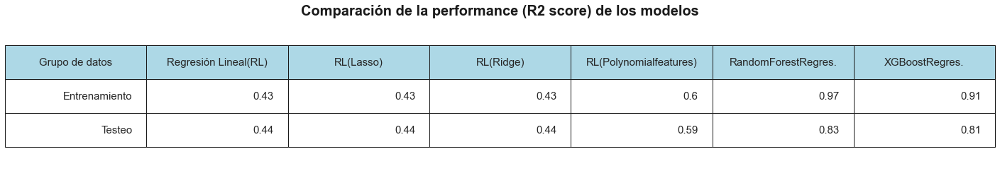

In [232]:
# Resumen de resultados PARTE A
# TABLA
import pandas as pd
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(25,4))

data=[['Entrenamiento', 0.43, 0.43, 0.43, 0.60, 0.97, 0.91], ['Testeo', 0.44, 0.44, 0.44, 0.59, 0.83, 0.81]
     ]
column_labels=['Grupo de datos','Regresión Lineal(RL)', 'RL(Lasso)', 'RL(Ridge)', 'RL(Polynomialfeatures)', 'RandomForestRegres.', 'XGBoostRegres.']
df=pd.DataFrame(data,columns=column_labels)
ax.axis('tight')
ax.axis('off')
table = ax.table(cellText=df.values,
        colLabels=df.columns,       
        colColours =["lightblue"] *7,
        loc="center")

table.scale(1, 4)
table.set_fontsize(20)
ax.axis('off')
title = "Comparación de la performance (R2 score) de los modelos"
ax.set_title(f'{title}', weight='bold', size=20, color='k')

plt.savefig("demo_table.png", dpi=200, bbox_inches='tight')
plt.show()

**Conclusión comparación de modelos en base a su R2 score** 

Como podemos ver los **modelos lineales** no predicen de manera correcta los precios de las propiedades ya que tienen un R2 más cercano a 0 que a 1. También, podríamos decir que la función de costo "óptima" , o la que mejor se ajusta a los datos, no es lineal. En este sentido, al aplicar **atributos polinómicos** el modelo mejora la performance lo que indica nuevamente que este modelo no sigue un comportamiento lineal. En el caso de la regresión lineal con atributos polinómicos, evalué varios valores del grado polinómico (degree) pero el mejor desempeño con el valor por defecto igual a 2. Por último, de los modelos de ensamble, con RandomForest se obtiene una mejor performance aunque también aumentael sobreajuste a los datos.  

Por último, podemos ver que los modelos que utilizan métodos de ensamble (RandomForestRegres. y XGBoostRegres) mejoran mucho la performance, por este motivo voy avanzar en el análsis, con estos dos algoritmos. 

En el caso particular de **RandomForestRegressor** (método bagging), la mayor ganancia sucede cuando estos modelos están sobreajustados, o, tienen varianza. En el caso de árboles, lo que buscamos es un conjunto de árboles con mucha varianza pero poco sesgo, de forma tal que cuando los combinemos (los hagamos votar) obtengamos un modelo de baja varianza y bajo sesgo. Además, recordemos que estamos aplicando los modelos sin ajustar sus parámetros, y en el caso de RandomForest el parámetro de profundidad de arbol, que es el que le otorga complejidad o simplicidad el modelo, está seteado al infinito, con lo cual es lógico que el moledo genere un sobreajuste de los datos, como sucede en este caso.  

En el caso de **XGBoostRegressor** (método de boosting), cada árbol es poco profundo, es decir, es un modelo con subajuste o sesgado, pero poca varianza. Cada iteración - entrenamiento de un nuevo árbol - produce una leve mejora, un aprendizaje; el ensamble combina modelos sesgados para obtener un modelo no sesgado. En consecuencia, tenemos un modelo que genera menos sobreajuste de los datos como se puede observar en la tabla. 

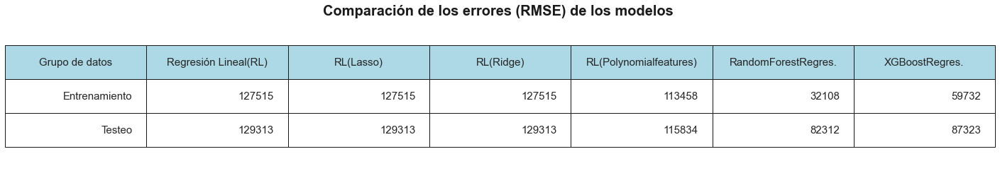

In [233]:
# Resumen de resultados PARTE A
# TABLA
import pandas as pd
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(25,4))

data=[['Entrenamiento',127515, 127515, 127515,  113458,  32108, 59732], ['Testeo',129313, 129313, 129313, 115834, 82312, 87323]
     ]

column_labels=['Grupo de datos','Regresión Lineal(RL)', 'RL(Lasso)', 'RL(Ridge)', 'RL(Polynomialfeatures)', 'RandomForestRegres.', 'XGBoostRegres.']
df=pd.DataFrame(data,columns=column_labels)
ax.axis('tight')
ax.axis('off')
table = ax.table(cellText=df.values,
        colLabels=df.columns,       
        colColours =["lightblue"] *7,
        loc="center")

table.scale(1, 4)
table.set_fontsize(20)
ax.axis('off')
title = "Comparación de los errores (RMSE) de los modelos "
ax.set_title(f'{title}', weight='bold', size=20, color='k')

plt.savefig("demo_table.png", dpi=200, bbox_inches='tight')
plt.show()

**Conclusión comparación de modelos en base al RSME** 

Como podemos observar, en los modelos de regresión lineal (RL) no hay diferencias significativas. En el caso de RL con atributos polinómicos si se observa una disminución significativa del error en ambos grupos de datos. En el caso de los modelo sde ensamble, se observa una disminución de entre el 45% y el 75% respecto a los modelos de RL. Esto confirma lo observado anteriormente al analizar el R2, la función de costo que mejor ajusta a los datos no tiene uncomportamiento lineal. En el modelo RandomForest, sin embargo, este decrecimiento es mucho más pronunciado en el grupo de entrenamiento lo que da cuenta del sobre ajuste que genera el modelo.

**Análisis de distribución de errores y gráfico de relación de valores predichos vs los reales**

Dado los que resultados en la performance de los modelos lineales RL, Lasso y Ridge es el mismo, vamos seleccionar solo uno de ellos. 

Modelo: Regresión lineal Ridge
R2 ajustado en Trained: 0.42934838496098116
R2 ajustado en Tested: 0.43919308529143897
Raíz del error cuadrático medio en Train: 127515.17352664749
Raíz del error cuadrático medio en Test: 129313.13166693447


C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


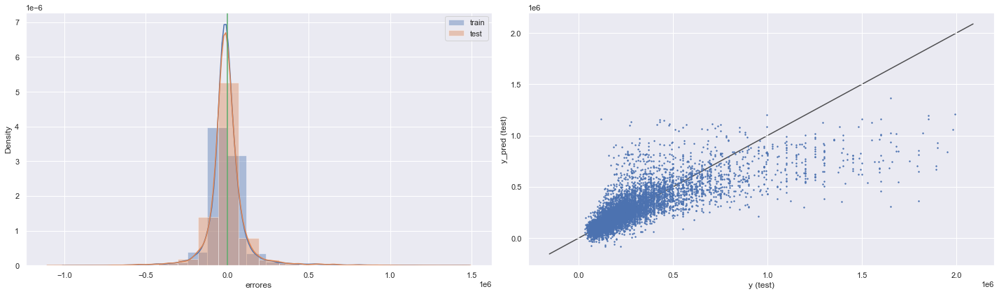

Modelo: RL con atributos polinómicos
R2 ajustado en Trained: 0.5959144712491657
R2 ajustado en Tested: 0.5887168374045967
Raíz del error cuadrático medio en Train: 113458.4728056071
Raíz del error cuadrático medio en Test: 115834.21523678351


C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


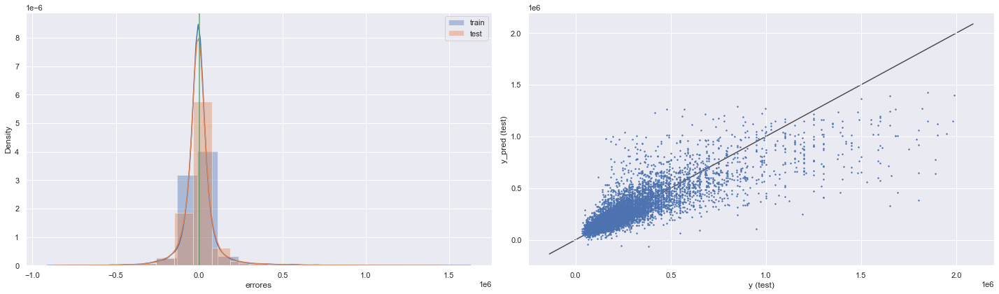

Modelo: RandomForestRegressor
R2 ajustado en Trained: 0.9748889598036274
R2 ajustado en Tested: 0.8304427418359974
Raíz del error cuadrático medio en Train: 32108.130945374018
Raíz del error cuadrático medio en Test: 82312.37969578624


C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


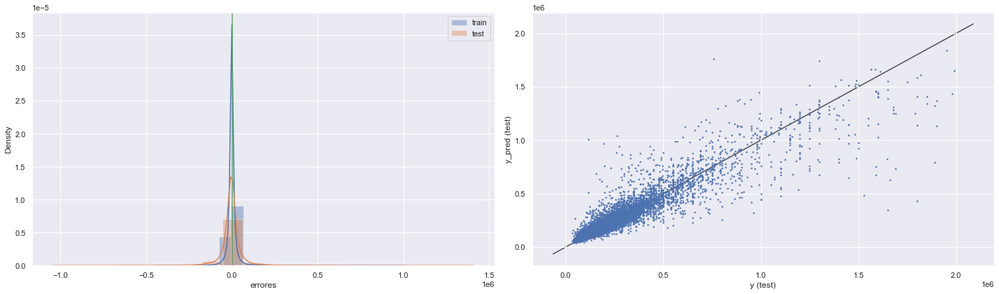

Modelo: XGBoostRegressor
R2 ajustado en Trained: 0.9083143159561762
R2 ajustado en Tested: 0.8047339798566745
Raíz del error cuadrático medio en Train: 59732.261404489946
Raíz del error cuadrático medio en Test: 87322.98000768157


C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


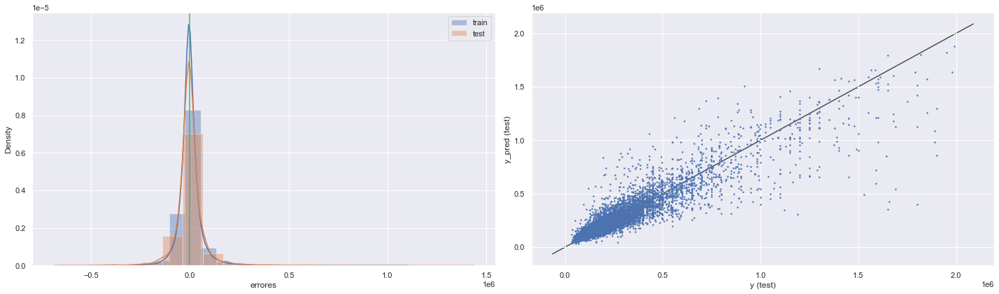

In [234]:
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

import seaborn as sns
modelos = ['Regresión lineal Ridge', 'RL con atributos polinómicos','RandomForestRegressor', 'XGBoostRegressor']

for i, model in enumerate([ridge_model, lrpf_model, rf_model, xgb_model]):
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    print(f'Modelo: {modelos[i]}')

    R2_ajustado_train = r2_score(y_train_pred, y_train)
    R2_ajustado_test = r2_score(y_test_pred, y_test)
    print(f'R2 ajustado en Trained: {R2_ajustado_train}')
    print(f'R2 ajustado en Tested: {R2_ajustado_test}')
    rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
    print(f'Raíz del error cuadrático medio en Train: {rmse_train}')
    print(f'Raíz del error cuadrático medio en Test: {rmse_test}')
    
    plt.figure(figsize = (20,6))
    
    plt.subplot(1,2,1)
    sns.distplot(y_train - y_train_pred, bins = 20, label = 'train')
    sns.distplot(y_test - y_test_pred, bins = 20, label = 'test')
    plt.axvline(0, color='g')
    plt.xlabel('errores')
    plt.legend()


    ax = plt.subplot(1,2,2)
    ax.scatter(y_test,y_test_pred, s =2)
    
    lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes]
    ]
    
    ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    plt.xlabel('y (test)')
    plt.ylabel('y_pred (test)')
    
    plt.tight_layout()
    plt.show()

**Conclusiones los modelos sin optimizar los parámetros** 

Gráfico de datos predichos versus reales: La lógica indica que si un valor predicho es igual al real se debería ubicar sobre la recta con pendiente positiva de la función identidad. Como vemos en el gráfico los tres modelos generan mejores predicciones para propiedades entre 33 mil y 1 millon de dólares, para valores superiores el modelo tiende a subestimar el precio. Esto se ve claramente en el modelo Ridge (regresión lineal con regularización). Como habíamos observado más arriba, en el tabla comparativa del desempeño de los modelos, las predicciones se acercan más a los precios reales para modelos no lineales, lo cual se confirma en este gráfico al ver como la distribución de datos predichos vs reales por arriba de 1 millon de dolares, desplazada hacia derecha en el caso de la regresión lineal, se ajusta más a la recta al aplicar atributos polinómicos y modelos e ensamble no lineales. Por último, el modelo que pareciera tener mejor desempeño es XGBoostRegressor, los datos se ajustan más a la recta, sobre todo para valores superiores a 1 millón de dolares.

Distribución de errores: Una de las cosas más importantes que puede decirnos un modelo, es qué tan seguro está en una predicción. Una respuesta a esta pregunta puede venir en forma de distribución de errores. Como podemos ver en este gráfico, el error se distribuye alrededor del cero, sin embargo, En los modelos lineales la distribución de los errores para grupos de entrenamiento y testeo es diferente.Además,  el modelo de regresión lineal con regularización Ridge presenta un leve sesgo hacia la izquierda. En el caso de los modelos de ensamble, la distribución de los errores sigue la misma distribución. Es interesante observar que la línea de distribución de los errores en el modelo RandomForestRegressor, para el grupo de testeo, es mayor en magnitud al de entrenamiento, lo cual indica un sobreajuste del modelo, coincidiendo con lo observado al analizar los resultados del R2 score.   

## **2- Optimización de modelos**

In [235]:
# Cargo las librerias e importo los modelos. 
import numpy as np
# Manipulación del dataframe
import pandas as pd
from sklearn import linear_model
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.impute import KNNImputer
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures 
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_validate
import xgboost as xgb
from xgboost import XGBRegressor
import scipy as sp
from sklearn.model_selection import RandomizedSearchCV

### **Voy a buscar los mejores hiperparámetros para los modelos con la clase de Sklearn RandomizedSearchCV**

Voy a ajustar los hiperparámetros de los modelos:

RandomForestRegressor: 
- **n_estimators:** La mayor ganancia está cuando estos modelos están sobreajustados, o, como vimos en la bitácora anterior, tienen varianza. En el caso de árboles, lo que buscamos es un conjunto de árboles con mucha varianza (Por este motivo el parametro de max_depth=none, se le asigna un número infinito) pero poco sesgo, de forma tal que cuando los combinemos (los hagamos votar) obtengamos un modelo de baja varianza y bajo sesgo. El valor por **defecto para este hiperparámetro es 100**, entonces, en para encontrar el mejor valor buscamos valores por arriba de este valor default.  
- **max_features:**  Uno de los hiperparámetros a decidir en Random Forest es cuántos atributos considerar en cada nodo. En general, en problemas de clasificación se suele utilizar la raíz cuadrada del total de atributos, y en problemas de regresión el total de atributos. Estos valores son empíricos, por lo que puede servir probar otros valores.

XGBRegressor
- **n_estimators:** El número de árboles, a diferencia de los ensambles con bagging, boosting puede sobreajustar si es muy grande, aunque este sobreajuste tiende a ocurrir lentamente. Buscando en internet encontré que se utiliza un rango de 100 a 1000. 
- **learning_rate:** Cada árbol aprende sobre los errores del anterior. Pero para eso, es necesario asignarle un peso a las instancias mal clasificadas. Existe un hiperparámetro, la tasa de aprendizaje, que controla la velocidad con que cada nuevo árbol aprende. Y, lamentablemente, existe un trade-off entre este parámetro y el número de árboles. Su valor por **defecto es 0.3**. Rango [0, 1] (de la documentación de XGBoost).
- **max_depth:** Profundidad máxima de un árbol. Es el número máximo de nodos permitidos desde la raíz hasta la hoja más lejana de un árbol. Los árboles más profundos pueden modelar relaciones más complejas añadiendo más nodos, pero a medida que profundizamos, las divisiones se vuelven menos relevantes y a veces solo se deben al ruido, causando que el modelo sobreajuste. Su valor por **defecto es 6**. Rango [0, infinito]

Los parámetros de regularización son los siguientes:

**alpha:** la regularización L1 o Lasso actua sobre los pesos de las hojas del árbol, cuanto mayor sea el valor, mayor será la regularización.  Valor por defecto es 0. Rango [0, infinito]

**lambda:** la regularización de L2 o Ridge en el peso de las hojas, es más suave que L1 y hace que el peso de las hojas disminuya suavemente, a diferencia de L1, que impone fuertes restricciones sobre el peso de las hojas.  Valor por defecto es Valor por defecto es 1. Rango [0, infinito]

**subsample**: Proporción de las instancias de entrenamiento. Establecerlo en 0.5 significa que XGBoost mostrará al azar la mitad de los datos de entrenamiento antes de crear el árboles y esto evitará el sobreajuste. El submuestreo ocurrirá una vez en cada iteración del boosting. Valor por defecto es Valor por defecto es 1. Rango [0, 1]

**colsample_bytree**: Porcentaje de variables utilizadas por árbol. Un valor elevado puede provocar un sobreajuste. Valor por defecto es 1. Rango [0, 1]

**min_split_loss(gamma)**: Mínima reducción en la función de costo que se requiere para realizar una nueva partición en un nodo hoja del árbol. Cuanto mayor sea la gamma, más conservador será el algoritmo. Valor por defecto es 0 y puede tomarvalores de cero a infinito. 

**min_child_weight**: Suma mínima de los pesos de las instancias (hessian) necesarias para generar una nueva hoja (nodo) del árbol. Cuanto más alto sea el valor de min_child_weight, más conservador será el algoritmo.Valor por defecto es 1ypuede tomar valores de 0 a infinito.

### **Optimización: RandomForestRegressor**

In [314]:
import scipy as sp
from scipy.stats import randint
param_dist_rf = {'rf_reg__n_estimators': sp.stats.randint(100,800), 'rf_reg__max_features': ['auto', 'sqrt', 'log2']}

In [315]:
hyper_rf = RandomizedSearchCV(pipeline_rf, param_dist_rf, n_iter=10, cv=5, random_state=0)

In [316]:
hyper_rf.fit(X_train, y_train)  

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preprocessor_rf',
                                              ColumnTransformer(transformers=[('numeric',
                                                                               Pipeline(steps=[('scaler',
                                                                                                StandardScaler()),
                                                                                               ('imputer',
                                                                                                KNNImputer(n_neighbors=2))]),
                                                                               ['Latitud',
                                                                                'Longitud',
                                                                                'Habitaciones',
                                                                                'Dormit

In [317]:
print('Los mejores valores para los hiperparametros del algoritmo Random Forest Regressor son:'+str(hyper_rf.best_params_)) # Estimator that was chosen by the search, i.e. estimator which gave highest score (or smallest loss if specified) on the left out data.

Los mejores valores para los hiperparametros del algoritmo Random Forest Regressor son:{'rf_reg__max_features': 'sqrt', 'rf_reg__n_estimators': 777}


In [318]:
print('El mejor Score que se obtiene a partir de estos hiperparámetros es:'+str(hyper_rf.best_score_)) # Mean cross-validated score of the best_estimator.

El mejor Score que se obtiene a partir de estos hiperparámetros es:0.857159941336864


**Evaluación del desempeño luego de la optimización**

In [319]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score

pipeline_rf_final = Pipeline(steps = [
               ('preprocessor_rf_f', preprocessor)
              ,('rf_reg_final',RandomForestRegressor(n_estimators= 777, max_features='sqrt'))
           ])

In [320]:
rf_model_final = pipeline_rf_final.fit(X_train, y_train)

In [ ]:
#Este boque de código genera un archivo html que  abriendolo en un browser me permite ver el los pasos realizados en el pipeline en un esquema.
from sklearn.utils import estimator_html_repr
with open('rf_model_pipe.html', 'w') as f:  
    f.write(estimator_html_repr(rf_model_final))

In [ ]:
score=cross_val_score(rf_model_final, X_train, y_train)
print('Mean cross-validation score: %.2f'% score.mean())

Mean cross-validation score: 0.86


In [ ]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_rf_test_final = rf_model_final.predict(X_test)
print (r2_score(pred_rf_test_final, y_test))

0.8330213052206488


In [ ]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_rf_train_final = rf_model_final.predict(X_train)
print (r2_score(pred_rf_train_final, y_train))

0.9760278590552037


In [ ]:
# CALCULAMOS EL ERROR
rmse_xgb_train = np.sqrt(mean_squared_error(y_train, pred_rf_train_final))
rmse_xgb_test = np.sqrt(mean_squared_error(y_test, pred_rf_test_final))

print(f'Raíz del error cuadrático medio en Train: {rmse_xgb_train}')
print(f'Raíz del error cuadrático medio en Test: {rmse_xgb_test}')

Raíz del error cuadrático medio en Train: 31187.288757525967
Raíz del error cuadrático medio en Test: 80086.32309359107


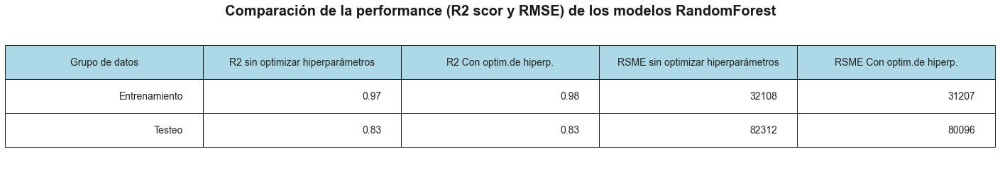

In [ ]:
# Resumen de resultados PARTE A
# TABLA
import pandas as pd
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(25,4))

data=[['Entrenamiento', 0.97, 0.98, 32108, 31207], ['Testeo', 0.83, 0.83, 82312, 80096]
     ]
column_labels=['Grupo de datos','R2 sin optimizar hiperparámetros', 'R2 Con optim.de hiperp.', 'RSME sin optimizar hiperparámetros', 'RSME Con optim.de hiperp.']
df=pd.DataFrame(data,columns=column_labels)
ax.axis('tight')
ax.axis('off')
table = ax.table(cellText=df.values,
        colLabels=df.columns,       
        colColours =["lightblue"] *7,
        loc="center")

table.scale(1, 4)
table.set_fontsize(20)
ax.axis('off')
title = "Comparación de la performance (R2 scor y RMSE) de los modelos RandomForest"
ax.set_title(f'{title}', weight='bold', size=20, color='k')

plt.savefig("demo_table.png", dpi=200, bbox_inches='tight')
plt.show()

**Conclusión comparación de modelos RandomForest en base a su R2 score y RMSE** 

Como podemos ver, el algoritmo no presenta una mejora significativa en su performance al optimizar sus hiperparámetros. Por otro lado, aumenta el sobreajuste en el grupo de entrenamiento, esto se puede apreciar en el incremento del R2 solo en el grupo de entrenamiento después de optimizar hiperparámetros. Por otro lado, la optimización de hiperparámetros tiene un tiempo de cómputo de más de 30 min. Por este motivo, el mejor modelo es RandomForest sin optimizar hiperparámetros. 

### **Optimización: XGBoostRegressor**


In [ ]:
import scipy as sp
from scipy.stats import uniform, randint
param_dist_xgb = { 
          'xgb_reg__n_estimators': sp.stats.randint(100, 600),
          'xgb_reg__learning_rate': uniform(0.05, 0.399),
          'xgb_reg__max_depth': sp.stats.randint(2, 20),
          'xgb_reg__reg_lambda': uniform(1.0, 9.5),
          'xgb_reg__reg_alpha': uniform(0.0, 9.5),
          'xgb_reg__colsample_bytree': uniform(0.0, 1.0),
          'xgb_reg__subsample': uniform(0.0, 1.0),
          'xgb_reg__min_split_loss': uniform(0.0, 0.9),
          'xgb_reg__min_child_weight':sp.stats.randint(1, 10)
}

In [ ]:
hyper_xgb = RandomizedSearchCV(pipeline_xg, cv=5, n_iter=10, param_distributions=param_dist_xgb, random_state=0)

In [ ]:
hyper_xgb.fit(X_train, y_train)  

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preprocessor_xg',
                                              ColumnTransformer(transformers=[('numeric',
                                                                               Pipeline(steps=[('scaler',
                                                                                                StandardScaler()),
                                                                                               ('imputer',
                                                                                                KNNImputer(n_neighbors=2))]),
                                                                               ['Latitud',
                                                                                'Longitud',
                                                                                'Habitaciones',
                                                                                'Dormit

In [ ]:
print('Los mejores valores para los hiperparametros del algoritmo XGBoostRegressor son:'+str(hyper_xgb.best_params_)) # Estimator that was chosen by the search, i.e. estimator which gave highest score (or smallest loss if specified) on the left out data.

Los mejores valores para los hiperparametros del algoritmo XGBoostRegressor son:{'xgb_reg__colsample_bytree': 0.6481718720511972, 'xgb_reg__learning_rate': 0.19692837439637867, 'xgb_reg__max_depth': 7, 'xgb_reg__min_child_weight': 1, 'xgb_reg__min_split_loss': 0.8807565080094876, 'xgb_reg__n_estimators': 572, 'xgb_reg__reg_alpha': 7.60865214380662, 'xgb_reg__reg_lambda': 5.944536055736446, 'xgb_reg__subsample': 0.6788795301189603}


In [ ]:
print('El mejor Score que se obtiene a partir de estos hiperparámetros es:'+str(hyper_xgb.best_score_)) # Mean cross-validated score of the best_estimator.

El mejor Score que se obtiene a partir de estos hiperparámetros es:0.856133637493258


In [ ]:
hyper_xgb.best_estimator_

Pipeline(steps=[('preprocessor_xg',
                 ColumnTransformer(transformers=[('numeric',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler()),
                                                                  ('imputer',
                                                                   KNNImputer(n_neighbors=2))]),
                                                  ['Latitud', 'Longitud',
                                                   'Habitaciones',
                                                   'Dormitorios', 'Baños',
                                                   'Superficie_Total',
                                                   'Superficie_cubierta']),
                                                 ('categorical',
                                                  Pipeline(steps=[('one_hot_encoder',
                                                   

**Evaluación del desempeño luego de la optimización**

In [ ]:
import xgboost as xgb
from xgboost import XGBRegressor

pipeline_xg_final= Pipeline(steps = [
               ('preprocessor_xg_f', preprocessor)
              ,('xgb_reg_f', xgb.XGBRegressor(objective='reg:squarederror', learning_rate= 0.197, max_depth= 7, n_estimators= 572,min_child_weight= 1, colsample_bytree= 0.648,
                                            min_split_loss=0.881, reg_alpha=7.609, reg_lambda=5.944, subsample=0.679, verbosity=1))])

In [ ]:
xgb_model_final= pipeline_xg_final.fit(X_train, y_train)

In [ ]:
#Este boque de código genera un archivo html que  abriendolo en un browser me permite ver el los pasos realizados en el pipeline en un esquema.
from sklearn.utils import estimator_html_repr
with open('xgb_model_pipe.html', 'w') as f:  
    f.write(estimator_html_repr(xgb_model_final))

In [ ]:
score = cross_val_score(xgb_model_final, X_train, y_train, scoring='r2')
print('Mean cross-validation score: %.2f'% score.mean())

Mean cross-validation score: 0.86


In [ ]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_xgb_test_final = xgb_model_final.predict(X_test)
print (r2_score(pred_xgb_test_final, y_test))

0.835744571686394


In [ ]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_xgb_train_final = xgb_model_final.predict(X_train)
print (r2_score(pred_xgb_train_final, y_train))

0.9686435694345342


In [ ]:
# CALCULAMOS EL ERROR
rmse_train_final = np.sqrt(mean_squared_error(y_train, pred_xgb_train_final))
rmse_test_final = np.sqrt(mean_squared_error(y_test, pred_xgb_test_final))

print(f'Raíz del error cuadrático medio en Train: {rmse_train_final}')
print(f'Raíz del error cuadrático medio en Test: {rmse_test_final}')

Raíz del error cuadrático medio en Train: 36245.35323096523
Raíz del error cuadrático medio en Test: 81246.3445916944


**Optimización en la estructura de datos**

Matriz de datos utilizada en XGBoost.

DMatrix es una estructura de datos interna que utiliza XGBoost, que está optimizada tanto para la eficiencia de la memoria como para la velocidad de entrenamiento. Se puede construir DMatrix a partir de múltiples fuentes de datos diferentes. Para utilizar esta estructura de datos debo primero transformar las variables categóricas. 

In [ ]:
dummy=pd.get_dummies(df30[["Tipo_de_propiedad"]])
df_new=pd.concat([df30, dummy], axis=1)

In [ ]:
df_new.head()

,Latitud,Longitud,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio,Tipo_de_propiedad,Tipo_de_propiedad_Casa,Tipo_de_propiedad_Departamento,Tipo_de_propiedad_PH
1,-34.624056,-58.412110,2.0,1.0,2.0,70.0,58.0,159000.0,PH,0,0,1
2,-34.593569,-58.427474,2.0,1.0,1.0,45.0,45.0,125000.0,PH,0,0,1
3,-34.581294,-58.436754,2.0,1.0,1.0,85.0,50.0,295000.0,PH,0,0,1
5,-34.593779,-58.441239,2.0,1.0,1.0,56.0,56.0,150000.0,PH,0,0,1
6,-34.600988,-58.433061,2.0,1.0,1.0,70.0,70.0,159500.0,PH,0,0,1


In [ ]:
df32= df_new.drop(['Tipo_de_propiedad'], axis=1)
df32.head()

,Latitud,Longitud,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio,Tipo_de_propiedad_Casa,Tipo_de_propiedad_Departamento,Tipo_de_propiedad_PH
1,-34.624056,-58.412110,2.0,1.0,2.0,70.0,58.0,159000.0,0,0,1
2,-34.593569,-58.427474,2.0,1.0,1.0,45.0,45.0,125000.0,0,0,1
3,-34.581294,-58.436754,2.0,1.0,1.0,85.0,50.0,295000.0,0,0,1
5,-34.593779,-58.441239,2.0,1.0,1.0,56.0,56.0,150000.0,0,0,1
6,-34.600988,-58.433061,2.0,1.0,1.0,70.0,70.0,159500.0,0,0,1


In [ ]:
X2 = df32.drop('Precio', axis=1)
y2 = df32['Precio']

In [ ]:
data_dmatrix = xgb.DMatrix(data=X2,label=y2)

In [ ]:
from sklearn.model_selection import train_test_split
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X2, y2, test_size=0.2, random_state=0)

In [ ]:
X_train_1.head()

,Latitud,Longitud,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Tipo_de_propiedad_Casa,Tipo_de_propiedad_Departamento,Tipo_de_propiedad_PH
91862,-34.639677,-58.369328,1.0,1.0,1.0,87.0,79.0,0,1,0
11083,-34.567787,-58.448913,3.0,2.0,2.0,117.0,102.0,0,1,0
96809,-34.624824,-58.424572,3.0,2.0,2.0,NaN,NaN,0,1,0
21053,-34.592041,-58.397502,2.0,1.0,1.0,32.0,32.0,0,1,0
10235,-34.595647,-58.441040,4.0,3.0,2.0,132.0,84.0,0,1,0


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

numeric_transformer_1 = Pipeline(steps=[('scaler', StandardScaler()),
    ('imputer', KNNImputer(n_neighbors=2,weights='uniform', metric='nan_euclidean'))
   ])

In [ ]:
numeric_features_1 = ['Latitud','Longitud','Habitaciones','Dormitorios','Baños','Superficie_Total','Superficie_cubierta', 'Tipo_de_propiedad_Departamento', 'Tipo_de_propiedad_PH']
from sklearn.compose import ColumnTransformer
preprocessor_1 = ColumnTransformer(
   transformers=[
    ('numeric', numeric_transformer_1, numeric_features_1)]) 

In [ ]:
import xgboost as xgb
from xgboost import XGBRegressor

pipeline_xg_final_1= Pipeline(steps = [
               ('preprocessor_xg_1', preprocessor_1)
              ,('xgb_reg_1', xgb.XGBRegressor(objective='reg:squarederror', learning_rate= 0.197, max_depth= 7, n_estimators= 572,min_child_weight= 1, colsample_bytree= 0.648,
                                            min_split_loss=0.881, reg_alpha=7.609, reg_lambda=5.944, subsample=0.679, verbosity=1))])

In [ ]:
xgb_model_final_1= pipeline_xg_final_1.fit(X_train_1, y_train_1)

In [ ]:
#Este boque de código genera un archivo html que  abriendolo en un browser me permite ver el los pasos realizados en el pipeline en un esquema.
from sklearn.utils import estimator_html_repr
with open('xgb_model_pipe.html', 'w') as f:  
    f.write(estimator_html_repr(xgb_model_final_1))

In [ ]:
score = cross_val_score(xgb_model_final_1, X_train_1, y_train_1, scoring='r2')
print('Mean cross-validation score: %.2f'% score.mean())

Mean cross-validation score: 0.86


In [ ]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_xgb_test_final_1 = xgb_model_final_1.predict(X_test_1)
print (r2_score(pred_xgb_test_final_1, y_test_1))

0.8491498626712941


In [ ]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_xgb_train_final_1 = xgb_model_final_1.predict(X_train_1)
print (r2_score(pred_xgb_train_final_1, y_train_1))

0.9665750740777849


In [ ]:
# CALCULAMOS EL ERROR
rmse_train_final_1 = np.sqrt(mean_squared_error(y_train_1, pred_xgb_train_final_1))
rmse_test_final_1 = np.sqrt(mean_squared_error(y_test_1, pred_xgb_test_final_1))

print(f'Raíz del error cuadrático medio en Train: {rmse_train_final_1}')
print(f'Raíz del error cuadrático medio en Test: {rmse_test_final_1}')

Raíz del error cuadrático medio en Train: 37380.40579026984
Raíz del error cuadrático medio en Test: 78415.50460913556


**RESUMEN DE RESULTADOS PARA EL MODELO XGBRegressor**

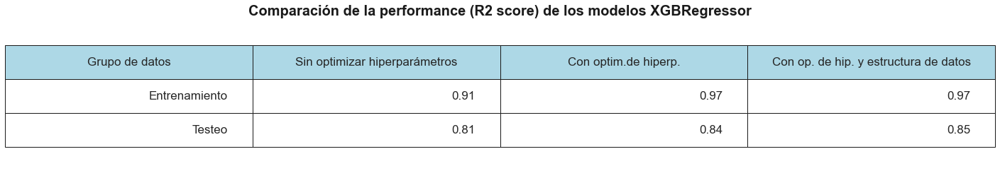

In [ ]:
# Resumen de resultados PARTE A
# TABLA
import pandas as pd
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(25,4))

data=[['Entrenamiento', 0.91, 0.97, 0.97], ['Testeo', 0.81, 0.84, 0.85]
     ]
column_labels=['Grupo de datos','Sin optimizar hiperparámetros', 'Con optim.de hiperp.', 'Con op. de hip. y estructura de datos']
df=pd.DataFrame(data,columns=column_labels)
ax.axis('tight')
ax.axis('off')
table = ax.table(cellText=df.values,
        colLabels=df.columns,       
        colColours =["lightblue"] *7,
        loc="center")

table.scale(1, 4)
table.set_fontsize(20)
ax.axis('off')
title = "Comparación de la performance (R2 score) de los modelos XGBRegressor"
ax.set_title(f'{title}', weight='bold', size=20, color='k')

plt.savefig("demo_table.png", dpi=200, bbox_inches='tight')
plt.show()

**Conclusión comparación de modelos XGRegressor en base a su R2 score** 

Como podemos ver, el algoritmo mejora su performance al optimizar sus hiperparámetros. Sin embargo, aumenta el sobreajuste en el grupo de entrenamiento, esto se puede apreciar al realizar resta en del R2 de ambos grupos antes y después de optimizar hiperparámetros. La mejora en el grupo de testeo es de apenas un 3.6% y el tiempo de cómputo, para la optimización de hiperparámetros,es de más de una hora. Al aplicar la transformación en la estructura con DMatrix mejora la performance en el grupo de Testeo un 4.7% respecto al modelo sin optimizar hiperparámetros y un 1.2% respecto al modelo con los hiperparámetros optimizados. Por lo mencionado anteriormente el mejor modelo es el XGBRegressor sin optimizar hiperparámetros. 

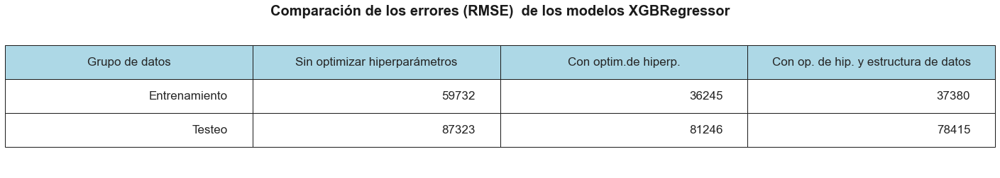

In [ ]:
# Resumen de resultados PARTE A
# TABLA
import pandas as pd
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(25,4))

data=[['Entrenamiento',59732, 36245, 37380], ['Testeo', 87323, 81246, 78415]
     ]

column_labels=['Grupo de datos','Sin optimizar hiperparámetros', 'Con optim.de hiperp.', 'Con op. de hip. y estructura de datos']
df=pd.DataFrame(data,columns=column_labels)
ax.axis('tight')
ax.axis('off')
table = ax.table(cellText=df.values,
        colLabels=df.columns,       
        colColours =["lightblue"] *7,
        loc="center")

table.scale(1, 4)
table.set_fontsize(20)
ax.axis('off')
title = "Comparación de los errores (RMSE)  de los modelos XGBRegressor"
ax.set_title(f'{title}', weight='bold', size=20, color='k')

plt.savefig("demo_table.png", dpi=200, bbox_inches='tight')
plt.show()

**Conclusión comparación de modelos XGRegressor en base al RMSE** 

Como podemos ver, al analizar el desempeño de los algoritmos a través de los errores (RMSE) podemos observar el mismo comportamiento que se muestra con la métrica R2. En este caso es mucho más evidente en magnitud. Inclusive hasta es más claro en el caso del cambio en la estructura de datos, en el grupo de entrenamiento para la métrica R2 no se percibía la caida en el desempeño. Como podmeos ver el modelo XGBRegressor sin optimizar hiperparámetros generaliza mejor que los otros modelos.   

**RandomForestRegressor: Optimización manual**

In [ ]:
lista_RMSE_train = []
lista_RMSE_test = []

# Lista de valores de max_depth que vamos a explorar
n_estimator = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 100, 120, 130, 150, 200]

# Loop sobre los distintos valores de profundidad 
for n_estimators in n_estimator:
    
    # Se repite el siguiente bloque de código
    
    # Defino el modelo con el valor de profundidad
    clf = Pipeline(steps = [
               ('preprocessor_estim', preprocessor)
              ,('rf_reg_estim',RandomForestRegressor(n_estimators= n_estimators))
           ])
    
    # Entreno el modelo
    clf.fit(X_train,y_train)
    
    # Predigo y evaluo sobre el set de entrenamiento
    y_train_pred = clf.predict(X_train)
    train_acc = np.sqrt(metrics.mean_squared_error(y_train,  y_train_pred))
    
    # Predigo y evaluo sobre el set de evaluación
    y_test_pred = clf.predict(X_test)
    test_acc = np.sqrt(metrics.mean_squared_error(y_test, y_test_pred))
    
    # Agrego la información a las listas
    lista_RMSE_train.append(train_acc)
    lista_RMSE_test.append(test_acc)
    
plt.figure(figsize=(15,10))
plt.plot(n_estimator,lista_RMSE_train,'o-',label='train' )
plt.plot(n_estimator,lista_RMSE_test,'o-',label='test')
plt.legend()
plt.xlabel('Número de estimadores')
plt.ylabel('RMSE')

KeyboardInterrupt: 

Como podemos ver hay un mínimo del RMSE para el grupo de testeo con un número de estimadores igual a 60, si embargo, no es un mínimo para el grupo de entrenamiento, lo cual indica que es un punto donde se reduce el sobreajuste a los datos.  

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score

pipeline_op = Pipeline(steps = [
               ('preprocessor_op', preprocessor)
              ,('rf_reg_op',RandomForestRegressor(n_estimators= 60, random_state = 42))
           ])

In [ ]:
rf_model_op = pipeline_op.fit(X_train, y_train)

In [ ]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_op_train = rf_model_op.predict(X_train)
pred_op_test = rf_model_op.predict(X_test)
print('R2_score Train set', r2_score(pred_op_train, y_train))
print('R2_score Test set', r2_score(pred_op_test, y_test))

In [ ]:
# CALCULAMOS EL ERROR
rmse_op_train = np.sqrt(mean_squared_error(y_train, pred_op_train))
rmse_op_test = np.sqrt(mean_squared_error(y_test, pred_op_test))

print(f'Raíz del error cuadrático medio en Train: {rmse_op_train}')
print(f'Raíz del error cuadrático medio en Test: {rmse_op_test}')

**El resultado en el desempeño no es diferente al que se obtiene con los hiperparámetros por defecto**

**Si bien el algoritmo RandomForest se caracteriza por generar modelos o árboles con mucha varianza, para luego agregarlos en un modelo de ensamble con poca varianza y poco sesgo, y el hiperparámetro Max_depth se deja que tome valores al infinito, en este caso voy a evaluar si encuentro un valor de Max_depth que me reduzca el sobreajuste que ya tiene el modelo.**

In [ ]:
lista_RMSE_train = []
lista_RMSE_test = []

# Lista de valores de max_depth que vamos a explorar
max_depths = [2, 3, 5, 7, 10, 15, 20, 25, 30, 35, 40, 45, 50, 100]

# Loop sobre los distintos valores de profundidad 
for max_depth in max_depths:
    
    # Se repite el siguiente bloque de código
    
    # Defino el modelo con el valor de profundidad
    clf = Pipeline(steps = [
               ('preprocessor_estim', preprocessor)
              ,('rf_reg_estim',RandomForestRegressor(n_estimators= 60, max_depth=max_depth))
           ])
    
    # Entreno el modelo
    clf.fit(X_train,y_train)
    
    # Predigo y evaluo sobre el set de entrenamiento
    y_train_pred = clf.predict(X_train)
    train_acc = np.sqrt(metrics.mean_squared_error(y_train,  y_train_pred))
    
    # Predigo y evaluo sobre el set de evaluación
    y_test_pred = clf.predict(X_test)
    test_acc = np.sqrt(metrics.mean_squared_error(y_test, y_test_pred))
    
    # Agrego la información a las listas
    lista_RMSE_train.append(train_acc)
    lista_RMSE_test.append(test_acc)
    
plt.figure(figsize=(15,10))
plt.plot(max_depths,lista_RMSE_train,'o-',label='train' )
plt.plot(max_depths,lista_RMSE_test,'o-',label='test')
plt.legend()
plt.xlabel('Número de estimadores')
plt.ylabel('RMSE')

**Como podemos ver, para una profundidad de árbol igual a 20 el grupo de testeo llega aun mínimo y es el punto donde más se acerca la grupo de entrenamiento**

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score

pipeline_op_1 = Pipeline(steps = [
               ('preprocessor_op_1', preprocessor)
              ,('rf_reg_op_1',RandomForestRegressor(n_estimators= 60,  max_depth=20, random_state = 42))
           ])

In [ ]:
rf_model_op_1 = pipeline_op_1.fit(X_train, y_train)

In [ ]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_op_train_1 = rf_model_op_1.predict(X_train)
pred_op_test_1 = rf_model_op_1.predict(X_test)
print('R2_score Train set', r2_score(pred_op_train_1, y_train))
print('R2_score Test set', r2_score(pred_op_test_1, y_test))

In [ ]:
# CALCULAMOS EL ERROR
rmse_op_train_1 = np.sqrt(mean_squared_error(y_train, pred_op_train_1))
rmse_op_test_1 = np.sqrt(mean_squared_error(y_test, pred_op_test_1))

print(f'Raíz del error cuadrático medio en Train: {rmse_op_train_1}')
print(f'Raíz del error cuadrático medio en Test: {rmse_op_test_1}')

**Como podemos ver la diminución en el sobreajuste no es significativa, por este motivo, es preferible usar el hiperparámetro Max_depth al infinito, en concordancia con el concepto teórico.**

**XGBRegressor: Optimización manual**

In [ ]:
lista_RMSE_train = []
lista_RMSE_test = []

# Lista de valores de max_depth que vamos a explorar
n_estimator = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 100, 120, 130, 150, 200]

# Loop sobre los distintos valores de profundidad 
for n_estimators in n_estimator:
    
    # Se repite el siguiente bloque de código
    
    # Defino el modelo con el valor de profundidad
    clf = Pipeline(steps = [
               ('preprocessor_estim', preprocessor)
              ,('rf_reg_estim',xgb.XGBRegressor(objective='reg:squarederror', n_estimators= n_estimators))])
    
    # Entreno el modelo
    clf.fit(X_train,y_train)
    
    # Predigo y evaluo sobre el set de entrenamiento
    y_train_pred = clf.predict(X_train)
    train_acc = np.sqrt(metrics.mean_squared_error(y_train,  y_train_pred))
    
    # Predigo y evaluo sobre el set de evaluación
    y_test_pred = clf.predict(X_test)
    test_acc = np.sqrt(metrics.mean_squared_error(y_test, y_test_pred))
    
    # Agrego la información a las listas
    lista_RMSE_train.append(train_acc)
    lista_RMSE_test.append(test_acc)
    
plt.figure(figsize=(15,10))
plt.plot(n_estimator,lista_RMSE_train,'o-',label='train' )
plt.plot(n_estimator,lista_RMSE_test,'o-',label='test')
plt.legend()
plt.xlabel('Número de estimadores')
plt.ylabel('RMSE')

In [ ]:
import xgboost as xgb
from xgboost import XGBRegressor

pipe_xg_op = Pipeline(steps = [
               ('preprocessor_xg_op', preprocessor)
              ,('xgb_reg_op', xgb.XGBRegressor(objective='reg:squarederror', n_estimators=75))
           ])

In [ ]:
xgb_model_op = pipe_xg_op.fit(X_train, y_train)

In [ ]:
score = cross_val_score(xgb_model_op, X_train, y_train, scoring='r2')
print('Mean cross-validation score: %.2f'% score.mean())

In [ ]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_op_train_xgb = xgb_model_op.predict(X_train)
pred_op_test_xgb = xgb_model_op.predict(X_test)
print('R2_score Train set', r2_score(pred_op_train_xgb, y_train))
print('R2_score Test set', r2_score(pred_op_test_xgb, y_test))

In [ ]:
# CALCULAMOS EL ERROR
rmse_op_train_xgb = np.sqrt(mean_squared_error(y_train, pred_op_train_xgb))
rmse_op_test_xgb= np.sqrt(mean_squared_error(y_test, pred_op_test_xgb))

print(f'Raíz del error cuadrático medio en Train: {rmse_op_train_xgb}')
print(f'Raíz del error cuadrático medio en Test: {rmse_op_test_xgb}')

**Por lo que podemos ver el mejor número de estimadores es 75, con este número obtengo el máximo desempeño y menor sobreajuste al grupo de entrenamiento, mejorando el resultado con los hiperparámetros por defecto (n_estimators=100)**

**Ahora veamos que sucede con el parámetro Max_depth**

In [ ]:
lista_RMSE_train = []
lista_RMSE_test = []

# Lista de valores de max_depth que vamos a explorar
max_depths = [2, 3, 5, 7, 10, 15, 20, 25, 30, 35, 40, 45, 50, 100]

# Loop sobre los distintos valores de profundidad 
for max_depth in max_depths:
    
    # Se repite el siguiente bloque de código
    
    # Defino el modelo con el valor de profundidad
    clf = Pipeline(steps = [
               ('preprocessor_estim', preprocessor)
              ,('xgb_reg_2_depth', xgb.XGBRegressor(objective='reg:squarederror', n_estimators=75, max_depth=max_depth))
           ])
    
    # Entreno el modelo
    clf.fit(X_train,y_train)
    
    # Predigo y evaluo sobre el set de entrenamiento
    y_train_pred = clf.predict(X_train)
    train_acc = np.sqrt(metrics.mean_squared_error(y_train,  y_train_pred))
    
    # Predigo y evaluo sobre el set de evaluación
    y_test_pred = clf.predict(X_test)
    test_acc = np.sqrt(metrics.mean_squared_error(y_test, y_test_pred))
    
    # Agrego la información a las listas
    lista_RMSE_train.append(train_acc)
    lista_RMSE_test.append(test_acc)
    
plt.figure(figsize=(15,10))
plt.plot(max_depths,lista_RMSE_train,'o-',label='train' )
plt.plot(max_depths,lista_RMSE_test,'o-',label='test')
plt.legend()
plt.xlabel('Número de estimadores')
plt.ylabel('RMSE')

**Por lo que podemos ver en el gráfico, el grupo de testeo alcanza un mínimo en el RMSE a una profundidad de árbol igual a 15, de esta manera obtengo el máximo desempeño y menor sobreajuste al grupo de entrenamiento. Ahora veamos que ocurre con el desempeño del modelo usando este hiperparámetro**

In [ ]:
import xgboost as xgb
from xgboost import XGBRegressor

pipe_xg_op_1 = Pipeline(steps = [
               ('preprocessor_xg_op', preprocessor)
              ,('xgb_reg_op_1', xgb.XGBRegressor(objective='reg:squarederror', n_estimators=75, max_depth=15, verbosity=1))
           ])

In [ ]:
xgb_model_op_1 = pipe_xg_op_1.fit(X_train, y_train)

In [ ]:
score = cross_val_score(xgb_model_op_1, X_train, y_train, scoring='r2')
print('Mean cross-validation score: %.2f'% score.mean())

In [ ]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_op_train_xgb_1 = xgb_model_op_1.predict(X_train)
pred_op_test_xgb_1 = xgb_model_op_1.predict(X_test)
print('R2_score Train set', r2_score(pred_op_train_xgb_1, y_train))
print('R2_score Test set', r2_score(pred_op_test_xgb_1, y_test))

In [ ]:
# CALCULAMOS EL ERROR
rmse_op_train_xgb_1 = np.sqrt(mean_squared_error(y_train, pred_op_train_xgb_1))
rmse_op_test_xgb_1= np.sqrt(mean_squared_error(y_test, pred_op_test_xgb_1))

print(f'Raíz del error cuadrático medio en Train: {rmse_op_train_xgb_1}')
print(f'Raíz del error cuadrático medio en Test: {rmse_op_test_xgb_1}')

**Como podemos ver, se incrementa mucho el sobreajuste a los datos de entrenamiento y el incremento en el desempeño del grupo de testeo no es proporcional. Por este motivo el mejor modelo es XGBregressor con n_estimators= 75 y el resto de los parámetros por defecto.**

### 3. Desempeño de los nuevos modelos entre sí y con el modelo de la Parte A. ¿Cuál elegirías? Justifica.

In [ ]:
# Resumen de resultados PARTE A
# TABLA
import pandas as pd
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(25,4))

data=[['Entrenamiento', 0.88, 0.97, 0.89, 68263, 32108, 64379], ['Testeo', 0.73, 0.83, 0.80, 104924, 82312, 88951]
     ]
column_labels=['Grupo de datos','R2 DecisionTreeRegressor', 'R2 RandomForest', 'R2 XGBRegressor', 'RMSE DecisionTreeRegressor', 'RMSE RandomForest', 'RMSE XGBRegressor']
df=pd.DataFrame(data,columns=column_labels)
ax.axis('tight')
ax.axis('off')
table = ax.table(cellText=df.values,
        colLabels=df.columns,       
        colColours =["lightblue"] *7,
        loc="center")

table.scale(1.5, 5)
table.set_fontsize(100)
ax.axis('off')
title = "Comparación de la performance (R2 scor y RMSE) de los modelos seleccionados respecto al modelo del proyecto 1"
ax.set_title(f'{title}', weight='bold', size=20, color='k')

plt.savefig("demo_table.png", dpi=200, bbox_inches='tight')
plt.show

**CONCLUSIONES: Al comparar el modelo utilizado en el proyecto 1 (DecisionTreeRegressor) con los modelos avanzados (RandomForest y XGBRegressor) vemos que el modelo con mejor desempeño y menor sobreajuste a los datos de entrenamiento es el modelo XGBRegressor.**

**DISTRIBUCIÓN DE ERRORES Y GRÁFICO DE VALORES PREDICHOS VS REALES PARA LOS TRES MODELOS**

In [ ]:
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

import seaborn as sns
modelos = ['DecisionTreeRegressor','RandomForestRegressor', 'XGBoostRegressor']

for i, model in enumerate([dt_model, rf_model, xgb_model_op]):
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    print(f'Modelo: {modelos[i]}')

    R2_ajustado_train = r2_score(y_train_pred, y_train)
    R2_ajustado_test = r2_score(y_test_pred, y_test)
    print(f'R2 ajustado en Trained: {R2_ajustado_train}')
    print(f'R2 ajustado en Tested: {R2_ajustado_test}')
    rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
    print(f'Raíz del error cuadrático medio en Train: {rmse_train}')
    print(f'Raíz del error cuadrático medio en Test: {rmse_test}')
    
    plt.figure(figsize = (20,6))
    
    plt.subplot(1,2,1)
    sns.distplot(y_train - y_train_pred, bins = 20, label = 'train')
    sns.distplot(y_test - y_test_pred, bins = 20, label = 'test')
    plt.axvline(0, color='g')
    plt.xlabel('errores')
    plt.legend()


    ax = plt.subplot(1,2,2)
    ax.scatter(y_test,y_test_pred, s =2)
    
    lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes]
    ]
    
    ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    plt.xlabel('y (test)')
    plt.ylabel('y_pred (test)')
    
    plt.tight_layout()
    plt.show()

**CONCLUSIONES FINALES SOBRE EL DESEMPEÑO DE LOS MODELOS**

**ERRORES:** Una de las cosas más importantes que puede decirnos un modelo es qué tan seguro está en una predicción. Una respuesta a esta pregunta puede venir en forma de distribución de errores. Una distribución de error es una distribución de probabilidad sobre una predicción puntual que nos dice qué tan probable es cada error delta. La distribución del error puede ser tan importante como la predicción puntual.

Comparando los errores de los tres modelos vemos que le mejor modelo es el XGBRegresssor ya que, en el modelo RandomForestR. vemos que hay una mayor diferencia, en magnitud, entre los grupos de entrenamiento y testeo en el modelo RandomForestRegressor(RFR) lo que confirma el sobreajuste a los datos de entrenamiento observado anteriormente (Se observa claramente que la línea de distribución de errores para el grupo de entrenamiento está por debajo de la de testeo y más próxima a la media). Si bien ninguno de los modelos presenta una distribución normal de los errores, podríamos decir que el modelo XGBR es el que más se acerca a una distribución normal. En el caso del modelo DTR se observa una asimetría positiva lo que quiere decir que una gran parte de las predicciones estará alejadas del valor real (Como se puede ver en el gráfico de Predichos Vs Reales). 

**PREDICHOS vs REALES:** En el caso del modelo DTR se observan datos más dispersos que en los otros dos modelos, lo cual quiere decir que esos valores predichos se alejan del valor real. Comparando los modelos RFR y XBGR la disperción de los datos es muy similar, aunque se observa que en el modelo XGBRegressor los puntos están más cercanos a la función identidad, sobre todo en la parte superior. También es posible observar que, sobre todo en el modelo XGBR, que para valores inferiores a 1 millón de dólares las el modelo predice mejor(más cerca de los valores reales) y para valores superiores el modelo tiende a subestimar el precio de las propiedades.     

# **PARTE C - Interpretación de modelos**

**Antes de ver que variables fueron más importantes para predecir el precio de las propiedades con el modelo seleccionado (XGBRegressor), voy a visualizar las correlaciones de la variables independientes con la variable dependiente "precio" para tener una aproximación al resultado.**  

In [ ]:
# Importo las librerías necesarias para realizar la matriz de correlaciones y graficarla a través de un heatmap
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import numpy as np
# Realizo las correlaciones y genero una máscara para que el gráfico me muestre los datos por debajo de la diagonal. 
df30_corr = df30.corr()
np.ones_like(df30_corr, dtype=np.bool)
mask = np.triu(np.ones_like(df30_corr, dtype=np.bool))

fig, ax = plt.subplots(figsize=(10, 8))
# Creo la máscara
mask = np.triu(np.ones_like(df30_corr, dtype=np.bool))
# ajusto la máscara al dataframe
mask = mask[1:, :-1]
corr = df30_corr.iloc[1:,:-1].copy()
# Grafico la matriz de correlaciones a través de un mapa de calor
sb.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap='Blues',
           vmin=-1, vmax=1, cbar_kws={"shrink": .8})
# yticks
plt.yticks(rotation=0)
plt.show()

Las variables que más correlacionan con la variable precio son Superficie cubierta (lo cual es lógico ya que es la superficie construída), luego le sigue superficie total, Baños y Habitaciones. Esta información es importante para evaluar luego la importancia de las variables para los modelos. Sin embargo, hay que recordar que correlación no implica causalidad.

**DecisionTreeRegressor**

**Importancia de las variables para el modelo del proyecto 1. Lo utilizo como referencia para comparar con la importacia de atributos que asignan los modelos más avanzados XGBR y RFR.**

In [ ]:
importances = dt_model1.feature_importances_
columns = X_test1.columns
plt.figure(figsize = (15,5))
sns.barplot(columns, importances)
plt.title('Importancia de cada Feature', fontsize=15)
plt.show()

Como podemos ver, la importancia que le asigna el modelo DecisionTreeRegressor a las variables predictoras, con los datos del proyecto 1, es similar al nivel de correlación entre variables analizado más arriba. 

Ahora veamos que sucede con el mismo modelo (mismos hiperparámetros) y con el preprecesamiento del proyecto 2. 

In [ ]:
importances= pd.DataFrame(data=dt_model.named_steps['regressor_dt'].feature_importances_, index=features, columns=['Coeficientes'])
importances.rename(index = {"numeric__Latitud": "Latitud", "numeric__Longitud":"Longitud", 'numeric__Habitaciones':'Habitaciones', 'numeric__Dormitorios':'Dormitorios'
                    , 'numeric__Baños':'Baños', 'numeric__Superficie_Total': 'Superficie_Total', 'numeric__Superficie_cubierta':'Superficie_cubierta'
                    , 'one_hot_encoder__x0_Casa':'Casa','one_hot_encoder__x0_Departamento':'Departamento', 'one_hot_encoder__x0_PH':'PH'}, inplace = True)

importan_dt= importances.sort_values(by='Coeficientes', ascending=False)
importan_dt.reset_index(level=0, inplace=True)

In [ ]:
plt.figure(figsize=(10,8))
ax= sns.barplot(data=importan_dt, x='index', y='Coeficientes', palette='Set2')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right", size=15)
plt.title('Importancia de las variables para el modelo DecisionTreeRegressor', size=20)
plt.xlabel("Variables",size=15)
plt.ylabel("Coeficiente",size=15)
plt.tight_layout()
plt.show()

Como podemos ver, las nuevas variables incorporadas aportan información relevante para el modelo. A diferencia de lo observado en las correlaciones, las variables Longitud y Latitud, tienen una gran relevancia, lo cual es lógico, ya que la ubicación de las propiedades es un factor importante en la determinación del precio.  

**RandomForestRegressor**

In [ ]:
coef_rf= pd.DataFrame(data=rf_model.named_steps['rf_reg'].feature_importances_, index=features, columns=['Coeficientes'])
coef_rf.rename(index = {"numeric__Latitud": "Latitud", "numeric__Longitud":"Longitud", 'numeric__Habitaciones':'Habitaciones', 'numeric__Dormitorios':'Dormitorios'
                    , 'numeric__Baños':'Baños', 'numeric__Superficie_Total': 'Superficie_Total', 'numeric__Superficie_cubierta':'Superficie_cubierta'
                    ,'one_hot_encoder__x0_Casa':'Casa', 'one_hot_encoder__x0_Departamento':'Departamento', 'one_hot_encoder__x0_PH':'PH'}, inplace = True)

coef1_rf= coef_rf.sort_values(by='Coeficientes', ascending=False)
coef1_rf.reset_index(level=0, inplace=True)

In [ ]:
plt.figure(figsize=(10,8))
ax= sns.barplot(data=coef1_rf, x='index', y='Coeficientes', palette='Set2')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right", size=15)
plt.title('Importancia de las variables para el modelo RandomForestRegressor', size=20)
plt.xlabel("Variables",size=15)
plt.ylabel("Coeficiente",size=15)
plt.tight_layout()
plt.show()

Para el modelo RandomForestR. las variables predictoras más importantes son muy similares a las del modelo DecisionTreeR. a diferencia que le asigna más importancia a Superficie Total que e Departamento, sin embargo la diferencias en la importancia de estas variables parece no ser significativa.  

**XGBoostRegressor**


In [ ]:
coef_xgb= pd.DataFrame(data=xgb_model_op.named_steps['xgb_reg_op'].feature_importances_, index=features, columns=['Coeficientes'])
coef_xgb.rename(index = {"numeric__Latitud": "Latitud", "numeric__Longitud":"Longitud", 'numeric__Habitaciones':'Habitaciones', 'numeric__Dormitorios':'Dormitorios'
                    , 'numeric__Baños':'Baños', 'numeric__Superficie_Total': 'Superficie_Total', 'numeric__Superficie_cubierta':'Superficie_cubierta'
                    ,'one_hot_encoder__x0_Casa':'Casa', 'one_hot_encoder__x0_Departamento':'Departamento', 'one_hot_encoder__x0_PH':'PH'}, inplace = True)

coef1_xgb= coef_xgb.sort_values(by='Coeficientes', ascending=False)
coef1_xgb.reset_index(level=0, inplace=True)

In [ ]:
plt.figure(figsize=(10,8))
ax= sns.barplot(data=coef1_xgb, x='index', y='Coeficientes', palette='Set2')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right", size=15)
plt.title('Importancia de las variables para el modelo XGBRegressor', size=20)
plt.xlabel("Variables",size=15)
plt.ylabel("Coeficiente",size=15)
plt.tight_layout()
plt.show()

El modelo XGBR mantiene a la Superficie cubierta como la variable que mayor impacto tiene en el precio, sin embargo, a diferencia del modelo DecisionTreeRegresso(DTR) y RanDomForestRegressor (RFR), que ponen a Departamento en cuarto y quinto lugar, el modelo XGBR lo pone en segundo lugar. También, este último modelo, le asigna mayor importancia a la variable Baños. Prioriza estas dos últimas variables sobre Latitud y Longitud, lo cual es poco esperado o poco intuitivo para una persona con conocimientos básicos del mercado inmobiliario. La diferencia en los resultados para los diferentes modelos se podría atribuir, al sobreajuste a los datos de entrenamiento que generan los modelos DTR y RFR, mientras que el modelo XGBR generaliza más, lo cual se observa en una menor diferencia en el R2 del modelo para los grupos de entrenamiento y testeo. Por otro lado, también puede ser que el modelo XGBR se vea más afectado por un desbalance en las clases de la variable categórica "Tipo de propiedad". Para ver como afecta este desbalance a la asignación de importancia de las variables por parte de los modelos voy aplicar un algoritmo de oversample sobre las clases menos representadas (PH y Casa) para igualarlas a la clase más representada. 

**Resampleo de clases minoritarias de la variable categórica: Tipo de propiedad**

¿Qué podemos esperar de esta transformación de datos?

Según este artículo: https://www.analyticsvidhya.com/blog/2020/07/10-techniques-to-deal-with-class-imbalance-in-machine-learning/

Ventajas y desventajas del Oversampling

Ventajas

- A diferencia del Undersampling, este método no produce pérdida de información.
- Se obtiene un mejor desempeño que con el método de undersampling

Desventajas

- Aumenta la probabilidad de sobreajuste ya que replica los eventos de las clases minoritarias.


Veamos cuantas instancias hay en cada clase de la variable Tipo de propiedad

In [ ]:
X_train.Tipo_de_propiedad.value_counts()

Aplicamos el algoritmo de "oversample" o "upsample".

In [ ]:
from sklearn.utils import resample

# concatenate training data back together
train_data = pd.concat([X_train, y_train], axis = 1)

# separate minority and majority class
Depto = train_data[train_data.Tipo_de_propiedad=='Departamento']
PH = train_data[train_data.Tipo_de_propiedad=='PH']
Casa= train_data[train_data.Tipo_de_propiedad=='Casa']
# Unsample minority; we are oversampling the minority class to match the number of majority classs
Casa_upsampled = resample(Casa,
                           replace = True, # Sample with replacement
                           n_samples = len(Depto), # Match number in majority class
                           random_state=27)
PH_upsampled = resample(PH,
                           replace = True, # Sample with replacement
                           n_samples = len(Depto), # Match number in majority class
                           random_state=27)
# combine majority and upsampled minority
upsampled = pd.concat([Depto, Casa_upsampled, PH_upsampled])
# Now let's check the classes count
upsampled.Tipo_de_propiedad.value_counts()


In [ ]:
upsampled.shape

In [ ]:
upsampled.head()

Como podemos ver, el algoritmo incrementó las instancias de las clases PH y Casas para igualarlas a Departamento. ¿Cómo hace esto? ¿Duplica instancias? Ya habíamos eliminado las instancias duplicadas. Veamos si se generaron nuevas instancias duplicadas. 

In [ ]:
X_train.shape

In [ ]:
Instancias_duplicadas = upsampled[upsampled.duplicated()]
print('Nº de instancias duplicadas:', Instancias_duplicadas.shape) # Chequeo que ya no tengo instancias duplidadas 

Como podemos ver lo que hace el algoritmo es generar instancias duplicadas. Aunque, las instancias que se deberían haber generado en proceso de upsample serían 72001 y tenemso 73210 instancias duplicadas lo que indica que en algún paso anterior se generaron 1209 instancias duplicadas. 

Ahora veamos que sucede con la perfomance de los modelos luego de realizar esta transformación de datos y como impacta en la importancia de las variables predictoras para cada modelo. 

In [ ]:
X_train_2= upsampled.drop('Precio', axis=1)
y_train_2 = upsampled['Precio']

**DecisionTreeRegressor**

In [ ]:
from sklearn.tree import DecisionTreeRegressor
pipeline_dt = Pipeline(steps = [
               ('preprocessor_dt2', preprocessor)
              ,('regressor_dt_2', DecisionTreeRegressor(max_depth=12))
           ])

In [ ]:
dt_model_2 = pipeline_dt.fit(X_train_2, y_train_2)

In [ ]:
score=cross_val_score(dt_model_2, X_train_2, y_train_2)
print('Mean cross-validation score: %.2f'% score.mean())

In [ ]:
from sklearn.metrics import r2_score
predictions_rf1_test_2 = dt_model_2.predict(X_test)
print (r2_score(predictions_rf1_test_2, y_test))

In [ ]:
from sklearn.metrics import r2_score
predictions_rf1_train_2 = dt_model_2.predict(X_train_2)
print (r2_score(predictions_rf1_train_2, y_train_2))

In [ ]:
# CALCULAMOS EL ERROR
rmse_train_2 = np.sqrt(mean_squared_error(y_train_2, predictions_rf1_train_2))
rmse_test_2 = np.sqrt(mean_squared_error(y_test, predictions_rf1_test_2))

print(f'Raíz del error cuadrático medio en Train: {rmse_train_2}')
print(f'Raíz del error cuadrático medio en Test: {rmse_test_2}')

In [ ]:
# Resumen de resultados PARTE A
# TABLA
import pandas as pd
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(25,4))

data=[['Entrenamiento', 0.88, 0.90, 68263, 58351], ['Testeo', 0.73, 0.76, 104924, 99666]
     ]
column_labels=['Grupo de datos','R2 sin Upsample', 'R2 con Upsampling.', 'RMSE sin Upsampling', 'RMSE con Upsample']
df=pd.DataFrame(data,columns=column_labels)
ax.axis('tight')
ax.axis('off')
table = ax.table(cellText=df.values,
        colLabels=df.columns,       
        colColours =["lightblue"] *7,
        loc="center")

table.scale(1, 4)
table.set_fontsize(20)
ax.axis('off')
title = "Comparación de la performance (R2 score y RMSE) de los modelos DecisionTreeRegressor"
ax.set_title(f'{title}', weight='bold', size=20, color='k')

plt.show()

Como podemos ver, el método de Upsampling una mejora en el desempeño del modelo y genera un incrementa el sobreajuste a los datos de entrenamiento del 12.7%(cuantificado en el RMSE). 

**RandomForestRegressor**

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score

pipeline_rf_2 = Pipeline(steps = [
               ('preprocessor_rf_2', preprocessor)
              ,('rf_reg_2',RandomForestRegressor(random_state = 42))
           ])

In [ ]:
rf_model_2 = pipeline_rf_2.fit(X_train_2, y_train_2)

In [ ]:
#Este boque de código genera un archivo html que  abriendolo en un browser me permite ver el los pasos realizados en el pipeline en un esquema.
from sklearn.utils import estimator_html_repr
with open('rf_model_pipe.html', 'w') as f:  
    f.write(estimator_html_repr(rf_model))

In [ ]:
score=cross_val_score(rf_model_2, X_train_2, y_train_2)
print('Mean cross-validation score: %.2f'% score.mean())

In [ ]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_rf_test_2 = rf_model_2.predict(X_test)
print (r2_score(pred_rf_test_2, y_test))

In [ ]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_rf_train_2 = rf_model_2.predict(X_train_2)
print (r2_score(pred_rf_train_2, y_train_2))

In [ ]:
# CALCULAMOS EL ERROR
rmse_train_rl_2 = np.sqrt(mean_squared_error(y_train_2, pred_rf_train_2))
rmse_test_rl_2 = np.sqrt(mean_squared_error(y_test, pred_rf_test_2))

print(f'Raíz del error cuadrático medio en Train: {rmse_train_rl_2}')
print(f'Raíz del error cuadrático medio en Test: {rmse_test_rl_2}')

In [ ]:
# Resumen de resultados PARTE A
# TABLA
import pandas as pd
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(25,4))

data=[['Entrenamiento', 0.97, 0.98, 32108, 24364], ['Testeo', 0.83, 0.84, 82312, 79628]
     ]
column_labels=['Grupo de datos','R2 sin optimizar hiperparámetros', 'R2 con Upsample', 'RMSE sin optimizar hiperparámetros', 'RMSE con Upsample']
df=pd.DataFrame(data,columns=column_labels)
ax.axis('tight')
ax.axis('off')
table = ax.table(cellText=df.values,
        colLabels=df.columns,       
        colColours =["lightblue"] *7,
        loc="center")

table.scale(1, 4)
table.set_fontsize(20)
ax.axis('off')
title = "Comparación de la performance (R2 score y RMSE) de los modelos RandomForestRegressor"
ax.set_title(f'{title}', weight='bold', size=20, color='k')

plt.show()

Como podemos ver, el método de Upsampling una mejora en el desempeño del modelo y genera un incrementa el sobreajuste a los datos de entrenamiento del 10%(cuantificado en el RMSE). 

**XGBRegressor**

In [ ]:
import xgboost as xgb
from xgboost import XGBRegressor

pipeline_xg_2 = Pipeline(steps = [
               ('preprocessor_xg_2', preprocessor)
              ,('xgb_reg_2', xgb.XGBRegressor(objective='reg:squarederror', n_estimators=75, verbosity=1))
           ])

In [ ]:
xgb_model_2 = pipeline_xg_2.fit(X_train_2, y_train_2)

In [ ]:
score=cross_val_score(xgb_model_2, X_train_2, y_train_2)
print('Mean cross-validation score: %.2f'% score.mean())

In [ ]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_xgb_train_2 = xgb_model_2.predict(X_train_2)
pred_xgb_test_2 = xgb_model_2.predict(X_test)
print('R2_score Train set', r2_score(pred_xgb_train_2, y_train_2))
print('R2_score Test set', r2_score(pred_xgb_test_2, y_test))

In [ ]:
# CALCULAMOS EL ERROR
rmse_xgb_train_2 = np.sqrt(mean_squared_error(y_train_2, pred_xgb_train_2))
rmse_xgb_test_2 = np.sqrt(mean_squared_error(y_test, pred_xgb_test_2))

print(f'Raíz del error cuadrático medio en Train: {rmse_xgb_train_2}')
print(f'Raíz del error cuadrático medio en Test: {rmse_xgb_test_2}')

In [ ]:
# Resumen de resultados PARTE A
# TABLA
import pandas as pd
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(25,4))

data=[['Entrenamiento', 0.89, 0.90, 64379, 55672], ['Testeo', 0.80, 0.80, 88951, 86573]
     ]
column_labels=['Grupo de datos','R2 con opt. manual', 'R2 con Upsample', 'RMSE con opt. manual', 'RMSE con Upsample']
df=pd.DataFrame(data,columns=column_labels)
ax.axis('tight')
ax.axis('off')
table = ax.table(cellText=df.values,
        colLabels=df.columns,       
        colColours =["lightblue"] *7,
        loc="center")

table.scale(1, 4)
table.set_fontsize(20)
ax.axis('off')
title = "Comparación de la performance (R2 score y RMSE) de los modelos XGBRegressor"
ax.set_title(f'{title}', weight='bold', size=20, color='k')
plt.show()

Como podemos ver, el método de Upsampling mejora el desempeño del modelo y genera un incrementa el sobreajuste a los datos de entrenamiento del 25.8 %(cuantificado en el RMSE). 

**CONCLUSIÓN SOBRE EL DESEMPEÑO DE LOS MODELSO DESPUÉS DEL UPSAMPLING**: Como podemos ver el efecto del upsampling sobre el desempeño de los modelos es aumentar el sobreajuste en los datos entre un 10 y 25.8 % y el desempeño no mejora significativamente. Por lo tanto, el modelo que mantiene la mejor performance y que generaliza mejor es el modelo XGBR con parámetros por default. 

**Veamos ahora, como se comportan los modelos en la seleción de features**

**DecisionTreeRegressor**

In [ ]:
importances_2= pd.DataFrame(data=dt_model_2.named_steps['regressor_dt_2'].feature_importances_, index=features, columns=['Coeficientes'])
importances_2.rename(index = {"numeric__Latitud": "Latitud", "numeric__Longitud":"Longitud", 'numeric__Habitaciones':'Habitaciones', 'numeric__Dormitorios':'Dormitorios'
                    , 'numeric__Baños':'Baños', 'numeric__Superficie_Total': 'Superficie_Total', 'numeric__Superficie_cubierta':'Superficie_cubierta'
                    , 'one_hot_encoder__x0_Casa':'Casa','one_hot_encoder__x0_Departamento':'Departamento', 'one_hot_encoder__x0_PH':'PH'}, inplace = True)

importan_dt_2= importances_2.sort_values(by='Coeficientes', ascending=False)
importan_dt_2.reset_index(level=0, inplace=True)

In [ ]:

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(25,5))

sns.barplot(ax=ax1, data=importan_dt, x='index', y='Coeficientes', palette='Set2')
sns.barplot(ax=ax2, data=importan_dt_2, x='index', y='Coeficientes', palette='Set2')
ax1.set_title('Importancia de las variables para el modelo DecisionTreeRegressor sin upsampling', fontsize=15)
ax1.set_xlabel("Variables",fontsize=15)
ax1.set_ylabel('Coeficientes',fontsize=15)
ax1.tick_params(labelsize=12)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=40, ha="right", size=15)
ax2.set_title('Importancia de las variables para el modelo DecisionTreeRegressor con upsampling', fontsize=15)
ax2.set_xlabel("Variables",fontsize=15)
ax2.set_ylabel("Coeficientes",fontsize=15)
ax2.tick_params(labelsize=12)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=40, ha="right", size=15)
plt.show()

Como podemos ver en el gráfico, el proceso de upsampling no afecta la importancia que asigna el modelo DecisionTreeRegressor a las variables predictoras. La importancia que asigna a la variables coincide con el modelo del proyecto 1 y conlas correlaciones de variables. 

**RandomForestRegressor**

In [ ]:
coef_rf_2= pd.DataFrame(data=rf_model_2.named_steps['rf_reg_2'].feature_importances_, index=features, columns=['Coeficientes'])
coef_rf_2.rename(index = {"numeric__Latitud": "Latitud", "numeric__Longitud":"Longitud", 'numeric__Habitaciones':'Habitaciones', 'numeric__Dormitorios':'Dormitorios'
                    , 'numeric__Baños':'Baños', 'numeric__Superficie_Total': 'Superficie_Total', 'numeric__Superficie_cubierta':'Superficie_cubierta'
                    ,'one_hot_encoder__x0_Casa':'Casa', 'one_hot_encoder__x0_Departamento':'Departamento', 'one_hot_encoder__x0_PH':'PH'}, inplace = True)

coef1_rf_2= coef_rf_2.sort_values(by='Coeficientes', ascending=False)
coef1_rf_2.reset_index(level=0, inplace=True)

In [ ]:

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(25,5))

sns.barplot(ax=ax1, data=coef1_rf, x='index', y='Coeficientes', palette='Set2')
sns.barplot(ax=ax2, data=coef1_rf_2, x='index', y='Coeficientes', palette='Set2')
ax1.set_title('Importancia de las variables para el modelo RandomForestRegressor sin upsampling', fontsize=15)
ax1.set_xlabel("Variables",fontsize=15)
ax1.set_ylabel('Coeficientes',fontsize=15)
ax1.tick_params(labelsize=12)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=40, ha="right", size=15)
ax2.set_title('Importancia de las variables para el modelo RandomForestRegressor con upsampling', fontsize=15)
ax2.set_xlabel("Variables",fontsize=15)
ax2.set_ylabel("Coeficientes",fontsize=15)
ax2.tick_params(labelsize=12)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=40, ha="right", size=15)
plt.show()

En el caso del modelo RandomForestRegressor hay una variación en la selección de las variables más importantes después del Upsampling. Al igual que el modelo DecisionTreeR, el RandomForestR. le asigna mayor importancia a la Latitud (lo cual no tendría relación con el balance de las clases Tipo de propiedad, al menos directamente) lo cual tiene sentido. Si volvemos, más arriba, al scaterplot de Precios Vs Latitud/Longitud, veremos que hay una clara diferencia entre el Norte y el Sur, no siendo tan marcada la diferencia entre Este y Oeste. Por otro lado, si bien la diferencia no es significativa entre estas variables, Departamento pasa a ser más importante para el modelo que la variable Superficie Total luego de realizar el Upsampling. Las variables menos importantes tanto para el modelo DecisionTreeRegressor como para RandomForestRegressor son Casa, PH y dormitorios. Dadas las caracríticas de RandomForestR. (bagging, ensamble de árboles con mucha varianza) este modelo tiende a generar sobreajuste sobre el grupo de entrenamiento. Teniendo en cuenta esto último, es posible que la importancia que le asigna a estas variables esté directamente relacionada al sobreajuste en los datos de entrenamiento. 

**XGBRegressor**

In [ ]:
coef_xgb_2= pd.DataFrame(data=xgb_model_2.named_steps['xgb_reg_2'].feature_importances_, index=features, columns=['Coeficientes'])
coef_xgb_2.rename(index = {"numeric__Latitud": "Latitud", "numeric__Longitud":"Longitud", 'numeric__Habitaciones':'Habitaciones', 'numeric__Dormitorios':'Dormitorios'
                    , 'numeric__Baños':'Baños', 'numeric__Superficie_Total': 'Superficie_Total', 'numeric__Superficie_cubierta':'Superficie_cubierta'
                    ,'one_hot_encoder__x0_Casa':'Casa', 'one_hot_encoder__x0_Departamento':'Departamento', 'one_hot_encoder__x0_PH':'PH'}, inplace = True)

coef2_xgb= coef_xgb_2.sort_values(by='Coeficientes', ascending=False)
coef2_xgb.reset_index(level=0, inplace=True)

In [ ]:

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(25,5))

sns.barplot(ax=ax1, data=coef1_xgb, x='index', y='Coeficientes', palette='Set2')
sns.barplot(ax=ax2, data=coef2_xgb, x='index', y='Coeficientes', palette='Set2')
ax1.set_title('Importancia de las variables para el modelo XGBRegressor sin upsampling', fontsize=15)
ax1.set_xlabel("Variables",fontsize=15)
ax1.set_ylabel('Coeficientes',fontsize=15)
ax1.tick_params(labelsize=12)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=40, ha="right", size=15)
ax2.set_title('Importancia de las variables para el modelo XGBRegressor con upsampling', fontsize=15)
ax2.set_xlabel("Variables",fontsize=15)
ax2.set_ylabel("Coeficientes",fontsize=15)
ax2.tick_params(labelsize=12)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=40, ha="right", size=15)
plt.show()

En el caso del modelo XGBR, a diferencia de los modelos anteriores, vemos que le asigna mayor importancia a la clase Departamento y PH de la variable Tipo de propiedad. También, le asigna mayor importancia a la variable Baños que a Superficie Total, mientras que Dormitorios, Casa y Habitaciones, siguen siendo las variables con menor importancia para el modelo. Una gran diferencia con los otros modelos es que luego de realizar el Upsampling la varariable Superficie Cubierta pasa de un 40% a un 30% de importancia. Por otro lado, Departamento pasa del 25% al 34% y PH pasa del 3% al 7%. Las variables Dormitorios, Habitaciones y Casa adquieren mayor impotancia con XGBR comparado con los modelos anteriores. Lo que observamos es que este modelo toma información de todas las variables para hacer las predicciones. Como vimos anteriormente, es el modelo que mejor generaliza o que tiene menos varianza de los 3 modelos analizados. Este puede ser el motivo de la diferencia en la elección de las variables más importantes. Osea que, al tomar más información de la variable Tipo de propiedad y de todas las variables en general le permite bajar la varianza en sus predicciones. Sin embargo, al realizar Upsampling el efecto observado es que se incrementa el sobreajuste al grupo de entrenamiento. Por este motivo, el mejor modelo sería XGBR con con n_estimators=75 y sin realizar el Upsampling de las clases PH y Casa. 

**Ahora veamos que sucede con el desempeño, y con la importancia de las variables predictoras si tomamos algunos estimadores (árboles) al azar**

De acuerdo a lo que el modelo permite, responde algunas o todas las siguientes preguntas:

Si usaste un modelo de ensamble en árboles, además de ver la importancia de cada atributo, también elige algunos árboles al azar y observa qué atributos considera importantes. ¿En qué se diferencian esos árboles? ¿Por qué? Finalmente, responde, ¿coincide con lo que esperabas a partir de tu experiencia con este dataset?

**RandomForestRegressor**

In [ ]:
rf_model.named_steps['rf_reg'].n_estimators

In [ ]:
rf_model.named_steps['rf_reg'].estimators_

In [ ]:
tree_10 = rf_model.named_steps['rf_reg'].estimators_[10]
tree_10.get_params()

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score

pipeline_tree_10 = Pipeline(steps = [
               ('preprocessor_tree_10', preprocessor)
              ,('tree_10', tree_10)
           ])

In [ ]:
model_tree_10= pipeline_tree_10.fit(X_train, y_train)

In [ ]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_tree_10_train = model_tree_10.predict(X_train)
pred_tree_10_test = model_tree_10.predict(X_test)
print('R2_score Train set', r2_score(pred_tree_10_train, y_train))
print('R2_score Test set', r2_score(pred_tree_10_test, y_test))

In [ ]:
# CALCULAMOS EL ERROR
rmse_tree_10_train = np.sqrt(mean_squared_error(y_train, pred_tree_10_train))
rmse_tree_10_test = np.sqrt(mean_squared_error(y_test, pred_tree_10_test))

print(f'Raíz del error cuadrático medio en Train: {rmse_tree_10_train}')
print(f'Raíz del error cuadrático medio en Test: {rmse_tree_10_test}')

In [ ]:
tree_40 = rf_model.named_steps['rf_reg'].estimators_[40]
tree_40.get_params()

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score

pipeline_tree_40 = Pipeline(steps = [
               ('preprocessor_tree_40', preprocessor)
              ,('tree_40', tree_40)
           ])

In [ ]:
model_tree_40= pipeline_tree_40.fit(X_train, y_train)

In [ ]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_tree_40_train = model_tree_40.predict(X_train)
pred_tree_40_test = model_tree_40.predict(X_test)
print('R2_score Train set', r2_score(pred_tree_40_train, y_train))
print('R2_score Test set', r2_score(pred_tree_40_test, y_test))

In [ ]:
# CALCULAMOS EL ERROR
rmse_tree_40_train = np.sqrt(mean_squared_error(y_train, pred_tree_40_train))
rmse_tree_40_test = np.sqrt(mean_squared_error(y_test, pred_tree_40_test))

print(f'Raíz del error cuadrático medio en Train: {rmse_tree_40_train}')
print(f'Raíz del error cuadrático medio en Test: {rmse_tree_40_test}')

In [ ]:
tree_70 = rf_model.named_steps['rf_reg'].estimators_[70]
tree_70.get_params()

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score

pipeline_tree_70 = Pipeline(steps = [
               ('preprocessor_tree_70', preprocessor)
              ,('tree_70', tree_70)
           ])

In [ ]:
model_tree_70= pipeline_tree_70.fit(X_train, y_train)

In [ ]:
# Una vez entrenado el modelo, realizo la predicción sobre el grupo de testeo, luego imprimo el R2 que es la métrica que me indica cuan lejos esta 
# la predicción de los valores reales, cuando máscercano a 1 mejor.

from sklearn.metrics import r2_score
pred_tree_70_train = model_tree_70.predict(X_train)
pred_tree_70_test = model_tree_70.predict(X_test)
print('R2_score Train set', r2_score(pred_tree_70_train, y_train))
print('R2_score Test set', r2_score(pred_tree_70_test, y_test))

In [ ]:
# CALCULAMOS EL ERROR
rmse_tree_70_train = np.sqrt(mean_squared_error(y_train, pred_tree_70_train))
rmse_tree_70_test = np.sqrt(mean_squared_error(y_test, pred_tree_70_test))

print(f'Raíz del error cuadrático medio en Train: {rmse_tree_70_train}')
print(f'Raíz del error cuadrático medio en Test: {rmse_tree_70_test}')

**Como podemos ver, el resultado del R2 para los grupos de entrenamiento y testeo, para los árboles seleccionados, muestran una alta varianza o un alto sobreajuste a los datos de entrenamiento como es de esperar para este modelo de ensamble. De hecho, el fundamento teórico de este algoritmo es tomar un conjunto de árboles con mucha varianza pero poco sesgo, de forma tal que cuando los combinemos (los hagamos votar) obtengamos un modelo de baja varianza y bajo sesgo.**

**Veamos ahora que variables predictors son más importantes para estos modelos**

In [ ]:
tree_rf_10= pd.DataFrame(data=model_tree_10.named_steps['tree_10'].feature_importances_, index=features, columns=['Coeficientes'])
tree_rf_10.rename(index = {"numeric__Latitud": "Latitud", "numeric__Longitud":"Longitud", 'numeric__Habitaciones':'Habitaciones', 'numeric__Dormitorios':'Dormitorios'
                    , 'numeric__Baños':'Baños', 'numeric__Superficie_Total': 'Superficie_Total', 'numeric__Superficie_cubierta':'Superficie_cubierta'
                    ,'one_hot_encoder__x0_Casa':'Casa', 'one_hot_encoder__x0_Departamento':'Departamento', 'one_hot_encoder__x0_PH':'PH'}, inplace = True)

coef_tree_10= tree_rf_10.sort_values(by='Coeficientes', ascending=False)
coef_tree_10.reset_index(level=0, inplace=True)

In [ ]:
tree_rf_40= pd.DataFrame(data=model_tree_40.named_steps['tree_40'].feature_importances_, index=features, columns=['Coeficientes'])
tree_rf_40.rename(index = {"numeric__Latitud": "Latitud", "numeric__Longitud":"Longitud", 'numeric__Habitaciones':'Habitaciones', 'numeric__Dormitorios':'Dormitorios'
                    , 'numeric__Baños':'Baños', 'numeric__Superficie_Total': 'Superficie_Total', 'numeric__Superficie_cubierta':'Superficie_cubierta'
                    ,'one_hot_encoder__x0_Casa':'Casa', 'one_hot_encoder__x0_Departamento':'Departamento', 'one_hot_encoder__x0_PH':'PH'}, inplace = True)

coef_tree_40= tree_rf_40.sort_values(by='Coeficientes', ascending=False)
coef_tree_40.reset_index(level=0, inplace=True)

In [ ]:
tree_rf_70= pd.DataFrame(data=model_tree_70.named_steps['tree_70'].feature_importances_, index=features, columns=['Coeficientes'])
tree_rf_70.rename(index = {"numeric__Latitud": "Latitud", "numeric__Longitud":"Longitud", 'numeric__Habitaciones':'Habitaciones', 'numeric__Dormitorios':'Dormitorios'
                    , 'numeric__Baños':'Baños', 'numeric__Superficie_Total': 'Superficie_Total', 'numeric__Superficie_cubierta':'Superficie_cubierta'
                    ,'one_hot_encoder__x0_Casa':'Casa', 'one_hot_encoder__x0_Departamento':'Departamento', 'one_hot_encoder__x0_PH':'PH'}, inplace = True)

coef_tree_70= tree_rf_70.sort_values(by='Coeficientes', ascending=False)
coef_tree_70.reset_index(level=0, inplace=True)

In [ ]:

fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(25,5))

sns.barplot(ax=ax1, data=coef_tree_10, x='index', y='Coeficientes', palette='Set2')
sns.barplot(ax=ax2, data=coef_tree_40, x='index', y='Coeficientes', palette='Set2')
sns.barplot(ax=ax3, data=coef_tree_70, x='index', y='Coeficientes', palette='Set2')
ax1.set_title('Importancia de las variables para el árbol Nº10', fontsize=15)
ax1.set_xlabel("Variables",fontsize=15)
ax1.set_ylabel('Coeficientes',fontsize=15)
ax1.tick_params(labelsize=12)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=40, ha="right", size=15)
ax2.set_title('Importancia de las variables para el árbol Nº40', fontsize=15)
ax2.set_xlabel("Variables",fontsize=15)
ax2.set_ylabel("Coeficientes",fontsize=15)
ax2.tick_params(labelsize=12)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=40, ha="right", size=15)
ax3.set_title('Importancia de las variables para el árbol Nº70', fontsize=15)
ax3.set_xlabel("Variables",fontsize=15)
ax3.set_ylabel("Coeficientes",fontsize=15)
ax3.tick_params(labelsize=12)
ax3.set_xticklabels(ax2.get_xticklabels(), rotation=40, ha="right", size=15)
plt.show()

**Como podemos ver en el gráfico, los tres árboles seleccionados le otorgan la misma importancia a las variables predictoras, predominando Superficie cubierta con 58% aprox, similar a lo que se obtiene con el modelo de ensamble más arriba (sin upsampling). Como vimos más arriba, cuando evaluamos el desempeño de estos árboles, vimos que tienen mucha varianza o sobreajuste a los datos. Lo que puedo concluir observando el desempeños, los errores y la asignación de importancia a las variables predictoras, es que los modelos que generalizan más como XGBoost tienden a tomar información de todas las variables en general y de variables para las cuales no hay una correlación alta (expecto, superficie cuebierta) con la variable a predecir. Por el contrario modelos con mucha varianza como RandomForestR. tienen a asignar mayor importancia a las variables que más correlacionan con la variable a predecir y tienen a extraer menos información de las otras variables.**

**XGBRegressor**

Extraemos el primer árbol del modelo xgb_model. En este caso con el algoritmo XGBoost, en el contexto del pipeline no es posible acceder al desempeño de un árbol en particular. 

In [ ]:
xgb_model_op.named_steps['xgb_reg_op'].get_booster().get_dump()[0]

El 0 inicial indica que es el primer árbol, luego la "f" acompañada de un número y entre corchetes, indica el feature o variable predictora (teniendo en cuenta que la primera es f0). A continuación veremos cuales son los nombres de los features.

In [ ]:
features1= get_feature_names(preprocessor)

In [ ]:
features=pd.DataFrame(features1, index=['f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9'], columns=['Variables predictoras'])
features['Variables predictoras'] = features['Variables predictoras'].replace(["numeric__Latitud","numeric__Longitud", 'numeric__Habitaciones', 'numeric__Dormitorios', 
                                                                               'numeric__Baños', 'numeric__Superficie_Total', 'numeric__Superficie_cubierta', 'one_hot_encoder__x0_Casa',
                                                                              'one_hot_encoder__x0_Departamento', 'one_hot_encoder__x0_PH'],
                                                                              ["Latitud","Longitud", 'Habitaciones', 'Dormitorios', 'Baños', 'Superficie_Total','Superficie_cubierta', 
                                                                               'Casa', 'Departamento', 'PH'])

features

**Para este árbol las variables más importantes son: Superficie_cubierta, Superficie_Total,  Latitud, Longitud , Baños, Departamento, Habitaciones y  Dormitorios. El resultado es muy similar al obtenido con el modelo RandomForestR***

In [ ]:
xgb_model_op.named_steps['xgb_reg_op'].get_booster().get_dump()[10]

**Para este árbol las variables más importantes son: Superficie_Total, PH, Latitud, Longitud, Superficie_cubierta, Dormitorios, Baños, Departamento y Habitaciones.**

In [ ]:
xgb_model_op.named_steps['xgb_reg_op'].get_booster().get_dump()[70]

**Para este árbol las variables más importantes son:  Baños, Dormitorios, Longitud, Latitud, Superficie_cubierta, Superficie_Total, Departamento. Este último resultado es bastante desconcertante ya que este árbol prioriza variables que otros modelos no le asigna importancia como es el caso de Dormitorios.**

**Para tratar de entender este resultado volvamos a la definición de Boosting, que es el proceso que utiliza este algorito de ensamble:**

Boosting es una técnica que trabaja entrenando modelos de manera iterativa en base a los errores del modelo anterior. Es decir, cada modelo ya no es independiente, sino que existe una suerte de “especialización” a medida que avanza el entrenamiento.

Empecemos con una idea sencilla: entrenas un árbol de decisión poco profundo, por ejemplo, de profundidad uno. Un modelo tan sencillo clasificará correctamente instancias fáciles de clasificar, probablemente aquellas que están lejos de la frontera de decisión. Esperamos que este modelo sea apenas mejor que el azar, ya que al ser poco profundo el aprendizaje que puede hacer es muy acotado (a esta clase de modelos se los conoce como weak learners, en particular en el contexto de boosting). Imagina ahora que sacas de tu dataset aquellas instancias que fueron clasificadas correctamente —asumimos que son las instancias fáciles de clasificar— y te quedas solamente con aquellas que fueron mal clasificadas —las difíciles. Ahora, entrenas otro árbol poco profundo, que nuevamente esperamos que sea apenas mejor que el azar. Pero ya hay una diferencia entre los dos modelos. Uno fue entrenado sobre todo el dataset, y sirve para reconocer aquellas instancias fáciles de clasificar, mientras que el segundo es un poco mejor al clasificar instancias difíciles. Cuando los usemos para predecir juntos, si la instancia es difícil de clasificar —¿cómo sabemos cuando una instancia es difícil de clasificar?— deberemos prestarle más atención al segundo modelo.

En boosting se entrenan muchos modelos en base a los errores de los modelos anteriores. Pero no es necesario sacar las instancias del dataset, la clave está en pesar las instancias (darles mayor importancia) de acuerdo a lo difícil que son de clasificar, y recompensar a los clasificadores en función del peso de los ejemplos que aciertan. Es decir, cada modelo que compone el ensamble tendrá, a su vez, un peso asociado.
    

**Entonces, podríamos decir que esas variables seleccionadas por el árbol nº 70 ayudan a predecir las instancias más difíciles de predecir del dataset.**

**PREDICCIONES DE LOS MODELOS**

**XGBRegressor**

In [ ]:
xgb_predichos= xgb_model_op.predict(X_test)

In [ ]:
xgb_predichos

In [ ]:
data= {'Predichos': xgb_predichos, 'Reales': y_test}

In [ ]:
df = pd.DataFrame(data)

In [ ]:
df1= pd.DataFrame(df.head(10))
error=[10.89, 90.66, 1.12, 71.09, 18, 2.83, 9.56, 26.61, 0.67, 5.2]
df1['% Error en la predicción']= error
df1

**TOTAL ERROR PARA LAS 10 PREDICCIONES: 236.63**

**RandomForestRegressor**

In [ ]:
rf_predichos= rf_model.predict(X_test)

In [ ]:
data1= {'Predichos': rf_predichos, 'Reales': y_test}

In [ ]:
df2 = pd.DataFrame(data1)

In [ ]:
df3= pd.DataFrame(df2.head(10))
error=[0.46, 71.79, 13.16, 133.51, 3.08, 3.16, 3.49, 10.51, 2.55, 7.32]
df3['% Error en la predicción']= error
df3

**TOTAL ERROR PARA LAS 10 PREDICCIONES: 249.03, la suma de los errores en la prediccion de estas propiedades es mayor al que se obtiene del modelo XGBRegressor.**

**Ahora tomemos dos propiedades, una con mucho error y otra con poco error en la predicción, y veamos sus características para luego determinar el precio promedio y los percentiles de propiedades con estas características.** 

**Veamos la característica de la propiedad o instancia que genera mayor error en ambos modelos.** 

In [ ]:
X_test.loc[[55568]]

Como podemos ver esta propiedad tiene muchos valores faltantes, y es probable que en la imputación se introduzca este error. Ahora veamos cual es el valor promedio para las propiedades con estas características en el dataset:

In [ ]:
# Selección de instancias basadas en una condición
prop55568 = df30[(df30['Latitud'] >= -34.644949) & (df30['Longitud'] >= -58.528452) & (df30['Habitaciones'] == 5.0) & (df30['Dormitorios'] == 4.0) & (df30['Tipo_de_propiedad'] == 'Casa')]  
prop55568.shape

In [ ]:
prop55568.head()

In [ ]:
prop55568.describe()

Como podemos ver las propiedades con estas características tienen tiene un precio promedio de 448.420 dólares y el 75% de las propiedades tienen un valor de hasta 538.000 dólares. El valor predicho por el modelo XGBRegressor es 307.958 el cualse acerca el percentil 25, por otro lado, la predicción que hace el modelo RandomForestR para esta propiedad es 420.319 que se acerca al valor promedio para las propiedades con esta característica. De este análisis podríamos decir que el mejor modelo es RandomForest por predecir un valor cercano al promedio, pero esta afirmación no es correcta, si fuera  correcta no tendría sentido crear un modelo de predicción, simplemente deberíamos tomar el premedio para las propiedades con ese tipo de característica. Lo importante en este caso es que el modelo prediga el precio lo más parecido al valor real (180.000 dolares) y para esta propiedad el que logra esto es el modelo XGBR, aunque el valor que predice, 307.957, se encuentra alejado del valor real, es un valor más cercano que el que predice el modelo RanDomForestR, y esto es justamente porque XGBR generalizá más y no se ajusta tanto a los datos de entrenamiento.   

**Veamos la característica de la propiedad o instancia que genera menor error en ambos modelos.**

In [ ]:
X_test.loc[[95946]]

A diferencia de la propiedad con más error en la predicción, esta propiedad tiene todos los datos. Ahora veamos cuantas propiedades hay con estas características y cuales el precio promedio

In [ ]:
# Selección de instancias basadas en una condición
prop95946 = df30[(df30['Latitud'] >= -34.612722) & (df30['Longitud'] >= -58.523564) & (df30['Habitaciones'] == 2.0) & (df30['Dormitorios'] == 1.0) & (df30['Baños'] == 1.0) & (df30['Superficie_Total'] == 50.0) & (df30['Superficie_cubierta'] == 44.0) & (df30['Tipo_de_propiedad'] == 'Departamento')]  
prop95946.shape

In [ ]:
prop95946.head()

In [ ]:
prop95946.describe()

El precio real de la propiedad seleccionada es 120.000 dólares. El modelo XGBR predice un valor de 123.399, el modelo RandomForestR. predice un valor de 123.789. Los dos modelos están muy cerca del valor real de la propiedad pero XGBR vuelve a posicionarce más cerca del valor real. 

**CONCLUSIÓN DE LOS MODELOS**

**Interpretabilidad:** Podríamos decir que el modelo más fácil de interpretar es el DecisionTreeRegresssor porque es el modelo más simple de los modelos evaluados, sin embargo, si tenemos en cuenta que el mejor desempeño lo logra con una profundidad de árbol igual a 12, esto lo hace un modelo no tan facil de interpretar. Por otro lado, el modelo RandomForest, al ser un modelo de ensamble, parte de una complejidad mayor, y sumado a esto los árboles individuales tienen una profundidad infinita, lo cual lo convierte en el modelo más complejo. Por último el modelo XGBR si bien es un modelo de ensamble, la profundidad de cada árbol por defecto es 6. Como vimos más arriba podemos extraer los árboles para ver su desempeño, lo cual lo convierte en un modelo más interpretable que RandomForestR.

**Desempeño:** En cuanto al desempeño teniendo en cuenta la métrica R2 el modelo que se destaca es RandomForestR(RFR) ya que alcanza los valoes más altos. Sin embargo, el valor más alto loalcanza solo en el grupo de entrenamiento y la diferencia en R2 en el grupo de testeo no es significativa al comprarlo con el modelo XGBR. Esto genera un sobreajuste a los datos en RFR que hace que sus predicciones se alejen del valor real y se acerquen más el valor promedio de las instancias con esa característica, de alguna manera el algoritmo se aprende de memoria los datos. Esto no sucede, o sucede en menor medida con el modelo XGBR, ya que este modelo, commo vimos más arriba toma mayor información de todas las varibles y de esta forma generaliza más en las predicciones.  

En conclusión el mejor modelo es **XGBResgressor** con número de estimadores igual a 75 y el resto de los hiperparámetros por defecto. En cuanto al dataset este modelo tiene su mejor desempeño para propiedades ubicadas en la Ciudad de Buenos Aires, con un valor entre 33 mil y 1 millón de dólares, con una superficie total y cubierta es menor a 1000 m2 y mayor a 14 m2, entre 1 y 4 Baños, 1 y 7 Habitaciones, y entre 0 y 6 Dormitorios.

**¿Qué mejoraría?** Buscaría más datos y agregaría más propiedades al dataset, de esta forma, aumentaría la varianza en el modelo, lo cual mejoraría el desempeño del modelo XGBoostRegressor. Recordemos que este algoritmo es un ensamble de árboles poco profundos y esto hace que, individualmente, estos árboles tengan poca varianza y alto sesgo. Sin embargo, en el proceso de ensamble estos árboles van aprendiendo de los errores de árboles anteriores. Entonces, al aumentar el número de propiedades (recordemos que luego de limpieza y procesamiento de datos nos quedamos con menos de la mitad de las instancias) aumentamos la información que aportamos al modelo predictivo y de esta forma mejora el desempeño. 

**DESAFÍO OPCIONAL**

Aplica una técnica de Clustering sobre el dataset. Puedes combinar con técnicas de reducción de dimensionalidad para facilitar la visualización. ¿Qué clusters encuentras? ¿A qué pueden corresponder? Te dejamos preguntas que pueden servir como disparadoras: ¿qué barrios se parecen más entre sí?¿qué tipos de propiedades se parecen más entre sí?

In [312]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_samples, silhouette_score

In [239]:
df29.head()

,Latitud,Longitud,ZonaBA_CABA,Barrio_Ciudad,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio,Tipo_de_propiedad
1,-34.624056,-58.412110,Capital Federal,Boedo,2.0,1.0,2.0,70.0,58.0,159000.0,PH
2,-34.593569,-58.427474,Capital Federal,Palermo,2.0,1.0,1.0,45.0,45.0,125000.0,PH
3,-34.581294,-58.436754,Capital Federal,Palermo,2.0,1.0,1.0,85.0,50.0,295000.0,PH
5,-34.593779,-58.441239,Capital Federal,Villa Crespo,2.0,1.0,1.0,56.0,56.0,150000.0,PH
6,-34.600988,-58.433061,Capital Federal,Villa Crespo,2.0,1.0,1.0,70.0,70.0,159500.0,PH


Como vimos anteriormente había una relación entre Latitud y Precio. Por este motivo vamos a explorar que barrios se parecen más entre si de acuerdo a estas variables. 

### **LATITUD vs LONGITUD**

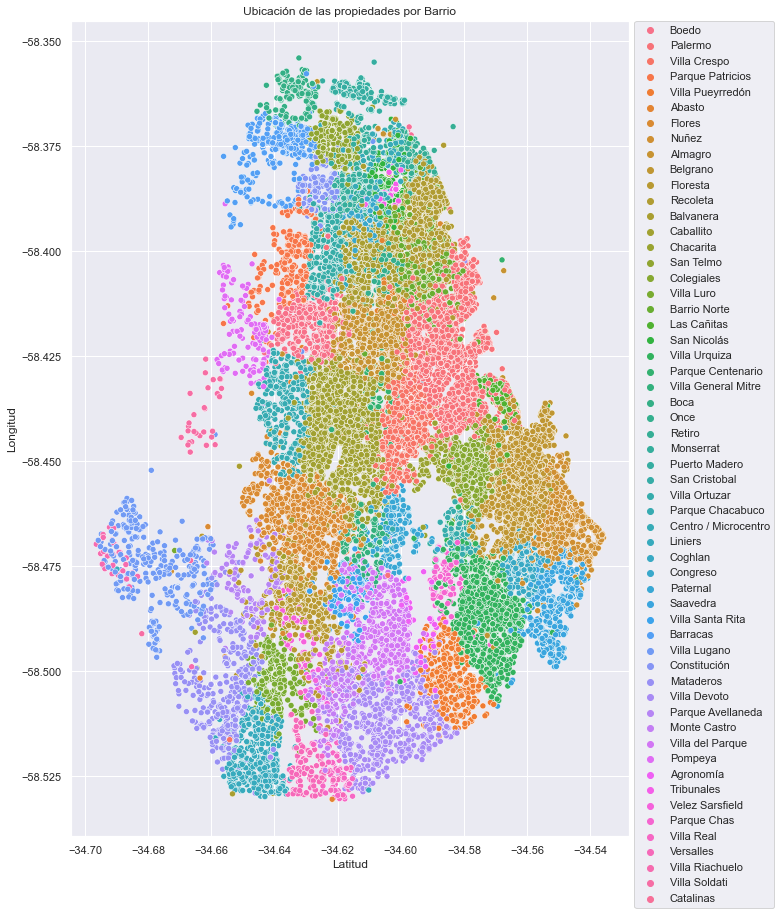

In [434]:
plt.figure(figsize=(10,15))
sns.scatterplot(x = df29['Latitud'], y = df29['Longitud'], hue =df29['Barrio_Ciudad'])
plt.legend(bbox_to_anchor=(1.01, 1),
           borderaxespad=0)
plt.title('Ubicación de las propiedades por Barrio')
plt.show()

Según lo que vemos en el gráfico, loos barrios son parecidos según su ubicación. Ahora veamos que pasa pasa cuando aplicamos un algoritmo de clusterización a los datos. Pero antes veremos si hay datos faltantes ya que este algoritmo no funciona con NaN.

In [274]:
df29.isnull().sum() 

Latitud                2866
Longitud               2879
ZonaBA_CABA               0
Barrio_Ciudad             0
Habitaciones              0
Dormitorios               0
Baños                  1825
Superficie_Total       6988
Superficie_cubierta    7285
Precio                    0
Tipo_de_propiedad         0
dtype: int64

In [276]:
cluster_data=df29.dropna()

In [277]:
cluster_data.isnull().sum()

Latitud                0
Longitud               0
ZonaBA_CABA            0
Barrio_Ciudad          0
Habitaciones           0
Dormitorios            0
Baños                  0
Superficie_Total       0
Superficie_cubierta    0
Precio                 0
Tipo_de_propiedad      0
dtype: int64

In [389]:
X1=cluster_data.iloc[:,[0,1]].values

C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0, 0.5, 'Latitud')

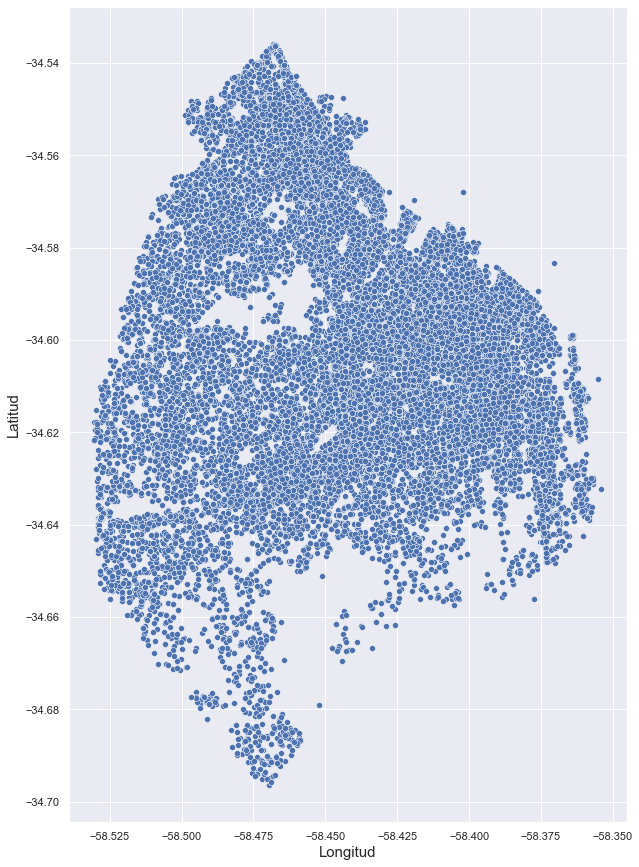

In [390]:
plt.figure(figsize=(10,15))
p=sns.scatterplot(X1[:,1], X1[:,0])
p.set_xlabel("Longitud",fontsize=15)
p.set_ylabel("Latitud",fontsize=15)

Veamos si KMeans detecta clusters en este grupo de datos

Primero veamos cuantos barrios hay en la Ciudadde Buenos Aires para incluir este valor en el análsis:

In [423]:
df29['Barrio_Ciudad'].describe()

count       56422
unique         57
top       Palermo
freq         6799
Name: Barrio_Ciudad, dtype: object

Como podemos ver con la funsión describe, tenemos 57 valores únicos o barrios. Ahora veamos si el KMeans los detecta

In [424]:
from sklearn.cluster import KMeans

# Especificamos el numero adecuado de clusters en cada caso
kmeans_3 = KMeans(n_clusters=2, random_state=0)
kmeans_4 = KMeans(n_clusters=4, random_state=0)
kmeans_5 = KMeans(n_clusters=57, random_state=0) # número de barrios


In [425]:
kmeans_3.fit(X1)
kmeans_4.fit(X1)
kmeans_5.fit(X1)

KMeans(n_clusters=57, random_state=0)

In [426]:
etiquetas_3 = kmeans_3.labels_
print(etiquetas_3.shape)

(45667,)


In [427]:
centros_3 = kmeans_3.cluster_centers_
print(centros_3)

[[-34.60365209 -58.40726137]
 [-34.59300309 -58.47041154]]


In [428]:
etiquetas_4 = kmeans_4.labels_
centros_4= kmeans_4.cluster_centers_

In [429]:
etiquetas_5 = kmeans_5.labels_
centros_5 = kmeans_5.cluster_centers_

C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


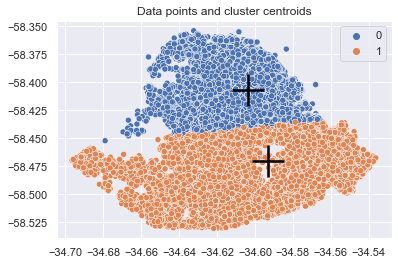

In [430]:
sns.scatterplot(X1[:, 0], X1[:, -1], hue = etiquetas_3)
sns.scatterplot(centros_3[:, 0], centros_3[:, 1],color='black', marker="+", s=1000)
plt.title('Data points and cluster centroids')
plt.show()

En este primer prueba vemos que separa claramente los barrios del Norte y del Sur. 

C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


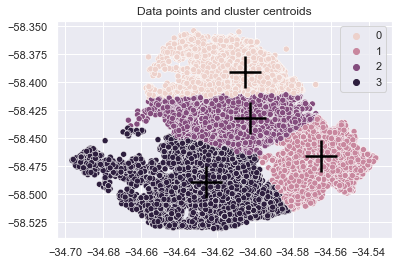

In [431]:
sns.scatterplot(X1[:, 0], X1[:, -1], hue = etiquetas_4)
sns.scatterplot(centros_4[:, 0], centros_4[:, 1],color='black', marker="+", s=1000)
plt.title('Data points and cluster centroids')
plt.show()

En este caso tenemos que el algoritmo separa a las propiedades en 4 grupos: Norte, Centro, Sur y Este. 

C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


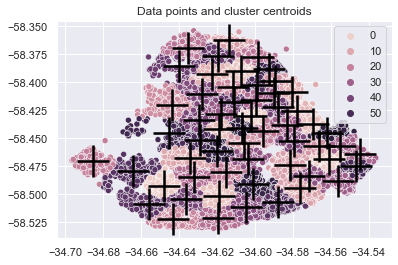

In [432]:
sns.scatterplot(X1[:, 0], X1[:, -1], hue = etiquetas_5)
sns.scatterplot(centros_5[:, 0], centros_5[:, 1],color='black', marker="+", s=1000)
plt.title('Data points and cluster centroids')
plt.show()

Lo que podemos ver es que el algoritmo praticamente reconoce los 57 barrios en los que está dividida la Ciudad de Buenos Aires.

**METODO ELBOW**

Con el método Elbow buscamos encontrar la mejor cantidad K de clusters que ajustan a nuestro problema. Para esto mide la distancia de cada punto a su centroide.

In [437]:
# Preparamos una lista donde vamos a ir agregando las distancias medias
Sum_of_squared_distances1 = []
# Fiteammos un modelo para cada numero de cluster que queremos testear
K1 = np.arange(2,57)
for k in K1:
    # Definimos y entrenamos el modelo
    km = KMeans(n_clusters=k)
    km1 = km.fit(X1)
    # Calculamos la distancia media y agregamos a la lista
    distancia_total1 = km1.inertia_
    distancia_media1 = np.divide(distancia_total1,X1.shape[0])
    Sum_of_squared_distances1.append(distancia_media1)

Graficamos la distancia media en función del número de clústers. En este gráfico podemos observar el compromiso entre cantidades de clusters y
la distancia media de los puntos a su centroide para un dataset. La tendencia de este gráfico, en el que hay una caída brusca y posteriormente
una baja sostenida, es usual en la metodología K-means. 

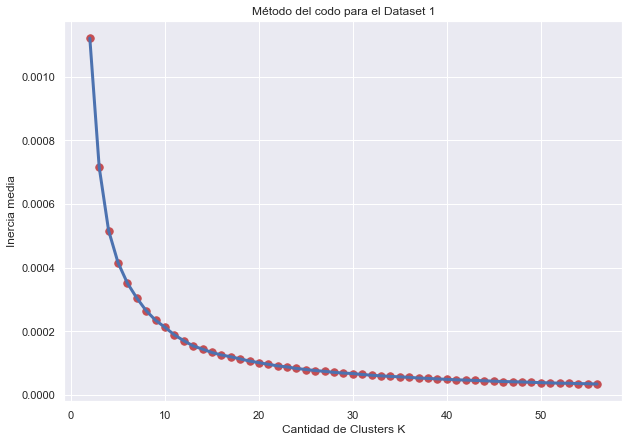

In [438]:
plt.figure(figsize = (10,7))
plt.plot(K1, Sum_of_squared_distances1, lw=3)
plt.scatter(K1, Sum_of_squared_distances1,s=55,c='r')
plt.xlabel('Cantidad de Clusters K')
plt.ylabel('Inercia media')
plt.title('Método del codo para el Dataset 1')

plt.show()

¿Cuál es el número óptimo de clusters? El número óptimo se encuentra cuando la curva detiene la caída abrupta y empieza a disminuir lentamente. Con un poco
de imaginación, la curva tiene forma de brazo flexionado. De ahí el nombre del método - en español, codo - para obtener el valor óptimo de K, que suele encontrarse en la punta del codo, en este caso en k=4.

### **Silhouette**

Una característica de un buen agrupamiento de puntos es la separación entre cada cluster. El Silhouette Score nos dice exactamente eso, ya que analiza si cada nodo está más cerca de su comunidad que del resto (20 min aprox). 

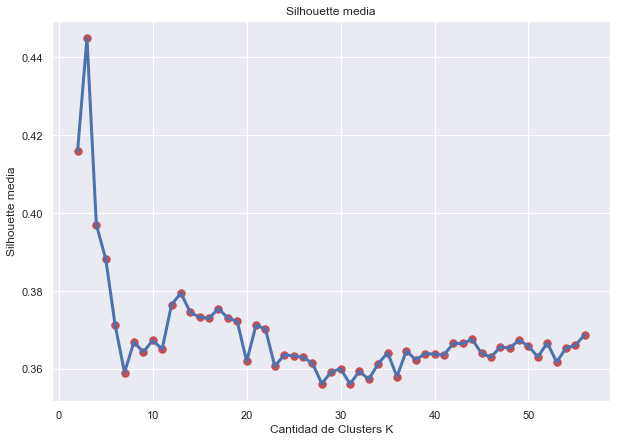

In [439]:
# Preparamos una lista donde vamos a ir agregando los valores medios de silhouette
lista_sil2 = []
# Fiteammos un modelo para cada numero de cluster que queremos testear
for k in range(2,57):
    # Definimos y entrenamos el modelo
    km = KMeans(n_clusters=k)
    km2 = km.fit(X1)
    
    # Tomamos las etiquetas
    etiquetas2 = km2.labels_
    
    # Calculamos el silhouette 
    valor_medio_sil2 = silhouette_score(X1, etiquetas2)
    lista_sil2.append(valor_medio_sil2)
    
plt.figure(figsize = (10,7))
plt.plot(K1, lista_sil2, lw=3)
plt.scatter(K1, lista_sil2,s=55,c='r')
plt.xlabel('Cantidad de Clusters K')
plt.ylabel('Silhouette media')
plt.title('Silhouette media')

plt.show()

El Silhouette promedio va del -1 al 1, donde en 1 los clusters están bien separados (es lo que solemos buscar), en 0 están cerca y en -1 el los clusters están mezclados. En este caso el mejor número de clusters parece ser k=2 que es el que arroja el Silhouette score más alto, lo cual coincide con la primera  conclusión sobre el númeor de clústers.  Dadas estas discrepancias etre ambos métodos para determinar el mejor número de clusters, graficaremos y analizaremos los Silhouette Scores de cada punto.
Para entender mejor el gráfico:
1. En el eje x está el valor de Silhouette y en el eje y los clusters.
2. El valor de silhouette de cada instancia está graficado como una barrita muy finita. Están todas las instancias graficadas, ordenadas de mayor a menor.
3. La línea punteada roja representa el Silhouette promedio de toda la partición.

Si vemos barras en la orientación contraria (negativa) indica que los clusters están mezclados


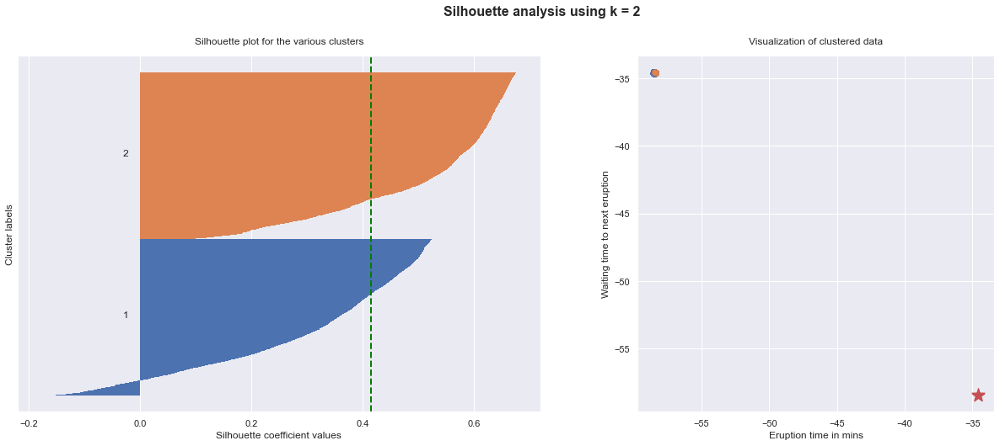

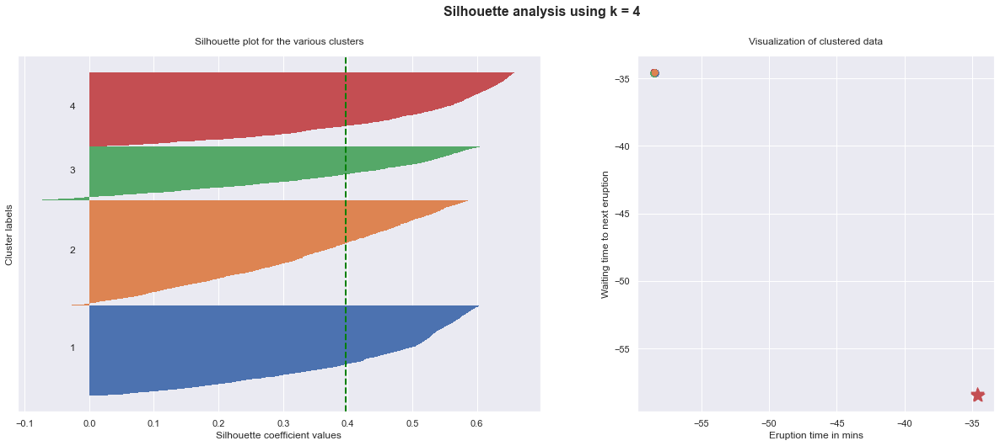

In [506]:
# Aca ponen el Dataset con el que quieren trabajar
X_std1 = X1
# Aca definen la lista de ks para los cuales quieren hacer un gráfico
lista_k1 = [2, 4]

for i, k in enumerate(lista_k1):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    
    # Run the Kmeans algorithm
    km3 = KMeans(n_clusters=k)
    labels1 = km3.fit_predict(X_std1)
    centroids1 = km3.cluster_centers_

    # Get silhouette samples
    silhouette_vals1 = silhouette_samples(X_std1, labels1)

    # Silhouette plot
    y_ticks = []
    y_lower, y_upper = 0, 0
    for i, cluster in enumerate(np.unique(labels1)):
        cluster_silhouette_vals1 = silhouette_vals1[labels1 == cluster]
        cluster_silhouette_vals1.sort()
        y_upper += len(cluster_silhouette_vals1)
        ax1.barh(range(y_lower, y_upper), cluster_silhouette_vals1, edgecolor='none', height=1)
        ax1.text(-0.03, (y_lower + y_upper) / 2, str(i + 1))
        y_lower += len(cluster_silhouette_vals1)

    # Get the average silhouette score and plot it
    avg_score = np.mean(silhouette_vals1)
    ax1.axvline(avg_score, linestyle='--', linewidth=2, color='green')
    ax1.set_yticks([])
    ax1.set_xlabel('Silhouette coefficient values')
    ax1.set_ylabel('Cluster labels')
    ax1.set_title('Silhouette plot for the various clusters', y=1.02);
    # Scatter plot of data colored with labels
    ax2.scatter(X_std1[:, 1], X_std1[:, 0], c=['C{}'.format(xx) for xx in labels1])
    ax2.scatter(centroids1[:, 0], centroids1[:, 1], marker='*', c='r', s=250)
  
    ax2.set_xlabel('Eruption time in mins')
    ax2.set_ylabel('Waiting time to next eruption')
    ax2.set_title('Visualization of clustered data', y=1.02)
    ax2.set_aspect('equal')
    plt.tight_layout()
    plt.suptitle(f'Silhouette analysis using k = {k}',
                 fontsize=16, fontweight='semibold', y=1.05)

Un aspecto impotante para analizar de estos gráficos es la forma de las barras. Cuanto más rectangulares sean las barras es mejor, significa que los clusters son más homogeneos y compactos. Si la forma de la barra tiende a ser triangular significa lo contrario, los clusters están más dispersos. En base a este análisis podemos decir que el mejor número de clusters es k=2 (Norte y Sur).

### **LATITUD vs PRECIO**

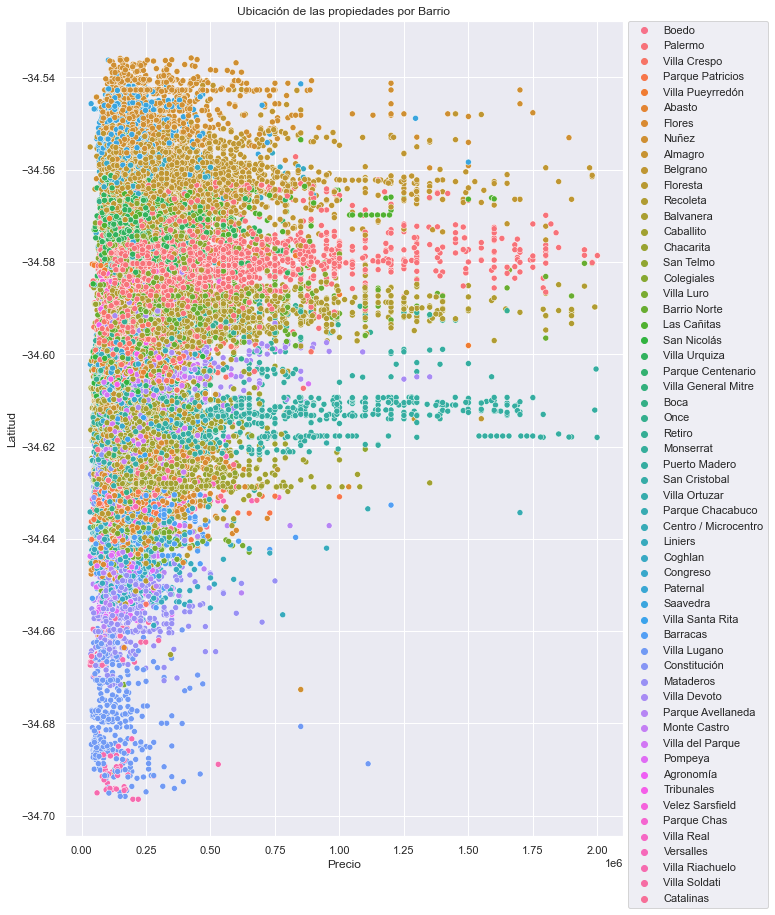

In [246]:
plt.figure(figsize=(10,15))
sns.scatterplot(x = df29['Precio'], y = df29['Latitud'], hue =df29['Barrio_Ciudad'])
plt.legend(bbox_to_anchor=(1.01, 1),
           borderaxespad=0)
plt.title('Ubicación de las propiedades por Barrio')
plt.show()

Según lo que vemos en el gráfico, podemos agrupar los barrios según dos catagorías 1- Norte-Sur y 2- barrios con propiedades con precio menor o mayor a 750 mil dólares. Lo que podemos ver es que tenemos dos grupos de barrios uno se ubica en el cuadrante norte y con precios que superan los 750 mil dólares (Nuñez, Belgrano, Saavedra, Las Cañitas, Palermo, Recoleta, Barrio Norte, Retiro y Puerto Madero). Por otro lado, el otro grupo se ubica en el cuadrante sur y con precios por debajo de los 750 mil dólares (Villa Soldati, Villa Riachuelo, Villa Lugano, Constitución, Mataderos, Pompeya, Once y Balvanera). 

In [284]:
X=cluster_data.iloc[:,[0,9]].values

C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0, 0.5, 'Latitud')

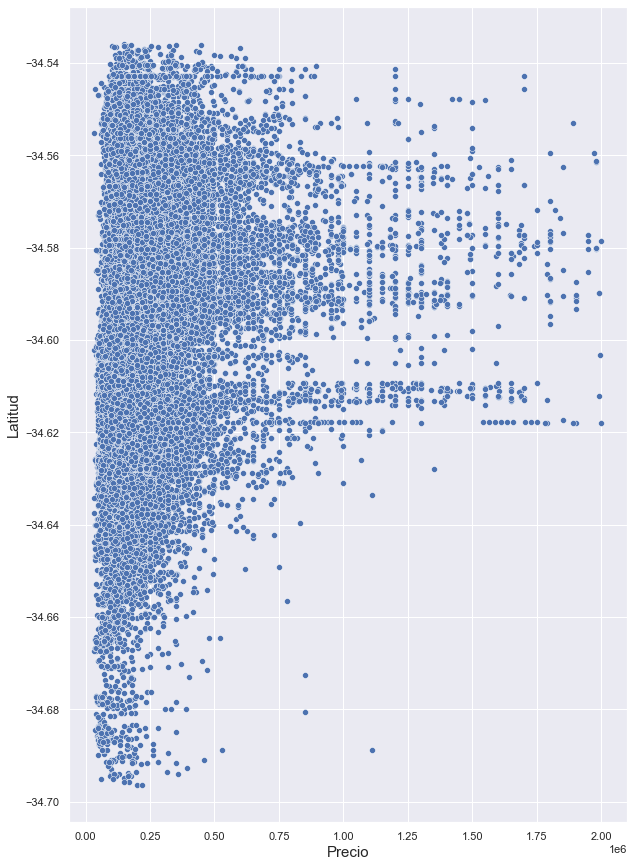

In [367]:
plt.figure(figsize=(10,15))
p=sns.scatterplot(X[:,1], X[:,0])
p.set_xlabel("Precio",fontsize=15)
p.set_ylabel("Latitud",fontsize=15)

Veamos si KMeans detecta clusters en este grupo de datos

In [376]:
from sklearn.cluster import KMeans

# Especificamos el numero adecuado de clusters en cada caso
kmeans_0 = KMeans(n_clusters=2, random_state=0)
kmeans_1 = KMeans(n_clusters=4, random_state=0)
kmeans_2 = KMeans(n_clusters=6, random_state=0)

In [377]:
kmeans_0.fit(X)
kmeans_1.fit(X)
kmeans_2.fit(X)

KMeans(n_clusters=6, random_state=0)

In [384]:
etiquetas_0 = kmeans_0.labels_
print(etiquetas_0.shape)

(45667,)


In [385]:
centros_0 = kmeans_0.cluster_centers_
print(centros_0)

[[-3.45995290e+01  1.90643682e+05]
 [-3.45859773e+01  8.19761408e+05]]


In [380]:
etiquetas_1 = kmeans_1.labels_
centros_1= kmeans_1.cluster_centers_

In [381]:
etiquetas_2 = kmeans_2.labels_
centros_2 = kmeans_2.cluster_centers_

C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


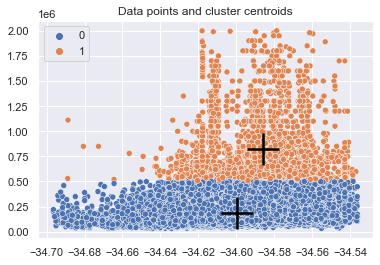

In [386]:
sns.scatterplot(X[:, 0], X[:, -1], hue = etiquetas_0)
sns.scatterplot(centros_0[:, 0], centros_0[:, 1],color='black', marker="+", s=1000)
plt.title('Data points and cluster centroids')
plt.show()

Como podemos ver, al establecer un k=2 divide a los propiedades en dos grupos 1- de 33 mil dolares a 500 mil dólares y 2- de 500 mil a 2 millones de dólares.

C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


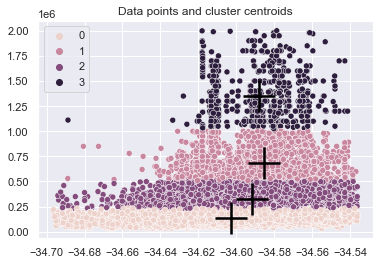

In [373]:
sns.scatterplot(X[:, 0], X[:, -1], hue = etiquetas_1)
sns.scatterplot(centros_1[:, 0], centros_1[:, 1],color='black', marker="+", s=1000)
plt.title('Data points and cluster centroids')
plt.show()

Para un k=4 tenemos la siguiente separación: 1- 33 mil a 250 mil 2- 250 mil a 500 mil 3- 500 mil a 1 millón 4- 1 millón a 2 millones

C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


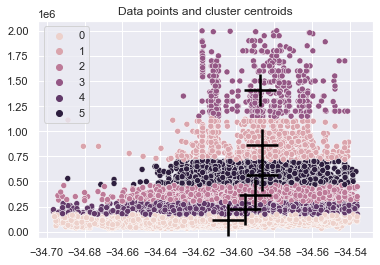

In [309]:
sns.scatterplot(X[:, 0], X[:, -1], hue = etiquetas_2)
sns.scatterplot(centros_2[:, 0], centros_[:, 1],color='black', marker="+", s=1000)
plt.title('Data points and cluster centroids')
plt.show()

Lo que podemos ver es que KMeans separa este grupo de datos de acuerdo al Precio y no a Latitud. Al separar los datos en dos según el Precio baja el umbral que anteriormente habíamos establecido a ojo (500 mil dólares en este caso). A simple vista pareciera que el mejor número de clusters es k=2, ya que se aproxima mucho al primer análsis que habíamos hecho.  

**METODO ELBOW**

Con el método Elbow buscamos encontrar la mejor cantidad K de clusters que ajustan a nuestro problema. Para esto mide la distancia de cada punto a su centroide.

In [310]:
# Preparamos una lista donde vamos a ir agregando las distancias medias
Sum_of_squared_distances = []
# Fiteammos un modelo para cada numero de cluster que queremos testear
K = np.arange(2,14)
for k in K:
    # Definimos y entrenamos el modelo
    km = KMeans(n_clusters=k)
    km = km.fit(X)
    # Calculamos la distancia media y agregamos a la lista
    distancia_total = km.inertia_
    distancia_media = np.divide(distancia_total,X.shape[0])
    Sum_of_squared_distances.append(distancia_media)

Graficamos la distancia media en función del número de clústers. En este gráfico podemos observar el compromiso entre cantidades de clusters y
la distancia media de los puntos a su centroide para un dataset. La tendencia de este gráfico, en el que hay una caída brusca y posteriormente
una baja sostenida, es usual en la metodología K-means. 

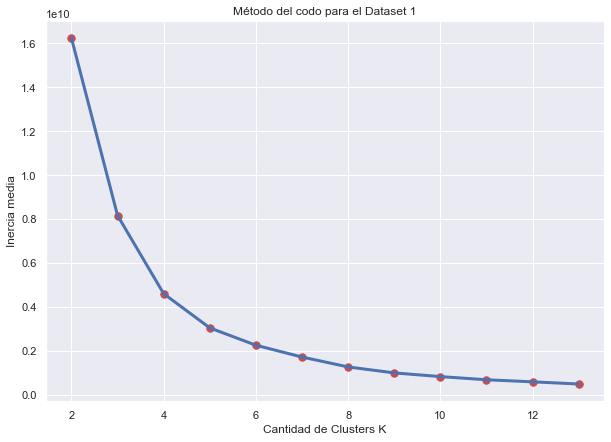

In [311]:
plt.figure(figsize = (10,7))
plt.plot(K, Sum_of_squared_distances, lw=3)
plt.scatter(K, Sum_of_squared_distances,s=55,c='r')
plt.xlabel('Cantidad de Clusters K')
plt.ylabel('Inercia media')
plt.title('Método del codo para el Dataset 1')

plt.show()

¿Cuál es el número óptimo de clusters? El número óptimo se encuentra cuando la curva detiene la caída abrupta y empieza a disminuir lentamente. Con un poco
de imaginación, la curva tiene forma de brazo flexionado. De ahí el nombre del método - en español, codo - para obtener el valor óptimo de K, que suele encontrarse en la punta del codo, en este caso en k=4.

### **Silhouette**

Una característica de un buen agrupamiento de puntos es la separación entre cada cluster. El Silhouette Score nos dice exactamente eso, ya que analiza si cada nodo está más cerca de su comunidad que del resto. 

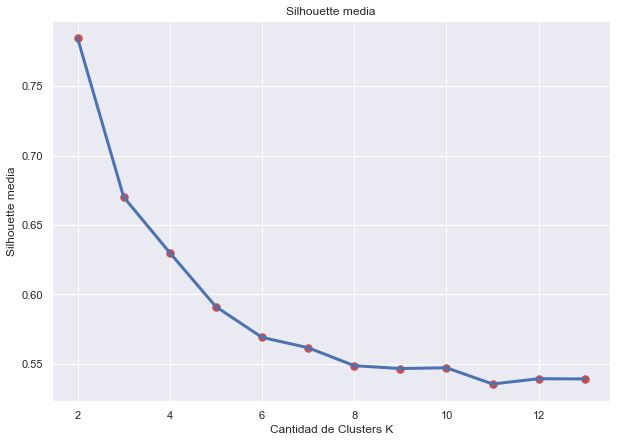

In [361]:
# Preparamos una lista donde vamos a ir agregando los valores medios de silhouette
lista_sil = []
# Fiteammos un modelo para cada numero de cluster que queremos testear
for k in range(2,14):
    # Definimos y entrenamos el modelo
    km = KMeans(n_clusters=k)
    km = km.fit(X)
    
    # Tomamos las etiquetas
    etiquetas = km.labels_
    
    # Calculamos el silhouette 
    valor_medio_sil = silhouette_score(X, etiquetas)
    lista_sil.append(valor_medio_sil)
    
plt.figure(figsize = (10,7))
plt.plot(K, lista_sil, lw=3)
plt.scatter(K, lista_sil,s=55,c='r')
plt.xlabel('Cantidad de Clusters K')
plt.ylabel('Silhouette media')
plt.title('Silhouette media')

plt.show()

El Silhouette promedio va del -1 al 1, donde en 1 los clusters están bien separados (es lo que solemos buscar), en 0 están cerca y en -1 el los clusters están mezclados. En este caso el mejor número de clusters parece ser k=2 que es el que arroja el Silhouette score más alto, lo cual coincide con la primera  conclusión sobre el númeor de clústers.  

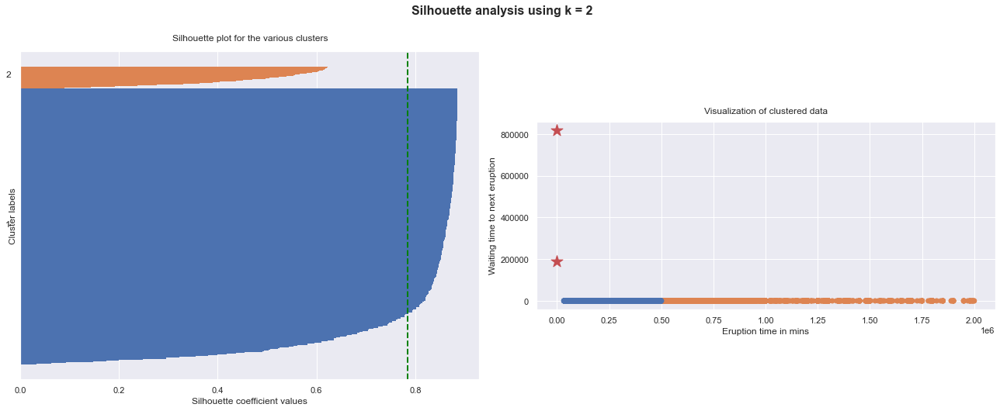

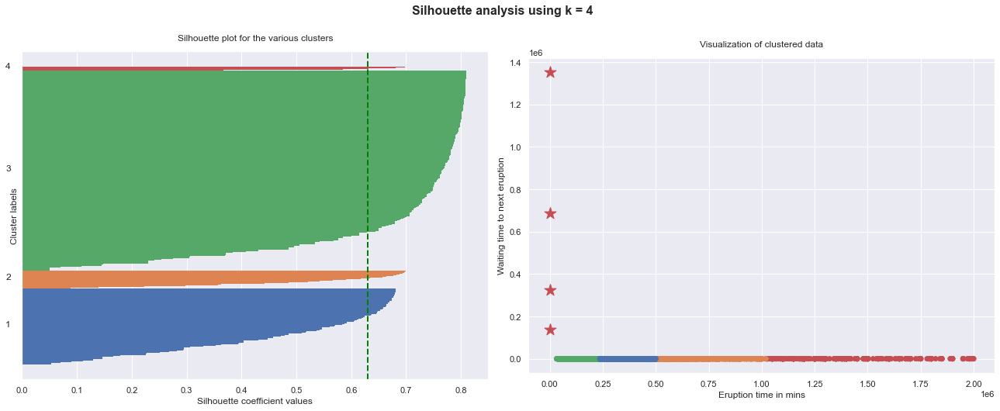

In [507]:
# Aca ponen el Dataset con el que quieren trabajar
X_std = X
# Aca definen la lista de ks para los cuales quieren hacer un gráfico
lista_k = [2, 4]

for i, k in enumerate(lista_k):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    
    # Run the Kmeans algorithm
    km = KMeans(n_clusters=k)
    labels = km.fit_predict(X_std)
    centroids = km.cluster_centers_

    # Get silhouette samples
    silhouette_vals = silhouette_samples(X_std, labels)

    # Silhouette plot
    y_ticks = []
    y_lower, y_upper = 0, 0
    for i, cluster in enumerate(np.unique(labels)):
        cluster_silhouette_vals = silhouette_vals[labels == cluster]
        cluster_silhouette_vals.sort()
        y_upper += len(cluster_silhouette_vals)
        ax1.barh(range(y_lower, y_upper), cluster_silhouette_vals, edgecolor='none', height=1)
        ax1.text(-0.03, (y_lower + y_upper) / 2, str(i + 1))
        y_lower += len(cluster_silhouette_vals)

    # Get the average silhouette score and plot it
    avg_score = np.mean(silhouette_vals)
    ax1.axvline(avg_score, linestyle='--', linewidth=2, color='green')
    ax1.set_yticks([])
    ax1.set_xlabel('Silhouette coefficient values')
    ax1.set_ylabel('Cluster labels')
    ax1.set_title('Silhouette plot for the various clusters', y=1.02);
    # Scatter plot of data colored with labels
    ax2.scatter(X_std[:, 1], X_std[:, 0], c=['C{}'.format(xx) for xx in labels])
    ax2.scatter(centroids[:, 0], centroids[:, 1], marker='*', c='r', s=250)
  
    ax2.set_xlabel('Eruption time in mins')
    ax2.set_ylabel('Waiting time to next eruption')
    ax2.set_title('Visualization of clustered data', y=1.02)
    ax2.set_aspect('equal')
    plt.tight_layout()
    plt.suptitle(f'Silhouette analysis using k = {k}',
                 fontsize=16, fontweight='semibold', y=1.05)

En este caso es dificil definir cual es mejor número de clusters. Lo positivo es que con los k no se obtienen valores negativos. En el caso de de k=2 los cluster están muy desproporcionados y uno de ellos no alcanza el valor promedio. En el caso de k=4 los clusters están más proporcionados y todos superan el promedio. Por este motivo para este grupo de variables el mejor k es igual a 4. 

### **PCA y KMEANS**

Existen diversas razones para utilizar un paso de reducción de dimensionalidad como PCA antes de la clusterización de los datos. ¿El principal de ellos? Al reducir la cantidad de variables, estamos mejorando el rendimiento de nuestro algoritmo. Además de eso, al disminuir el número de variables, también se reduce el ruido.


In [441]:
df29.head()

,Latitud,Longitud,ZonaBA_CABA,Barrio_Ciudad,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio,Tipo_de_propiedad
1,-34.624056,-58.412110,Capital Federal,Boedo,2.0,1.0,2.0,70.0,58.0,159000.0,PH
2,-34.593569,-58.427474,Capital Federal,Palermo,2.0,1.0,1.0,45.0,45.0,125000.0,PH
3,-34.581294,-58.436754,Capital Federal,Palermo,2.0,1.0,1.0,85.0,50.0,295000.0,PH
5,-34.593779,-58.441239,Capital Federal,Villa Crespo,2.0,1.0,1.0,56.0,56.0,150000.0,PH
6,-34.600988,-58.433061,Capital Federal,Villa Crespo,2.0,1.0,1.0,70.0,70.0,159500.0,PH


In [443]:
df_pca = df29.drop(['ZonaBA_CABA','Barrio_Ciudad','Tipo_de_propiedad'], axis=1)
df_pca.head()

,Latitud,Longitud,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio
1,-34.624056,-58.412110,2.0,1.0,2.0,70.0,58.0,159000.0
2,-34.593569,-58.427474,2.0,1.0,1.0,45.0,45.0,125000.0
3,-34.581294,-58.436754,2.0,1.0,1.0,85.0,50.0,295000.0
5,-34.593779,-58.441239,2.0,1.0,1.0,56.0,56.0,150000.0
6,-34.600988,-58.433061,2.0,1.0,1.0,70.0,70.0,159500.0


Antes de aplicar el Análsis de Componente Principales o PCA voy a tratar los datos faltantes

In [453]:
print(df_pca.isnull().sum())

Latitud                2866
Longitud               2879
Habitaciones              0
Dormitorios               0
Baños                  1825
Superficie_Total       6988
Superficie_cubierta    7285
Precio                    0
dtype: int64


Como podemos ver, las variables numéricas tienen diferente escala. Esto afecta al algoritmo KMeans ya que le asigna mayor peso a las variables de mayor magnitud. Por este motivo es necesario estandarizar o escalar los valores de las variables (explicado en la parte B en preprocesameinto de datos). Para esto vamos a utlizar la clase de Sklearn StandarScaler.  

In [446]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans 
from sklearn.decomposition import PCA 

In [458]:
scaler= StandardScaler()
df_pca_std= scaler.fit_transform(df_pca)
pca_std=pd.DataFrame(df_pca_std, columns=['Latitud','Longitud', 'Habitaciones',	'Dormitorios',	'Baños', 'Superficie_Total', 'Superficie_cubierta',	'Precio'])
pca_std.head()

,Latitud,Longitud,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio
0,-0.938479,0.684802,-0.720682,-0.896407,0.650180,-0.315428,-0.380659,-0.367734
1,0.226297,0.286475,-0.720682,-0.896407,-0.677488,-0.686168,-0.628213,-0.528226
2,0.695274,0.045876,-0.720682,-0.896407,-0.677488,-0.092983,-0.533000,0.274235
3,0.218272,-0.070398,-0.720682,-0.896407,-0.677488,-0.523042,-0.418744,-0.410217
4,-0.057158,0.141612,-0.720682,-0.896407,-0.677488,-0.315428,-0.152147,-0.365373


In [460]:
imp= KNNImputer(n_neighbors=2,weights='uniform', metric='nan_euclidean')

imput_1= imputer.fit_transform(pca_std)

In [463]:
imput_2=pd.DataFrame(imput_1, columns=['Latitud','Longitud', 'Habitaciones',	'Dormitorios',	'Baños', 'Superficie_Total', 'Superficie_cubierta',	'Precio'])
imput_2.head()

,Latitud,Longitud,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio
0,-0.938479,0.684802,-0.720682,-0.896407,0.650180,-0.315428,-0.380659,-0.367734
1,0.226297,0.286475,-0.720682,-0.896407,-0.677488,-0.686168,-0.628213,-0.528226
2,0.695274,0.045876,-0.720682,-0.896407,-0.677488,-0.092983,-0.533000,0.274235
3,0.218272,-0.070398,-0.720682,-0.896407,-0.677488,-0.523042,-0.418744,-0.410217
4,-0.057158,0.141612,-0.720682,-0.896407,-0.677488,-0.315428,-0.152147,-0.365373


In [464]:
print(imput_2.isnull().sum())

Latitud                0
Longitud               0
Habitaciones           0
Dormitorios            0
Baños                  0
Superficie_Total       0
Superficie_cubierta    0
Precio                 0
dtype: int64


In [468]:
pca=PCA()
pca.fit(imput_2)

PCA()

In [469]:
print(pca.explained_variance_ratio_)

[0.56458349 0.13613656 0.13015246 0.07208848 0.0515842  0.02907188
 0.00856712 0.0078158 ]


Ahora, debemos decidir cuántos componentes nos gustaría mantener en función de la gráfica de varianza acumulada.

Text(0, 0.5, 'Varianza explicada acumulada')

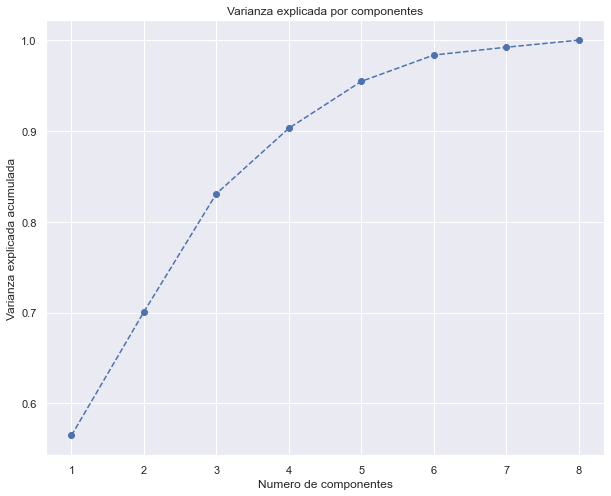

In [471]:
plt.figure(figsize=(10,8))
plt.plot(range(1,9), pca.explained_variance_ratio_.cumsum(), marker='o', linestyle='--')
plt.title('Varianza explicada por componentes')
plt.xlabel('Numero de componentes')
plt.ylabel('Varianza explicada acumulada')

El gráfico muestra la cantidad de varianza capturada (en el eje y) dependiendo del número de componentes que incluimos (el eje x). Una regla general es preservar alrededor del 80% de la varianza. Entonces, en este caso, decidimos mantener 3 componentes.

Como tercer paso, realizamos PCA con el número de componentes elegido.

In [473]:
pca_1= PCA(n_components=3)
pca_1.fit(imput_2)
pca_1.transform(imput_2)

array([[-0.8593217 ,  0.39199066,  0.98523557],
       [-1.64415279, -0.38277184,  0.27248922],
       [-1.03640317, -0.97027318,  0.0167748 ],
       ...,
       [ 0.81491272, -1.20446005,  0.22284743],
       [ 3.05371375, -0.72848136,  0.19189719],
       [ 1.6276008 , -0.84178919,  0.28670683]])

In [474]:
scores_pca=pca_1.transform(imput_2)

Incorporaremos los PCA scores recién obtenidos en el algoritmo de K-means. Así, podemos realizar la segmentación en función de las puntuaciones de los componentes principales en lugar de las variables originales.

Veamos cual es el mejor número de clusters con estos componentes principales. WCSS (within cluster Sum of Squares). 

In [478]:
wcss=[]
for i in range(1,20):
    kmeans_pca= KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans_pca.fit(scores_pca)
    wcss.append(kmeans_pca.inertia_)

<function matplotlib.pyplot.show(close=None, block=None)>

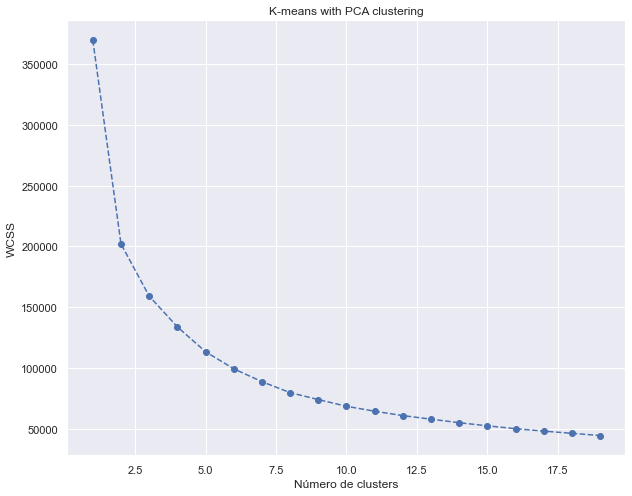

In [482]:
plt.figure(figsize=(10,8))
plt.plot(range(1,20), wcss, marker='o', linestyle='--')
plt.xlabel('Número de clusters')
plt.ylabel('WCSS')
plt.title('K-means with PCA clustering')
plt.show

A partir de este gráfico, determinamos la cantidad de clústeres que nos gustaría mantener. A tal efecto, utilizamos el método del codo (Elbow). El enfoque consiste en buscar un cambio brusco o un codo en el gráfico WCSS. Por lo general, la parte del gráfico antes del codo estaría disminuyendo abruptamente, mientras que la parte posterior, mucho más suave. En este caso, el codo se produce par aun k=3. Por lo tanto, mantendremos una solución de 3 clústeres.

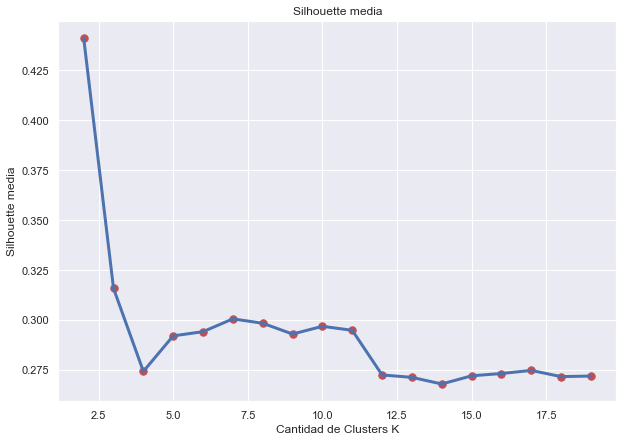

In [501]:
# Preparamos una lista donde vamos a ir agregando los valores medios de silhouette
lista_sil = []
# Fiteammos un modelo para cada numero de cluster que queremos testear
for k in range(2,20):
    # Definimos y entrenamos el modelo
    km = KMeans(n_clusters=k)
    km = km.fit(scores_pca)
    
    # Tomamos las etiquetas
    etiquetas = km.labels_
    
    # Calculamos el silhouette 
    valor_medio_sil = silhouette_score(scores_pca, etiquetas)
    lista_sil.append(valor_medio_sil)
    
plt.figure(figsize = (10,7))
plt.plot(range(2,20), lista_sil, lw=3)
plt.scatter(range(2,20), lista_sil,s=55,c='r')
plt.xlabel('Cantidad de Clusters K')
plt.ylabel('Silhouette media')
plt.title('Silhouette media')

plt.show()

Al igual que el caso anterior el mejor scorre de Silhouette se obtiene con un k=2. Veamos los gráficos del Silhouette para sacar una conclusión. 

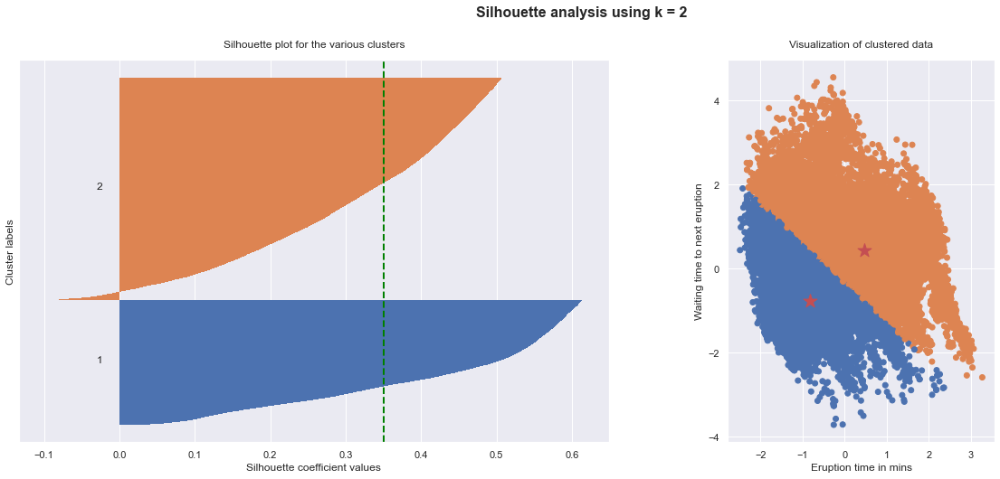

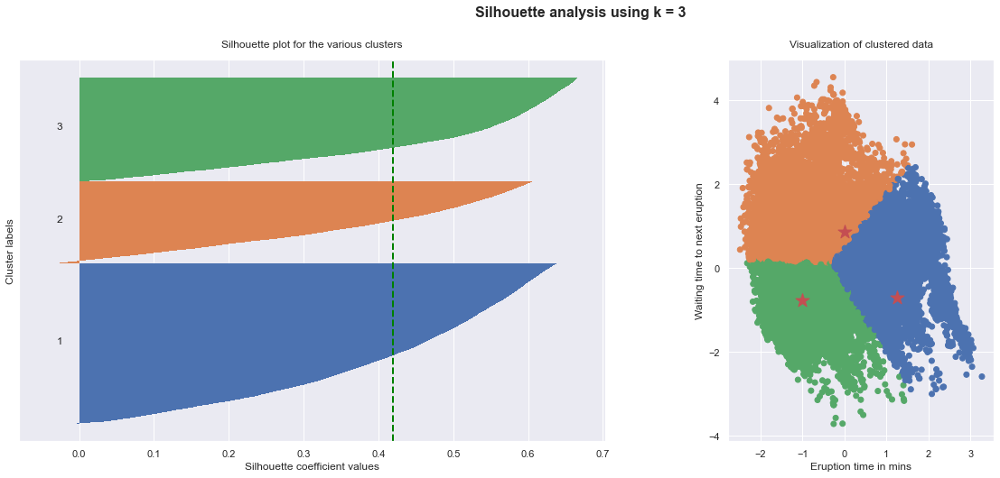

In [510]:
# Aca ponen el Dataset con el que quieren trabajar
X_std = df_segm_pca_kmeans.iloc[:,[-4,-3]].values
# Aca definen la lista de ks para los cuales quieren hacer un gráfico
lista_k = [2, 3]

for i, k in enumerate(lista_k):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    
    # Run the Kmeans algorithm
    km = KMeans(n_clusters=k)
    labels = km.fit_predict(X_std)
    centroids = km.cluster_centers_

    # Get silhouette samples
    silhouette_vals = silhouette_samples(X_std, labels)

    # Silhouette plot
    y_ticks = []
    y_lower, y_upper = 0, 0
    for i, cluster in enumerate(np.unique(labels)):
        cluster_silhouette_vals = silhouette_vals[labels == cluster]
        cluster_silhouette_vals.sort()
        y_upper += len(cluster_silhouette_vals)
        ax1.barh(range(y_lower, y_upper), cluster_silhouette_vals, edgecolor='none', height=1)
        ax1.text(-0.03, (y_lower + y_upper) / 2, str(i + 1))
        y_lower += len(cluster_silhouette_vals)

    # Get the average silhouette score and plot it
    avg_score = np.mean(silhouette_vals)
    ax1.axvline(avg_score, linestyle='--', linewidth=2, color='green')
    ax1.set_yticks([])
    ax1.set_xlabel('Silhouette coefficient values')
    ax1.set_ylabel('Cluster labels')
    ax1.set_title('Silhouette plot for the various clusters', y=1.02);
    # Scatter plot of data colored with labels
    ax2.scatter(X_std[:, 1], X_std[:, 0], c=['C{}'.format(xx) for xx in labels])
    ax2.scatter(centroids[:, 0], centroids[:, 1], marker='*', c='r', s=250)
  
    ax2.set_xlabel('Eruption time in mins')
    ax2.set_ylabel('Waiting time to next eruption')
    ax2.set_title('Visualization of clustered data', y=1.02)
    ax2.set_aspect('equal')
    plt.tight_layout()
    plt.suptitle(f'Silhouette analysis using k = {k}',
                 fontsize=16, fontweight='semibold', y=1.05)

Lo que sepuede concluir del gráfico de Silhouette, primero, es que es que al realizar PCA los resultados en la clusterización mejoran significativamente, en el gráfico se ven bien definidos los 3 grupos de datos. Segundo, el mejor k es igual a 3, se puede ver que para este número de clusters tengo menos instancias negativas y de menor magnitud, también, la distribución de los datos en los clusters es más proporcional. 

In [483]:
kmeans_pca= KMeans(n_clusters=3, init='k-means++', random_state=42)
kmeans_pca.fit(scores_pca)

KMeans(n_clusters=3, random_state=42)

Analizamos los resultados de PCA y K-Means Clustering

Antes que nada, crearemos un nuevo DataFrame. Nos permite agregar los valores de los componentes separados a nuestro conjunto de datos separados en clusters. Los scores de los componentes se almacenan en la variable "score PCA". Vamos a etiquetar los Componente 1, 2 y 3. Además, también agregamos las etiquetas "Kmeans PCA" al nuevo marco de datos.

In [485]:
df_segm_pca_kmeans=pd.concat([df_pca.reset_index(drop=True), pd.DataFrame(scores_pca)], axis=1)
df_segm_pca_kmeans.columns.values[-3:]=['Componente 1', 'Componente 2', 'Componente 3']
df_segm_pca_kmeans['Clusters Kmeans PCA']= kmeans_pca.labels_

In [488]:
df_segm_pca_kmeans.tail(30)

,Latitud,Longitud,Habitaciones,Dormitorios,Baños,Superficie_Total,Superficie_cubierta,Precio,Componente 1,Componente 2,Componente 3,Clusters Kmeans PCA
56392,NaN,NaN,1.0,1.0,1.0,60.0,53.0,120000.0,-1.876724,0.149502,0.446495,0
56393,-34.580357,-58.434867,2.0,1.0,2.0,62.0,54.0,199776.0,-0.813526,-1.053080,0.024935,0
56394,NaN,NaN,2.0,1.0,2.0,62.0,58.0,198400.0,-0.783116,-1.198950,-0.429139,0
56395,NaN,NaN,2.0,1.0,1.0,62.0,58.0,168000.0,-1.321482,-1.351343,-0.668075,0
56396,NaN,NaN,2.0,1.0,1.0,62.0,58.0,192200.0,-1.268742,-1.442982,-0.317629,0
56397,NaN,NaN,2.0,1.0,2.0,81.0,59.0,263000.0,-0.532251,-1.495584,-0.540383,0
56398,-34.578714,-58.431938,3.0,2.0,1.0,72.0,61.0,220000.0,-0.386362,-0.585777,-0.078479,0
56399,-34.580357,-58.434867,3.0,2.0,2.0,81.0,63.0,215433.0,0.172861,-0.667508,-0.121483,1
56400,-34.587237,-58.438408,3.0,2.0,2.0,90.0,64.0,268000.0,0.317568,-0.491799,-0.109276,1
56401,-34.578688,-58.435533,3.0,2.0,1.0,85.0,64.0,255000.0,-0.220498,-0.611094,-0.149901,0


Ahora debemos agregar los nombres de los segmentos a las etiquetas. Creamos una nueva columna llamada "Segmento" y mapeamos los cuatro clústeres directamente dentro de ella.

In [511]:
df_segm_pca_kmeans['Clusters']= df_segm_pca_kmeans['Clusters Kmeans PCA'].map({0:'first', 1:'Second', 2:'Third'})

**Visualización de los clusters por componentes**

Terminemos visualizando nuestros clústeres en un plano 2D. Es una visualización en 2D, por lo que debemos elegir dos componentes y usarlos como ejes. El objetivo de PCA era determinar los componentes más importantes. De esta manera, podemos estar absolutamente seguros de que los dos primeros componentes explican más varianza que el tercero.

C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<function matplotlib.pyplot.show(close=None, block=None)>

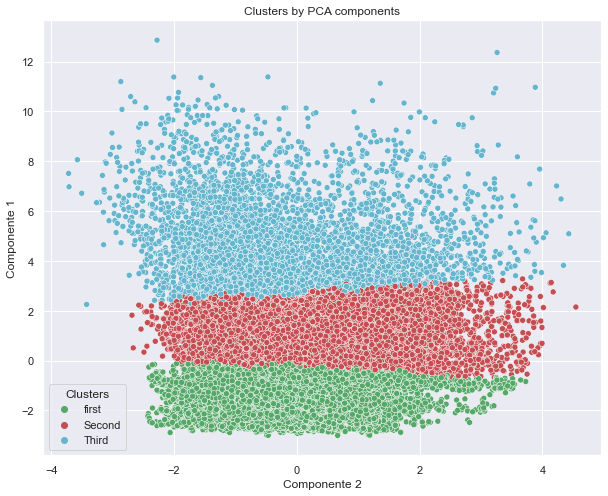

In [513]:
# Plot data by PCA components. El eje y es el primercomponente, el eje x axis es el segundo.
eje_x= df_segm_pca_kmeans['Componente 2']
eje_y= df_segm_pca_kmeans['Componente 1']
plt.figure(figsize=(10,8))
sns.scatterplot(eje_x, eje_y, hue= df_segm_pca_kmeans['Clusters'], palette=['g', 'r', 'c'])
plt.title('Clusters by PCA components')
plt.show

C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<function matplotlib.pyplot.show(close=None, block=None)>

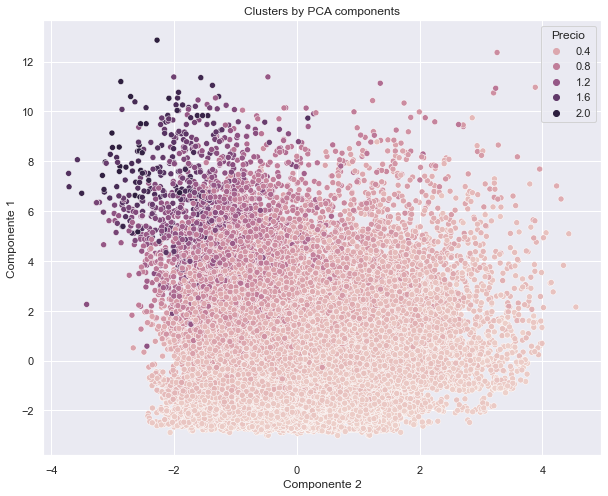

In [522]:
# Plot data by PCA components. El eje y es el primercomponente, el eje x axis es el segundo.
eje_x= df_segm_pca_kmeans['Componente 2']
eje_y= df_segm_pca_kmeans['Componente 1']
plt.figure(figsize=(10,8))
sns.scatterplot(eje_x, eje_y, hue= df_segm_pca_kmeans['Precio'])
plt.title('Clusters by PCA components')
plt.show

C:\Users\Gabriel\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<function matplotlib.pyplot.show(close=None, block=None)>

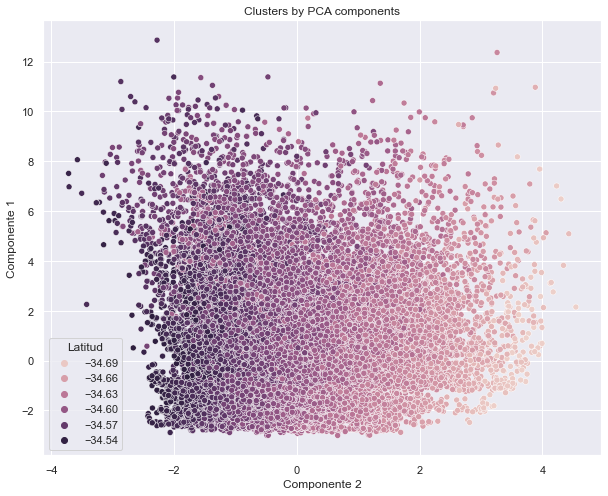

In [523]:
# Plot data by PCA components. El eje y es el primercomponente, el eje x axis es el segundo.
eje_x= df_segm_pca_kmeans['Componente 2']
eje_y= df_segm_pca_kmeans['Componente 1']
plt.figure(figsize=(10,8))
sns.scatterplot(eje_x, eje_y, hue= df_segm_pca_kmeans['Latitud'])
plt.title('Clusters by PCA components')
plt.show

De este análisis lo que podemos decir es que reduccción de dimencionalidad con PCA y clusterización con Kmeans me agrupa mis datos en 3 grandes grupos de propiedades de acuerdo a al precio 1- 33 mil  a 650 mil dólares, 2- 650 mil a 1,2 millones 3- 1,2 M a 2 M. Ampliandoce las propiedades de mayor valor en la zona norte. 

También se podría concluir que si una propiedad se encuentra a Latitud -34.69 es muy probable que su valor no supere los 400 mil dólares.